In [1]:
import numpy as np
import sklearn.datasets
import time
import random

from matplotlib import pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.optim import Adam
from torch.utils.data import TensorDataset, DataLoader

from torch import autograd
from torch.autograd import Variable

from torch.distributions import MultivariateNormal, Normal, Independent, Uniform

import math

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Energy: Neural network.

In [40]:
# Fully Connected Network
def get_activation(s_act):
    if s_act == 'relu':
        return nn.ReLU(inplace=True)
    elif s_act == 'sigmoid':
        return nn.Sigmoid()
    elif s_act == 'softplus':
        return nn.Softplus()
    elif s_act == 'linear':
        return None
    elif s_act == 'tanh':
        return nn.Tanh()
    elif s_act == 'leakyrelu':
        return nn.LeakyReLU(0.2, inplace=True)
    elif s_act == 'softmax':
        return nn.Softmax(dim=1)
    else:
        raise ValueError(f'Unexpected activation: {s_act}')


class FCNet(nn.Module):
    """fully-connected network"""
    def __init__(self, in_dim, out_dim, l_hidden=(50,), activation='sigmoid', out_activation='linear'):
        super(FCNet, self).__init__()
        l_neurons = tuple(l_hidden) + (out_dim,)
        if isinstance(activation, str):
            activation = (activation,) * len(l_hidden)
        activation = tuple(activation) + (out_activation,)

        l_layer = []
        prev_dim = in_dim
        for i_layer, (n_hidden, act) in enumerate(zip(l_neurons, activation)):
            l_layer.append(nn.Linear(prev_dim, n_hidden))
            act_fn = get_activation(act)
            if act_fn is not None:
                l_layer.append(act_fn)
            prev_dim = n_hidden

        self.net = nn.Sequential(*l_layer)
        self.in_dim = in_dim
        self.out_shape = (out_dim,) 

    def forward(self, x):
        return self.net(x)

class FFFNet(nn.Module):
    def __init__(self, in_chan=2, out_chan=2):
        """
        ConvNet tailored for MNIST (28x28 images)
        nh: multiplier for the number of filters
        """
        super(FFFNet, self).__init__()
        self.l1 = nn.Linear(in_chan,16)
        self.l2 = nn.Linear(16,64)
        self.l3 = nn.Linear(64,out_chan)

    def forward(self, x):
        x = self.l1(x)
        x = F.relu(x)
        x = self.l2(x)
        x = F.relu(x)
        x = self.l3(x)
        return x

# Two Langevin method.

The sample_langevin_new is modified from the optimizer.
The second sample_langevin is the original function.*斜体文本*

In [64]:
def sample_langevin_new(x, Energy, stepsize, n_steps, noise_scale=None, intermediate_samples=False):
    if noise_scale is None:
        noise_scale = np.sqrt(stepsize * 0.3)

    l_samples = []
    l_dynamics = []
    x.requires_grad = True

    sample_optimizer = torch.optim.SGD([x.requires_grad_()], lr=stepsize)

    for kk in range(n_steps):
        sample_optimizer.zero_grad()

        out = Energy(x)
        out.backward(torch.ones_like(out))

        torch.nn.utils.clip_grad_value_(x, 0.01)
        sample_optimizer.step()
        
        noise = torch.empty_like(x, dtype=torch.float32).normal_(0, noise_scale)
        with torch.no_grad():
          x.add_(noise)
        #if kk % 50 == 0:
        #  print(out.detach().mean(), torch.std_mean(x.detach()))
        
    sample = x.detach()

    return sample


In [86]:
def sample_langevin(x, Energy, stepsize, n_steps, noise_scale=None, intermediate_samples=False):
    if noise_scale is None:
        noise_scale = np.sqrt(stepsize * 0.01)

    l_samples = []
    l_dynamics = []
    x.requires_grad = True
    for _ in range(n_steps):
        l_samples.append(x.detach().to(device))
        noise = torch.randn_like(x) * noise_scale
        out = Energy(x)

        grad = autograd.grad(out.sum(), x, only_inputs=True)[0]

        dynamics = stepsize * grad + noise
        x = x + dynamics

        l_samples.append(x.detach().to(device))
        l_dynamics.append(dynamics.detach().to(device))

    if intermediate_samples:
        return l_samples, l_dynamics
    else:
        return l_samples[-1]

# Create data

8 Gaussian distribution.

In [25]:
def sample_2d_data(dataset, n_samples):
    z = torch.randn(n_samples, 2)

    if dataset == '8gaussians':
        scale = 4
        sq2 = 1/math.sqrt(1)
        centers = [(2,0), (-2,0), (0,2), (0,-2), (sq2,sq2), (-sq2,sq2), (sq2,-sq2), (-sq2,-sq2)]
        centers = torch.tensor([(scale * x, scale * y) for x,y in centers])
        return sq2 * (0.1 * z + centers[torch.randint(len(centers), size=(n_samples,))])

**Show the distribution graph.**

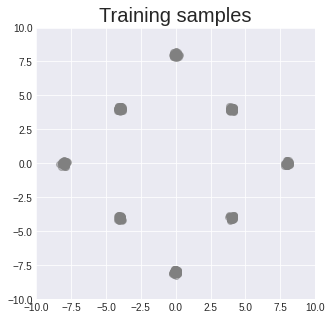

In [27]:
X_train = sample_2d_data('8gaussians', 1000)

xmin = -10
xmax = 10
ymin = -10
ymax = 10
plt.style.use('seaborn-darkgrid') 
plt.figure(figsize=(5, 5))


plt.xlim(xmin, xmax)
plt.ylim(ymin, ymax)
plt.title("Training samples", fontsize=20)
plt.scatter(X_train[:,:1], X_train[:,1:], alpha=0.5, color='gray', marker='o')
plt.show()

# Train

Just train the model without langevin to test.

[[-0.4556159973144531, 0.133024200797081], [-0.19642551243305206, 0.47337669134140015], [-0.40257692337036133, 0.1053687334060669], [-0.2129857987165451, 0.2667595148086548], [-0.19289055466651917, 0.47291800379753113], [-0.19080691039562225, 0.4751388132572174], [-0.43360739946365356, 0.20571288466453552], [-0.45627468824386597, 0.13240452110767365], [-0.42958393692970276, 0.08690208196640015], [-0.426498144865036, 0.20445959270000458], [-0.458477646112442, 0.13275142014026642], [-0.32110878825187683, 0.4741361141204834], [-0.20701123774051666, 0.4557141065597534], [-0.20718631148338318, 0.26461806893348694], [-0.4517514109611511, 0.2066744565963745], [0.08563719689846039, 0.4133322238922119], [-0.4036496579647064, 0.102841317653656], [-0.9412237405776978, -0.01560932770371437], [-0.4289741814136505, 0.08718840777873993], [-0.9296219348907471, -0.011139031499624252], [0.08236415684223175, 0.40992486476898193], [-0.33366304636001587, 0.4925236105918884], [-0.2047562301158905, 0.2617962

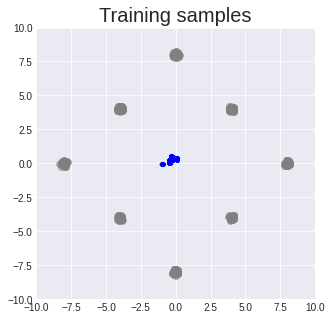

[[-0.1585131734609604, 0.29718461632728577], [-1.0145213603973389, -0.0412064753472805], [-1.0030195713043213, -0.03644229471683502], [-0.43091490864753723, 0.2194155603647232], [-0.47187381982803345, 0.21940481662750244], [-0.3754327893257141, 0.05379973724484444], [-1.01713228225708, -0.044121988117694855], [-0.3771747946739197, 0.05199910327792168], [-0.43625637888908386, 0.22110722959041595], [-0.3731786012649536, 0.05359571799635887], [-0.37999656796455383, 0.050985243171453476], [-1.0090125799179077, -0.0390763133764267], [-0.4648842215538025, 0.2241305708885193], [-0.4828178286552429, 0.022010397166013718], [-0.16779477894306183, 0.27949392795562744], [-0.1648157835006714, 0.35012945532798767], [-0.2990224063396454, 0.5445960760116577], [-0.3042340576648712, 0.5536519289016724], [-0.1639021337032318, 0.34609004855155945], [-0.14827197790145874, 0.3770236372947693], [-0.37314775586128235, 0.05055161193013191], [-0.2926217317581177, 0.5351644158363342], [-0.29693591594696045, 0.54

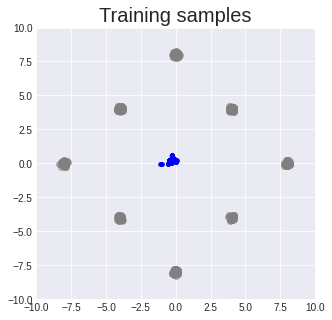

[[-1.1067737340927124, -0.06142507120966911], [-0.11632681638002396, 0.33456337451934814], [0.04014693945646286, 0.08366385102272034], [0.04181905835866928, 0.08249890804290771], [-0.5672095417976379, -0.042106565088033676], [-0.11480732262134552, 0.271003395318985], [-0.284648060798645, 0.001417834311723709], [-0.2751573324203491, 0.6255751252174377], [-0.48640042543411255, 0.24631884694099426], [-0.11788880825042725, 0.336482435464859], [-0.29061681032180786, 0.0014743469655513763], [-0.47399717569351196, 0.24631360173225403], [-1.0769450664520264, -0.050988294184207916], [0.03621883690357208, 0.08476591110229492], [-0.49031126499176025, 0.24735227227210999], [-1.1056103706359863, -0.06147106736898422], [-0.2865712642669678, 0.0020745210349559784], [-1.0814144611358643, -0.05190727859735489], [-0.5022461414337158, 0.24890866875648499], [-0.11447442322969437, 0.2690969705581665], [-0.28603416681289673, 0.001528322696685791], [0.03228561580181122, 0.08282387256622314], [-0.287077218294

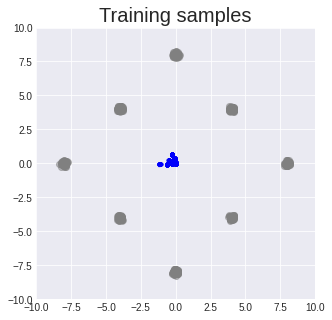

[[0.024569682776927948, -0.06691000610589981], [-0.6482910513877869, -0.10143084824085236], [-0.5153828263282776, 0.2690925598144531], [-0.20222201943397522, -0.024033933877944946], [-0.6478286385536194, -0.10609525442123413], [-0.2418554425239563, 0.6912592649459839], [-0.07439962774515152, 0.3761254549026489], [0.011732853949069977, -0.06349533796310425], [-0.2045665979385376, -0.030293669551610947], [-0.6426759958267212, -0.10010470449924469], [-1.1933404207229614, -0.07341863214969635], [-0.20251789689064026, -0.024714473634958267], [-0.07501047849655151, 0.3874901533126831], [-0.24738679826259613, 0.7112199664115906], [-0.48305147886276245, 0.2717165946960449], [-0.06953825056552887, 0.18782939016819], [-1.2047725915908813, -0.07971903681755066], [-0.2421451061964035, 0.6945271492004395], [-1.1796499490737915, -0.07135854661464691], [0.03199397027492523, -0.06002749875187874], [-0.07466547191143036, 0.3970075249671936], [-0.511896550655365, 0.2731555104255676], [-0.240872561931610

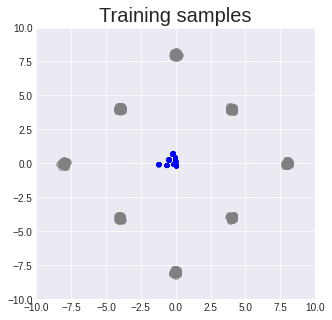

[[-0.5363339185714722, 0.29222437739372253], [-0.2151918113231659, 0.7783910036087036], [-0.21537448465824127, 0.7892362475395203], [-0.11495435237884521, -0.039085742086172104], [-1.2306243181228638, -0.06384269893169403], [-1.2371456623077393, -0.06802568584680557], [-0.0065378546714782715, 0.13789412379264832], [-0.6860384345054626, -0.14412102103233337], [-1.2664844989776611, -0.07872174680233002], [0.0060568153858184814, 0.15337465703487396], [-0.11628127098083496, -0.03626437485218048], [-0.69512939453125, -0.15568169951438904], [-0.21526950597763062, 0.787256121635437], [-1.258695363998413, -0.07678915560245514], [0.006845012307167053, -0.19982628524303436], [-0.008161604404449463, -0.21646688878536224], [-0.014014080166816711, 0.1265719085931778], [-0.5094466805458069, 0.2945307195186615], [-1.2590829133987427, -0.07653312385082245], [-0.22041837871074677, 0.8088211417198181], [-0.03208673745393753, 0.44317805767059326], [-0.12057275325059891, -0.04554352909326553], [-1.2484480

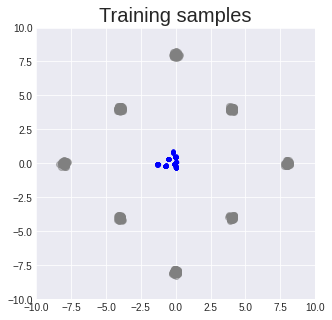

[[-0.7452617883682251, -0.185789555311203], [-1.3201043605804443, -0.06761909276247025], [-0.5725277662277222, 0.3279639780521393], [-0.7876065969467163, -0.19873090088367462], [-0.0045308396220207214, -0.3340494632720947], [-0.7557165622711182, -0.19320634007453918], [-0.5344374775886536, 0.3376940190792084], [0.04137284308671951, 0.06886342912912369], [-0.19023920595645905, 0.8702617883682251], [-0.1891656070947647, 0.8738700747489929], [0.009450092911720276, 0.505897581577301], [0.018975362181663513, -0.3287281394004822], [-0.7644954323768616, -0.18890266120433807], [-0.18796828389167786, 0.8858767747879028], [-0.7667832374572754, -0.19342239201068878], [0.07201098650693893, 0.09520287811756134], [-1.3508745431900024, -0.08113344013690948], [0.010534189641475677, 0.5224497318267822], [-0.5458204746246338, 0.3384958803653717], [0.04624228924512863, 0.06738704442977905], [0.004302807152271271, 0.49572768807411194], [-0.18832248449325562, 0.870864748954773], [-0.026855073869228363, -0.

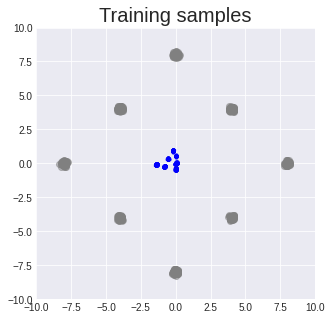

[[0.04703602194786072, 0.5633862614631653], [0.10696397721767426, 0.01100851595401764], [0.11598943173885345, 0.01139909029006958], [0.01721455156803131, -0.46714723110198975], [0.052149027585983276, 0.5891724228858948], [-0.8573741912841797, -0.24362221360206604], [-1.4175000190734863, -0.07242653518915176], [0.055442243814468384, -0.049343355000019073], [-0.8410842418670654, -0.2321484088897705], [-0.16532769799232483, 0.9695542454719543], [0.05938272923231125, -0.06165212765336037], [-1.4455891847610474, -0.0893213152885437], [-0.16271373629570007, 0.978654682636261], [-0.16313821077346802, 0.9859991669654846], [0.06290081888437271, -0.0572197400033474], [0.061375267803668976, -0.058913979679346085], [0.05700404942035675, -0.06109798699617386], [0.1186213344335556, -0.003131553530693054], [-0.1632205992937088, 1.0003160238265991], [0.06637535989284515, -0.05638520419597626], [-0.5635810494422913, 0.366704523563385], [0.04932758957147598, 0.5710492730140686], [-1.4309749603271484, -0

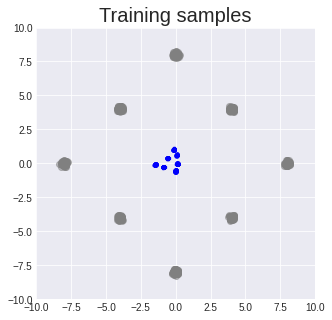

[[-0.13947615027427673, 1.0769425630569458], [-0.1340242624282837, 1.08390474319458], [0.15358197689056396, -0.049981601536273956], [-1.5221569538116455, -0.09624113142490387], [0.17103010416030884, -0.06848342716693878], [-0.5580114722251892, 0.40892285108566284], [-0.9187799692153931, -0.2995852828025818], [-0.14063021540641785, 1.0754003524780273], [-0.14531666040420532, 1.0940051078796387], [-0.5704609155654907, 0.4034166634082794], [-0.5675358176231384, 0.3980082869529724], [-0.6043213605880737, 0.3902687728404999], [-0.5863248109817505, 0.4000962972640991], [-0.8883389830589294, -0.2993406355381012], [-0.029859967529773712, -0.6304038763046265], [-0.8877086043357849, -0.29101961851119995], [-0.5942373275756836, 0.3982199430465698], [-1.5190461874008179, -0.08900615572929382], [0.18735331296920776, -0.053796976804733276], [-0.1347685158252716, 1.1080029010772705], [0.15514466166496277, -0.05375097319483757], [-0.13559302687644958, 1.0777915716171265], [-0.9048217535018921, -0.2886

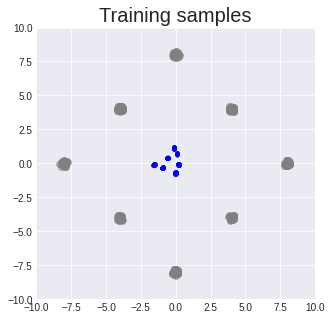

[[0.24657154083251953, -0.12676028907299042], [-0.12736716866493225, 1.1890699863433838], [-0.11898460984230042, 1.235515832901001], [-0.018385007977485657, -0.7466415166854858], [-0.9745466113090515, -0.3551311194896698], [-0.11576076596975327, 1.2001316547393799], [0.12281510978937149, 0.7340031862258911], [-0.9974942207336426, -0.3568023443222046], [0.23264522850513458, -0.05502268299460411], [-0.5893755555152893, 0.4335004389286041], [-0.9479737877845764, -0.3289807438850403], [-1.5882940292358398, -0.08094555139541626], [-0.1158342957496643, 1.2021584510803223], [-0.02678750455379486, -0.7993376851081848], [-0.942696213722229, -0.3443363606929779], [0.11580255627632141, 0.708929181098938], [-1.5601654052734375, -0.07587596774101257], [0.13012516498565674, 0.7485179901123047], [-0.05338994413614273, -0.7743690609931946], [0.24743860960006714, -0.052007921040058136], [-1.6106318235397339, -0.09072395414113998], [-1.6255241632461548, -0.10544630885124207], [0.24360841512680054, -0.07

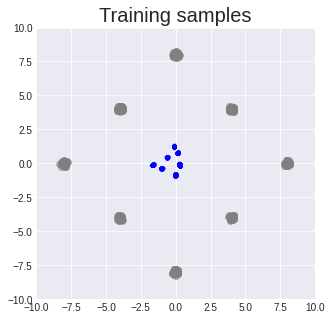

[[-0.09506857395172119, 1.290155053138733], [-0.020481809973716736, -0.9367954730987549], [-1.0738555192947388, -0.3786579966545105], [-0.6290349960327148, 0.4700268507003784], [0.1617434024810791, 0.8341730833053589], [-1.0610206127166748, -0.37216535210609436], [-1.0052465200424194, -0.37824034690856934], [-0.6307358741760254, 0.4706258475780487], [-1.0433329343795776, -0.39066439867019653], [-0.06756717711687088, -0.9193938970565796], [-1.023515224456787, -0.3932192921638489], [0.16116386651992798, 0.8478839993476868], [-0.09051036834716797, 1.3159257173538208], [0.159891277551651, 0.8271215558052063], [-0.05429920554161072, -0.9252880215644836], [0.3247221112251282, -0.007195476442575455], [0.3213965892791748, -0.03285696730017662], [-0.09283272922039032, 1.328540325164795], [-0.023965910077095032, -0.9253219366073608], [-1.679221749305725, -0.08254171907901764], [0.16336199641227722, 0.8078374266624451], [0.32407858967781067, -0.061203356832265854], [-1.6525815725326538, -0.072318

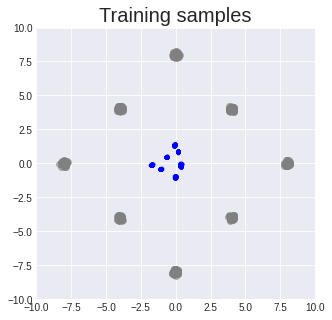

[[-0.04839743673801422, -1.049663782119751], [-0.022432461380958557, -1.0568592548370361], [0.008973993360996246, -1.051072359085083], [-0.6800203919410706, 0.4981076717376709], [0.1880936324596405, 0.8916635513305664], [-1.099733829498291, -0.4340869188308716], [-0.005929514765739441, -1.0679548978805542], [-0.08102121949195862, 1.4027799367904663], [-1.778166651725769, -0.08828511834144592], [0.18324759602546692, 0.8856921195983887], [-1.7757259607315063, -0.08345110714435577], [-0.6936963796615601, 0.4935392439365387], [0.41940125823020935, -0.049263495951890945], [-0.011987313628196716, -1.0657566785812378], [0.3584727644920349, -0.24319152534008026], [-0.07266382873058319, -1.0640783309936523], [0.41879338026046753, -0.05396623536944389], [-1.1251085996627808, -0.4429108500480652], [-0.6818432211875916, 0.4963833689689636], [0.43242347240448, -0.024414170533418655], [0.3593555688858032, -0.2391650378704071], [-1.7807799577713013, -0.08670128881931305], [-0.6431124210357666, 0.5099

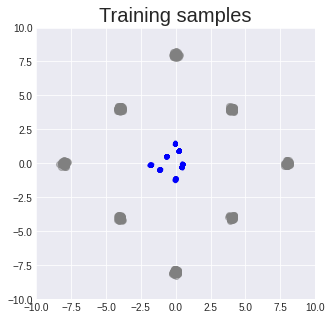

[[-0.6507239937782288, 0.5427809953689575], [-0.0650896355509758, -1.214916467666626], [-0.7016808986663818, 0.5274863839149475], [-0.0653255358338356, -1.2226450443267822], [-0.6599477529525757, 0.5458436012268066], [0.5104383826255798, -0.05728275701403618], [-0.6936648488044739, 0.5342721343040466], [-1.170576810836792, -0.4615330994129181], [0.5230390429496765, -0.024255096912384033], [-0.009840838611125946, -1.2163598537445068], [-1.8254624605178833, -0.0724296122789383], [-1.869666576385498, -0.08202233910560608], [0.00023276358842849731, -1.2299047708511353], [-0.0016501769423484802, -1.2167632579803467], [0.2336532175540924, 0.9938094615936279], [-0.041843898594379425, -1.21039617061615], [-0.6599968671798706, 0.5457804203033447], [0.23172467947006226, 1.0129324197769165], [-0.047728002071380615, -1.207493543624878], [-0.6795014142990112, 0.5451018214225769], [-1.868818998336792, -0.09984993934631348], [-0.104859858751297, -1.243880033493042], [-1.856489896774292, -0.0839748010

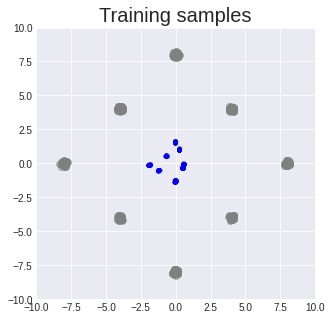

[[-0.04646901786327362, 1.6390057802200317], [0.6000525951385498, -0.05088947340846062], [-1.2039519548416138, -0.5233381986618042], [-1.2654048204421997, -0.5121293067932129], [-1.2949624061584473, -0.5116140842437744], [0.5048903226852417, -0.3743629455566406], [-0.08878924697637558, -1.362616777420044], [-1.9525452852249146, -0.08459985256195068], [-1.9494218826293945, -0.08107563853263855], [-0.718303382396698, 0.5777508616447449], [0.6097509860992432, -0.043567776679992676], [0.6202223300933838, -0.062245093286037445], [-1.2952415943145752, -0.5041797757148743], [-2.0031487941741943, -0.1076669991016388], [-0.0517696887254715, -1.3426060676574707], [-1.9283926486968994, -0.07648224383592606], [-1.919402003288269, -0.07332273572683334], [-1.235708236694336, -0.5026639103889465], [-0.051252998411655426, 1.647977352142334], [-0.6720856428146362, 0.5966992378234863], [-0.061967670917510986, -1.3224917650222778], [-0.6784501075744629, 0.6015718579292297], [0.4986051619052887, -0.359504

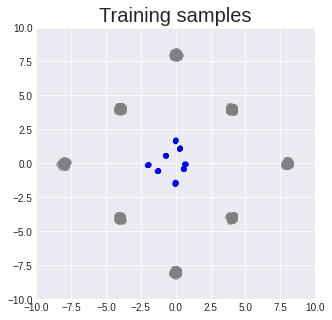

[[-0.7532917261123657, 0.5958813428878784], [-0.7043827176094055, 0.6392358541488647], [-0.020057491958141327, 1.7627376317977905], [-2.083808183670044, -0.10305465757846832], [-0.7610072493553162, 0.6214258074760437], [0.2867509424686432, 1.1835581064224243], [-0.014275975525379181, 1.763338327407837], [0.5700002312660217, -0.42368316650390625], [0.5882697701454163, -0.4198917746543884], [-0.7190632820129395, 0.6509832143783569], [-0.04261501878499985, -1.5004554986953735], [-0.04297450929880142, 1.7442288398742676], [0.7325254678726196, -0.04747896268963814], [0.5864330530166626, -0.4260375201702118], [0.3009454011917114, 1.2016773223876953], [0.003574185073375702, -1.461461067199707], [-0.7008095383644104, 0.6339711546897888], [-0.7229092121124268, 0.6237093806266785], [0.7061594724655151, 0.01921258494257927], [0.7152312994003296, -0.027894731611013412], [0.5718264579772949, -0.4177257716655731], [-0.02821328490972519, 1.7792935371398926], [0.7076250910758972, 0.022717464715242386]

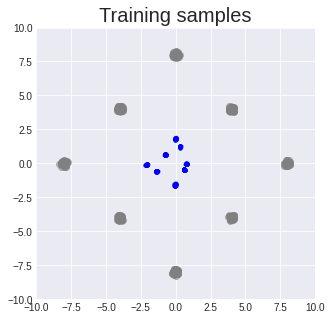

[[-1.4301892518997192, -0.6119042038917542], [0.35110414028167725, 1.2958457469940186], [-1.4254040718078613, -0.6365218162536621], [-1.4233943223953247, -0.6240400671958923], [-2.1805903911590576, -0.10472632944583893], [0.33567014336586, 1.2517153024673462], [-0.7681840658187866, 0.6586549282073975], [-0.060552679002285004, -1.6900829076766968], [-0.03331434726715088, -1.6504281759262085], [-0.7809887528419495, 0.6418942213058472], [0.3403581976890564, 1.3048433065414429], [0.33254262804985046, 1.2616913318634033], [-2.1718833446502686, -0.10618430376052856], [-0.786620557308197, 0.665771484375], [0.3450656235218048, 1.2701877355575562], [0.8319529294967651, -0.0487254299223423], [0.6760396361351013, -0.5072233080863953], [-2.1356208324432373, -0.09724810719490051], [-0.7715773582458496, 0.6698444485664368], [0.33994656801223755, 1.2425230741500854], [0.8404527306556702, -0.05340704694390297], [-1.383971095085144, -0.6120178699493408], [0.3508182764053345, 1.3064754009246826], [0.334

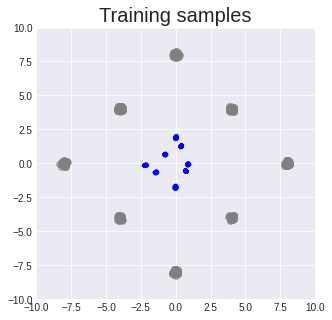

[[-0.7866987586021423, 0.7471392750740051], [-1.4558136463165283, -0.6823840737342834], [-0.012194313108921051, -1.7923697233200073], [-0.12163888663053513, -1.839302897453308], [-0.8262433409690857, 0.7097449898719788], [-0.044355399906635284, -1.8386075496673584], [0.005535222589969635, -1.7535415887832642], [-0.020873405039310455, -1.8121403455734253], [-2.254239082336426, -0.0897279679775238], [-2.2633981704711914, -0.10704854130744934], [0.012509055435657501, -1.7585444450378418], [-0.8053309321403503, 0.7042530179023743], [0.3763076663017273, 1.3561732769012451], [-0.02975144237279892, 1.982714056968689], [0.02779053896665573, -1.8366456031799316], [0.7180683612823486, -0.5361807346343994], [-0.030249156057834625, 1.9940252304077148], [-2.2708969116210938, -0.11283079534769058], [-0.8419032096862793, 0.7025350332260132], [-1.4599496126174927, -0.6400063037872314], [-0.01231905072927475, 2.000263214111328], [0.7135767936706543, -0.5324500799179077], [-0.014323778450489044, -1.7927

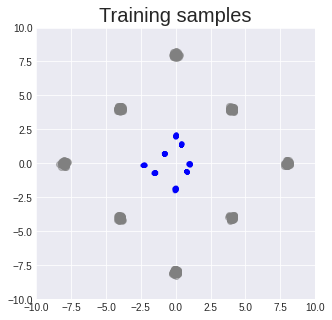

[[-1.531896948814392, -0.6735296249389648], [-0.04459225386381149, -1.9367163181304932], [-2.310818672180176, -0.07344555854797363], [-0.8183944225311279, 0.7673203945159912], [-1.5194268226623535, -0.6914736032485962], [-0.06394100934267044, -1.9775011539459229], [0.03061608225107193, 2.1194958686828613], [0.005418993532657623, 2.1609323024749756], [-0.010816521942615509, -1.9435110092163086], [-2.3655166625976562, -0.0765366405248642], [0.8083835244178772, -0.6217737197875977], [0.7831029295921326, -0.6026947498321533], [0.997089147567749, -0.030638858675956726], [-0.7930908203125, 0.7648648023605347], [-0.043418243527412415, -1.9691838026046753], [-2.4013333320617676, -0.10339269787073135], [-0.820375382900238, 0.7680666446685791], [-2.3754866123199463, -0.0976986512541771], [-0.003092043101787567, 2.1044294834136963], [0.9979602694511414, -0.03739350661635399], [0.8139222860336304, -0.6282219290733337], [-1.5414738655090332, -0.6970109939575195], [0.42474237084388733, 1.47066736221

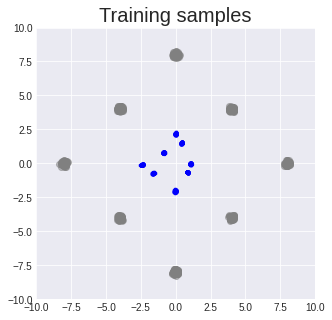

[[1.1186044216156006, 0.004384987056255341], [0.020630985498428345, 2.276599168777466], [0.4497833549976349, 1.541653037071228], [0.8410338163375854, -0.6442147493362427], [-2.4762823581695557, -0.09416741132736206], [-0.02101760357618332, -2.1063382625579834], [-0.07968544214963913, -2.1069865226745605], [0.4513452649116516, 1.5774130821228027], [0.8466593623161316, -0.6461692452430725], [1.1215027570724487, -0.062255509197711945], [1.0902827978134155, -0.08680887520313263], [0.4446711540222168, 1.568295955657959], [0.0016796216368675232, 2.2375874519348145], [-1.618890404701233, -0.7448124885559082], [-0.8613272905349731, 0.8288039565086365], [-1.6218945980072021, -0.728723406791687], [0.8723999857902527, -0.6675873398780823], [-1.706231951713562, -0.7059439420700073], [-0.8831719160079956, 0.8269537091255188], [-1.6799653768539429, -0.7631510496139526], [-2.4326329231262207, -0.08359232544898987], [-1.6933571100234985, -0.7494209408760071], [0.01969599723815918, -2.056878089904785],

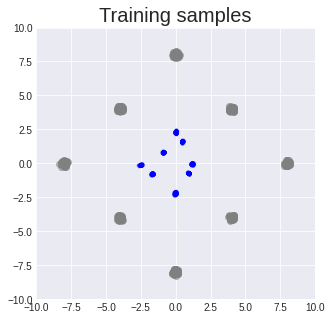

[[-2.60009765625, -0.10835622996091843], [-1.7625603675842285, -0.8047504425048828], [0.0023091956973075867, 2.3348782062530518], [-0.059971027076244354, -2.2627124786376953], [-2.6421008110046387, -0.10862074047327042], [0.49292340874671936, 1.6862318515777588], [-1.704793930053711, -0.7432483434677124], [-0.9306331872940063, 0.8374840021133423], [0.9492857456207275, -0.736231803894043], [-1.7395236492156982, -0.7942692041397095], [-2.5600197315216064, -0.10803598165512085], [0.4815986156463623, 1.6187727451324463], [-0.07274181395769119, -2.2490153312683105], [-2.5591702461242676, -0.1001945286989212], [-0.13698160648345947, -2.290034055709839], [-0.9625809788703918, 0.8432179093360901], [0.4897477924823761, 1.626097559928894], [-0.034533582627773285, -2.359961986541748], [-0.02100665122270584, -2.2463698387145996], [0.01794714480638504, 2.3539137840270996], [-1.7520502805709839, -0.8144815564155579], [1.2306443452835083, -0.030173830687999725], [0.48720723390579224, 1.67005109786987

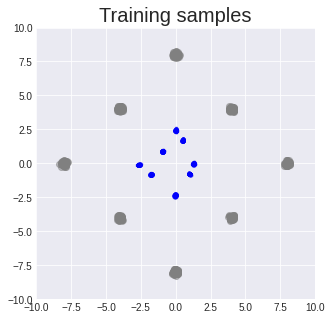

[[0.5347724556922913, 1.792664885520935], [-0.03748179227113724, -2.440948963165283], [-1.7947750091552734, -0.8653578758239746], [-0.09238191694021225, -2.496967077255249], [-2.7130727767944336, -0.11448419094085693], [-1.7515158653259277, -0.8369656801223755], [-0.9640424847602844, 0.9484764337539673], [0.02537745237350464, 2.489088535308838], [0.5023042559623718, 1.7375671863555908], [-0.08058591932058334, -2.446430206298828], [-0.08370766788721085, -2.4276773929595947], [1.0593934059143066, -0.8327970504760742], [0.5089566111564636, 1.7380990982055664], [1.3351514339447021, 0.03626376390457153], [1.0383387804031372, -0.8155669569969177], [0.050079479813575745, -2.4793598651885986], [0.5357404947280884, 1.8023037910461426], [-0.13555797934532166, -2.4015913009643555], [-1.7979941368103027, -0.8863163590431213], [0.5345995426177979, 1.734337329864502], [-0.9133641123771667, 0.8900814652442932], [0.49940428137779236, 1.7372382879257202], [-1.7776442766189575, -0.7984877824783325], [-0

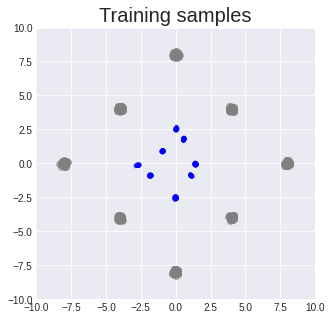

[[-2.84384822845459, -0.13412782549858093], [1.1241992712020874, -0.8953666687011719], [0.5368149280548096, 1.9077324867248535], [-0.9838677644729614, 0.9908101558685303], [-0.02339044213294983, 2.600828170776367], [-1.9266115427017212, -0.886860728263855], [-1.9559842348098755, -0.9203928112983704], [0.5581724643707275, 1.8609291315078735], [1.0965231657028198, -0.8683005571365356], [-0.03705412894487381, -2.5787062644958496], [-1.0283516645431519, 0.9421459436416626], [0.5838460326194763, 1.887784481048584], [-1.8618285655975342, -0.8820317387580872], [0.5392328500747681, 1.8733030557632446], [-0.07967590540647507, -2.584397077560425], [-1.8882325887680054, -0.8997098207473755], [-0.06502564996480942, -2.579523801803589], [-1.8942053318023682, -0.8696117401123047], [1.1292595863342285, -0.8954521417617798], [-1.929324984550476, -0.8911189436912537], [1.4474279880523682, -0.0953349694609642], [1.4395774602890015, -0.04386984556913376], [0.5632473826408386, 1.910584568977356], [0.02512

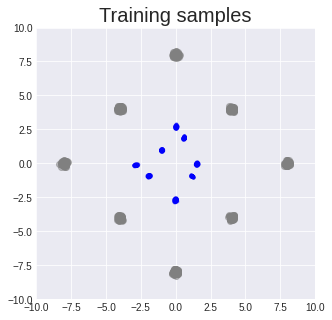

[[0.6089680790901184, 2.027470588684082], [-1.986284613609314, -0.8740212917327881], [-1.0290687084197998, 1.000931739807129], [-1.9384464025497437, -0.9423040151596069], [-0.03023126721382141, -2.856703519821167], [0.029503867030143738, -2.740074396133423], [1.2202386856079102, -0.9777877330780029], [-2.0044806003570557, -0.9188122153282166], [1.2386715412139893, -0.9913262128829956], [1.5488783121109009, 0.01438809558749199], [-1.0315097570419312, 1.0087169408798218], [-2.941592216491699, -0.12028203904628754], [-0.0007302984595298767, 2.8186004161834717], [-1.0396445989608765, 1.0292439460754395], [1.228733777999878, -0.9844892024993896], [-3.0398032665252686, -0.15664750337600708], [0.6095001101493835, 1.9871679544448853], [-1.0261013507843018, 1.0783162117004395], [1.212036371231079, -0.9699003100395203], [0.6206322312355042, 1.969929575920105], [-1.9240657091140747, -0.9299585819244385], [-2.8887650966644287, -0.08246417343616486], [1.1884610652923584, -0.9516874551773071], [1.59

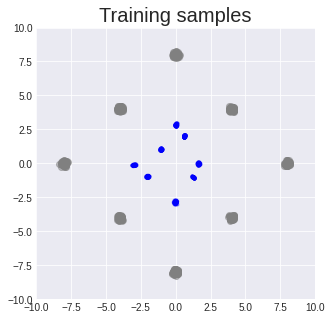

[[-1.0784739255905151, 1.0808473825454712], [1.2678877115249634, -1.0283282995224], [0.6456077098846436, 2.042266607284546], [1.6920478343963623, -0.035342223942279816], [-3.1256911754608154, -0.1338992863893509], [1.6873120069503784, 0.004761043936014175], [-1.0642013549804688, 1.0601507425308228], [-2.054389476776123, -0.9804629683494568], [-3.08455491065979, -0.1251908838748932], [-0.10517136752605438, -3.0272319316864014], [-2.0525612831115723, -1.0364551544189453], [0.0038561969995498657, 2.9065167903900146], [1.2955031394958496, -1.0507872104644775], [1.6465731859207153, -0.039107102900743484], [-2.120048761367798, -1.0391672849655151], [1.313438057899475, -1.0655205249786377], [-3.1245081424713135, -0.10125786066055298], [0.6138567328453064, 2.033263683319092], [1.6997060775756836, 0.012753184884786606], [-2.070098638534546, -0.9574317336082458], [-3.1098034381866455, -0.1189146339893341], [0.6690654754638672, 2.095921277999878], [0.6403758525848389, 2.0347540378570557], [0.0335

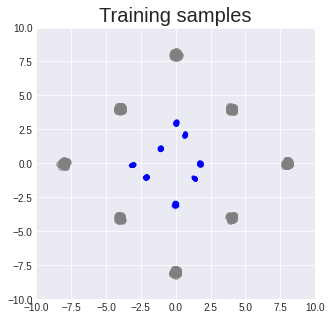

[[-1.179354190826416, 1.1348533630371094], [-1.0939873456954956, 1.157531499862671], [-0.030134007334709167, -3.119511365890503], [0.023155391216278076, 3.0004372596740723], [-3.193960428237915, -0.09564041346311569], [1.3689193725585938, -1.1221343278884888], [1.4148285388946533, -1.1615073680877686], [1.7897815704345703, -0.002852063626050949], [-3.262545108795166, -0.12505991756916046], [-1.191010594367981, 1.1167312860488892], [-0.03283819556236267, 3.0463037490844727], [0.6606308817863464, 2.129589557647705], [-3.153792142868042, -0.07938744127750397], [-3.216184139251709, -0.10878454148769379], [-1.1499381065368652, 1.124333381652832], [-2.209500789642334, -1.0321762561798096], [-1.1156805753707886, 1.2044577598571777], [-3.2169551849365234, -0.11147046089172363], [-1.128010630607605, 1.1840509176254272], [0.03281659632921219, 3.089064121246338], [-2.225372076034546, -0.963649332523346], [-0.039731234312057495, -3.0885250568389893], [-1.1108860969543457, 1.1716039180755615], [0.0

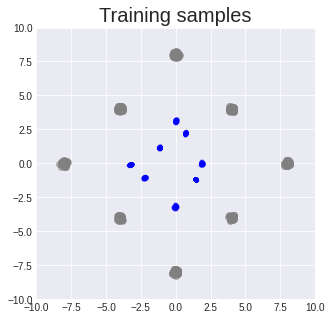

[[-0.03751571476459503, -3.291017532348633], [-1.1386005878448486, 1.2208808660507202], [-2.280212163925171, -1.073903203010559], [1.487796664237976, -1.235628604888916], [-3.3235061168670654, -0.09340942651033401], [-3.292921781539917, -0.08196081966161728], [-0.03636232018470764, 3.2650649547576904], [-2.3305814266204834, -1.027237057685852], [-3.3210136890411377, -0.08839508891105652], [-1.13462495803833, 1.2125085592269897], [-3.3147428035736084, -0.07930459082126617], [0.0366487130522728, 3.2367348670959473], [-1.1702686548233032, 1.140049695968628], [0.729634702205658, 2.334376335144043], [-3.362525463104248, -0.10114453732967377], [-1.2267558574676514, 1.171637773513794], [0.7068372368812561, 2.2601380348205566], [0.02294643223285675, 3.276482582092285], [1.4704105854034424, -1.2189936637878418], [-3.351364850997925, -0.10890132188796997], [0.7019968032836914, 2.2287955284118652], [-1.1971434354782104, 1.2640082836151123], [-0.025627993047237396, -3.2384049892425537], [-1.183553

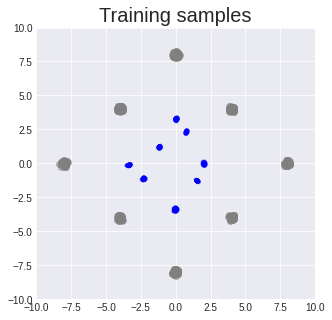

[[2.090362787246704, -0.012568071484565735], [0.7486485242843628, 2.4756455421447754], [1.5405712127685547, -1.293343186378479], [-0.05366253852844238, -3.420503616333008], [0.7595536708831787, 2.4635791778564453], [-1.1937702894210815, 1.2166963815689087], [2.03421950340271, -0.050133489072322845], [0.7525465488433838, 2.391432762145996], [-1.2338558435440063, 1.2938814163208008], [-0.020937636494636536, -3.3655173778533936], [-1.1953059434890747, 1.281434178352356], [-1.2429524660110474, 1.213977575302124], [-0.10574637353420258, -3.4539804458618164], [-3.4792070388793945, -0.11419205367565155], [-0.02999911457300186, -3.4437379837036133], [0.06383123993873596, -3.3852710723876953], [1.566220998764038, -1.3169984817504883], [2.093721389770508, 0.027606945484876633], [-0.1751713752746582, -3.4828362464904785], [-1.2381541728973389, 1.2747291326522827], [1.5663092136383057, -1.3158257007598877], [-3.4347779750823975, -0.06051051989197731], [-0.02289777249097824, 3.4360082149505615], [1

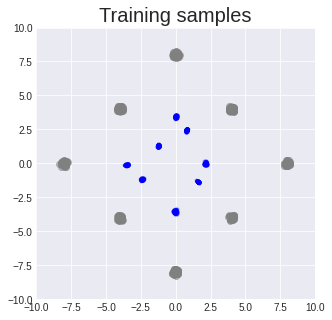

[[-0.023727692663669586, 3.5968618392944336], [0.8213851451873779, 2.489351987838745], [-0.06493786722421646, -3.577756404876709], [-0.00831533968448639, -3.6307787895202637], [-0.0912170335650444, -3.6570215225219727], [1.6651793718338013, -1.4069575071334839], [-3.6236908435821533, -0.1012808084487915], [-3.613609552383423, -0.10336017608642578], [-3.610971450805664, -0.0889582633972168], [-2.3995237350463867, -1.2074111700057983], [2.2029709815979004, -0.0106413085013628], [-1.2649157047271729, 1.3318907022476196], [-2.491166591644287, -1.1162443161010742], [-3.6053998470306396, -0.07654418796300888], [-3.530637741088867, -0.06669539213180542], [-0.04336048662662506, 3.5090625286102295], [-2.5186398029327393, -1.243310570716858], [-1.2625150680541992, 1.3306928873062134], [-2.4716506004333496, -1.1802847385406494], [0.7762126922607422, 2.4782071113586426], [0.7700244188308716, 2.489995241165161], [1.5832126140594482, -1.339432954788208], [0.8014384508132935, 2.4608137607574463], [0.

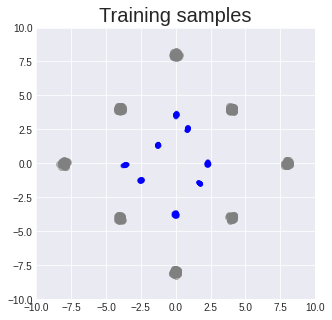

[[0.8534063100814819, 2.603623867034912], [-1.2949665784835815, 1.4064676761627197], [0.8435405492782593, 2.5766100883483887], [0.8803886771202087, 2.6139791011810303], [-2.4928672313690186, -1.269017219543457], [-3.6392955780029297, -0.05811580270528793], [2.344679355621338, -0.06192047521471977], [1.7483248710632324, -1.495945692062378], [0.10650308430194855, 3.737391948699951], [-3.6943743228912354, -0.09481146931648254], [1.7352749109268188, -1.473899245262146], [-1.3116039037704468, 1.4042620658874512], [-2.616549491882324, -1.2651082277297974], [-0.03453632444143295, 3.698350429534912], [2.3420920372009277, -0.008124534040689468], [-0.08876845985651016, -3.814197063446045], [-0.003329560160636902, 3.6695945262908936], [-2.544060468673706, -1.2666972875595093], [0.8359638452529907, 2.6469686031341553], [-3.7333409786224365, -0.07097634673118591], [-0.002523675560951233, 3.6356050968170166], [-3.5872745513916016, -0.04666547849774361], [0.1177913099527359, 3.7698490619659424], [2.3

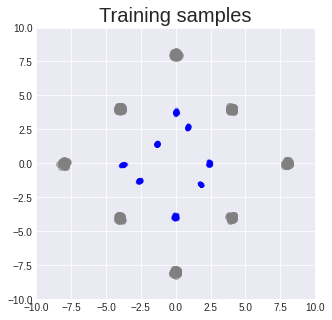

[[2.426459550857544, -0.04980824142694473], [2.515462636947632, -0.11445899307727814], [1.8670117855072021, -1.5979528427124023], [0.08706700056791306, -3.990750551223755], [-3.8947746753692627, -0.12125296890735626], [-0.0018380656838417053, 3.869086980819702], [2.5041377544403076, -0.014740059152245522], [-1.4181686639785767, 1.3896889686584473], [-3.8665246963500977, -0.15166278183460236], [0.9099007844924927, 2.696336507797241], [0.06471177935600281, -3.9922711849212646], [0.08969736099243164, 3.8612825870513916], [-2.6646080017089844, -1.301140308380127], [0.040150754153728485, 3.8353352546691895], [0.9433198571205139, 2.7495851516723633], [-0.05853969603776932, 3.786306381225586], [1.8696613311767578, -1.6126710176467896], [-3.8543624877929688, -0.09115441143512726], [-3.900186061859131, -0.13151276111602783], [-1.354987382888794, 1.4599946737289429], [0.90986567735672, 2.7122159004211426], [-1.388822317123413, 1.5061756372451782], [2.546391248703003, -0.05179288983345032], [-3.8

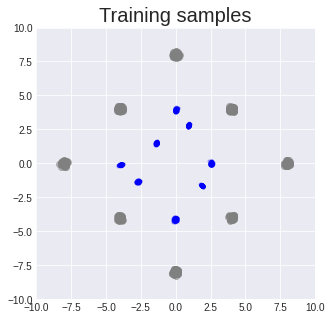

[[-4.038437843322754, -0.1252649426460266], [-4.015198230743408, -0.1514807641506195], [0.9067106246948242, 2.8226444721221924], [1.9391862154006958, -1.6895558834075928], [-1.4179880619049072, 1.47930908203125], [-0.02259168028831482, 3.961747407913208], [0.03058372437953949, -4.19583797454834], [-1.3765321969985962, 1.5300134420394897], [0.08240782469511032, 4.041266918182373], [0.0447649285197258, 4.0044264793396], [-0.06935722380876541, -4.210241794586182], [-4.055937767028809, -0.118051677942276], [-2.6982297897338867, -1.3406893014907837], [0.00464969128370285, 3.9995992183685303], [0.9470748901367188, 2.8557374477386475], [-0.14157786965370178, -4.229350566864014], [-1.4060314893722534, 1.5094671249389648], [-0.010877877473831177, 4.014429569244385], [-2.816485643386841, -1.3015799522399902], [-4.164145469665527, -0.17201851308345795], [0.0316101536154747, 3.9815430641174316], [2.643656015396118, -0.08252266049385071], [0.8864914178848267, 2.7987732887268066], [-2.80811119079589

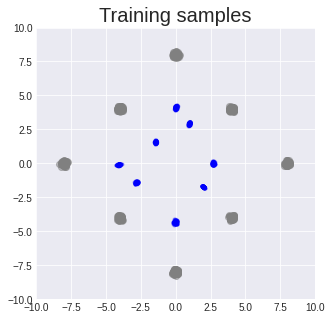

[[-0.18956813216209412, -4.3629350662231445], [2.815312385559082, -0.0023705698549747467], [-1.4387248754501343, 1.634314775466919], [0.028168484568595886, 4.291257858276367], [0.027032852172851562, 4.25573205947876], [-4.169452667236328, -0.10702520608901978], [-4.149337291717529, -0.08505326509475708], [0.15084919333457947, 4.2434821128845215], [-1.5120282173156738, 1.5800267457962036], [-0.1425982117652893, -4.42785120010376], [0.9602598547935486, 2.95261549949646], [-0.08241859823465347, -4.464804172515869], [2.820931911468506, 0.07235122472047806], [0.08700268715620041, 4.354525566101074], [0.008557617664337158, -4.4922661781311035], [-1.4756214618682861, 1.6346324682235718], [-0.027945689857006073, 4.181316375732422], [-1.4901307821273804, 1.6237096786499023], [0.9712698459625244, 2.877027988433838], [1.0176328420639038, 3.0608620643615723], [-1.5513331890106201, 1.5864923000335693], [-2.8543241024017334, -1.4267858266830444], [0.9662484526634216, 2.9367547035217285], [2.71459484

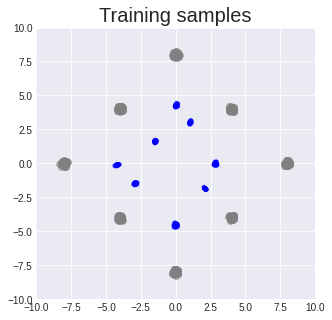

[[0.038087792694568634, -4.590850353240967], [1.0859516859054565, 3.1547770500183105], [2.8650062084198, 0.05235641822218895], [-1.487327218055725, 1.6800365447998047], [-0.0604126900434494, 4.3667192459106445], [2.905932903289795, -0.027405381202697754], [0.007173016667366028, 4.362575531005859], [-4.322473526000977, -0.08490563929080963], [-3.0597689151763916, -1.5124729871749878], [-4.32944917678833, -0.10194365680217743], [2.849905252456665, -0.015290312469005585], [-1.5282007455825806, 1.7042603492736816], [1.0931038856506348, 3.19516921043396], [2.886976718902588, -0.04754290729761124], [-2.9798974990844727, -1.4769206047058105], [-3.0155341625213623, -1.4258126020431519], [-0.058468885719776154, -4.618568420410156], [-4.245779514312744, -0.061320431530475616], [-1.5675963163375854, 1.653294324874878], [-2.977973699569702, -1.507585048675537], [-3.0463638305664062, -1.4823038578033447], [-2.95454740524292, -1.5375168323516846], [1.0449113845825195, 3.2159478664398193], [-2.985677

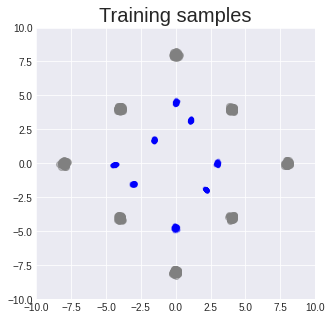

[[-1.5824352502822876, 1.7992192506790161], [2.2316677570343018, -1.9872263669967651], [-4.504309177398682, -0.10077325254678726], [2.193185567855835, -1.9443163871765137], [2.195822238922119, -1.9519977569580078], [-0.04429122805595398, -4.87679386138916], [0.05799396336078644, -4.802924156188965], [-1.5695252418518066, 1.7525134086608887], [-1.559428334236145, 1.8442062139511108], [1.0762264728546143, 3.3706650733947754], [-4.549334526062012, -0.11102365702390671], [-4.484462261199951, -0.12185446172952652], [0.010018303990364075, 4.58969783782959], [-4.444643974304199, -0.10869842767715454], [3.0777382850646973, -0.11140589416027069], [-1.530114769935608, 1.8416551351547241], [-0.049415357410907745, 4.611211776733398], [3.0084266662597656, -0.11781435459852219], [-4.445893287658691, -0.041777294129133224], [-2.9871883392333984, -1.5517891645431519], [0.12200357019901276, -4.732997417449951], [0.054773226380348206, 4.594793319702148], [-4.54905891418457, -0.09780003130435944], [-0.01

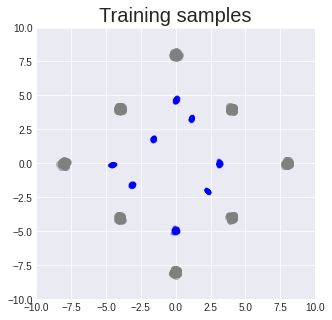

[[3.1777327060699463, -0.09120148420333862], [-0.07429806888103485, 4.752048015594482], [1.205991506576538, 3.3851499557495117], [3.179581880569458, -0.00745006650686264], [2.3264222145080566, -2.109539747238159], [1.0850845575332642, 3.258620500564575], [3.2093703746795654, -0.01609596610069275], [-1.665584683418274, 1.8496694564819336], [2.3625574111938477, -2.139461040496826], [-1.6573277711868286, 1.8333110809326172], [2.3384528160095215, -2.1014320850372314], [-4.729421138763428, -0.08540982007980347], [2.3642449378967285, -2.119175672531128], [2.3424925804138184, -2.1043283939361572], [2.3581976890563965, -2.0973527431488037], [-3.147826910018921, -1.586593747138977], [-3.0634512901306152, -1.539853572845459], [2.2821338176727295, -2.0591399669647217], [3.204573154449463, -0.16615338623523712], [-4.648012638092041, -0.11890168488025665], [1.1083122491836548, 3.339473009109497], [3.2092771530151367, -0.0750640332698822], [3.23345947265625, 0.055266838520765305], [3.168952703475952

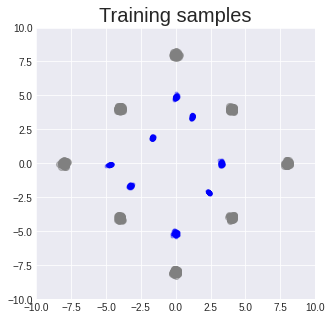

[[1.1281282901763916, 3.406102180480957], [-4.876409530639648, -0.09771296381950378], [-1.660064458847046, 1.8666316270828247], [-0.04714525490999222, 4.8984694480896], [1.2243682146072388, 3.6117594242095947], [1.2133747339248657, 3.513489246368408], [-1.711849570274353, 1.9454100131988525], [0.09464840590953827, -5.298316955566406], [1.252394437789917, 3.4491281509399414], [1.2298667430877686, 3.491572141647339], [3.3191945552825928, -0.08600718528032303], [1.2031164169311523, 3.5723154544830322], [-1.7360343933105469, 1.81153404712677], [3.3481316566467285, 0.00626625120639801], [2.427347421646118, -2.2168548107147217], [0.025665022432804108, 4.995131969451904], [3.3273911476135254, 0.10062753409147263], [-1.7433491945266724, 1.8878847360610962], [-1.6438533067703247, 2.015727996826172], [-4.820196628570557, -0.09544149041175842], [-3.3525686264038086, -1.6406469345092773], [-1.685472011566162, 2.052271604537964], [-1.6982369422912598, 1.9163488149642944], [2.4391748905181885, -2.21

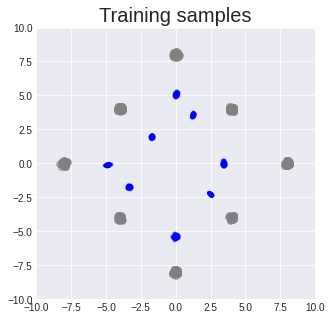

[[0.07985612750053406, 5.138561725616455], [-1.7618305683135986, 2.0864157676696777], [-3.3144567012786865, -1.7773070335388184], [3.4856011867523193, -0.10230235010385513], [0.06652013212442398, -5.4587483406066895], [-4.881063461303711, -0.017255622893571854], [-0.012392781674861908, 5.131233215332031], [-1.8024011850357056, 2.017202377319336], [3.4784393310546875, -0.07211914658546448], [-1.7698183059692383, 1.993057131767273], [3.507523536682129, 0.18135002255439758], [3.408536672592163, -0.1882304549217224], [1.2658780813217163, 3.6691300868988037], [1.2798988819122314, 3.780212163925171], [3.470663070678711, 0.1253269910812378], [-1.7854962348937988, 2.028249740600586], [-3.3352177143096924, -1.778856635093689], [2.4808614253997803, -2.2581913471221924], [0.17781725525856018, -5.474315166473389], [0.012821860611438751, 5.172049522399902], [1.2350858449935913, 3.6891980171203613], [1.2477365732192993, 3.6716043949127197], [0.04975219815969467, 5.210515022277832], [-1.7168558835983

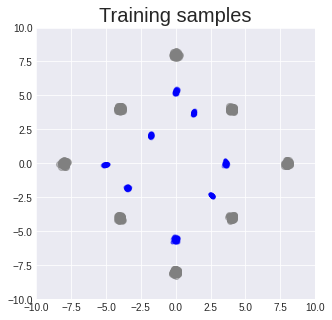

[[2.6319401264190674, -2.483565330505371], [-0.09790507704019547, -5.719820976257324], [3.6511588096618652, 0.1150447353720665], [0.0279746875166893, 5.433897495269775], [1.3120640516281128, 3.9338512420654297], [2.7102928161621094, -2.486069917678833], [0.16779014468193054, -5.638575077056885], [1.2796967029571533, 3.726370096206665], [2.5109126567840576, -2.294719934463501], [-1.8867326974868774, 2.084604501724243], [-3.4645063877105713, -1.8734952211380005], [2.6577210426330566, -2.4411091804504395], [-5.122781276702881, -0.0794685110449791], [1.3043187856674194, 3.714747905731201], [-3.6028103828430176, -1.8617502450942993], [3.624133825302124, -0.005948564037680626], [-1.7595605850219727, 2.134474754333496], [2.597611427307129, -2.38069224357605], [1.3462709188461304, 3.883924961090088], [-3.4496233463287354, -1.9361543655395508], [-3.465226411819458, -1.8179084062576294], [3.684263229370117, -0.0169821809977293], [-1.7913804054260254, 2.118741273880005], [1.2611327171325684, 3.80

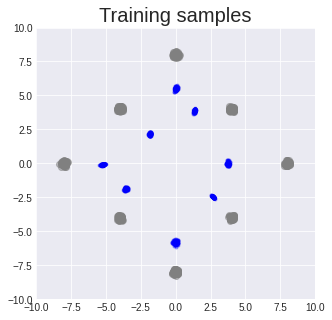

[[1.4063985347747803, 4.012220859527588], [-0.016730360686779022, 5.672396183013916], [-1.8545769453048706, 2.219639778137207], [-5.3268938064575195, -0.11411233246326447], [-3.6379363536834717, -1.9456524848937988], [1.3820842504501343, 4.024394512176514], [-1.9443124532699585, 2.0915024280548096], [1.3054951429367065, 3.9110496044158936], [1.3141216039657593, 3.917384386062622], [1.3316504955291748, 3.909288167953491], [-5.336830139160156, -0.08832240104675293], [-5.313497066497803, -0.06197549030184746], [-5.4564690589904785, -0.1005452573299408], [-1.9043112993240356, 2.163832187652588], [0.026227742433547974, 5.666098117828369], [-1.907196283340454, 2.1424124240875244], [-1.8851757049560547, 2.101365089416504], [-3.576955556869507, -1.8916916847229004], [-1.9097607135772705, 2.225398063659668], [-3.5759739875793457, -1.888533115386963], [3.870370864868164, -0.07090181857347488], [1.3930052518844604, 3.975813627243042], [-1.8409634828567505, 2.1830101013183594], [1.3781185150146484

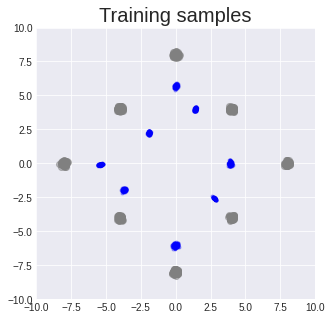

[[-1.876366138458252, 2.344961643218994], [-1.8870880603790283, 2.3310532569885254], [-5.5075225830078125, -0.12036482989788055], [-3.8345160484313965, -1.8598573207855225], [3.9981613159179688, -0.19313758611679077], [1.443735957145691, 3.998779773712158], [1.4678694009780884, 4.076083660125732], [1.4862871170043945, 4.050187110900879], [-3.673905849456787, -2.0870590209960938], [-1.865399718284607, 2.2989628314971924], [-3.6449782848358154, -1.9397855997085571], [3.983151912689209, 0.005681166425347328], [-0.06710530072450638, -6.28260612487793], [-3.842207670211792, -2.1514909267425537], [-1.9612972736358643, 2.307891845703125], [2.8467657566070557, -2.646061420440674], [1.467429518699646, 4.137937068939209], [-0.053286172449588776, 5.746127128601074], [1.4263859987258911, 3.9852688312530518], [-3.8463480472564697, -1.9588605165481567], [-0.006409354507923126, -6.138671875], [4.022554397583008, -0.2059936821460724], [0.016595162451267242, 5.718477249145508], [3.933871269226074, 0.02

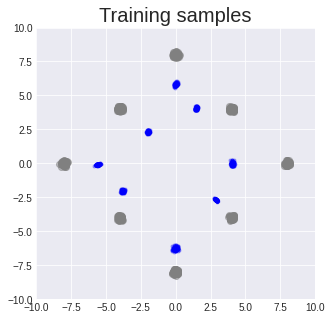

[[2.981194496154785, -2.7663750648498535], [-5.637592315673828, -0.06911695003509521], [1.516083002090454, 4.086983680725098], [2.949877977371216, -2.7461931705474854], [1.5754963159561157, 4.166243553161621], [0.11456277966499329, 6.056758880615234], [-3.8913381099700928, -2.0053210258483887], [-1.956210732460022, 2.3393216133117676], [3.004206895828247, -2.7866528034210205], [-5.680839538574219, -0.08487796038389206], [-3.893552780151367, -2.0909440517425537], [-0.03400915861129761, 5.775283336639404], [1.4420602321624756, 4.068362236022949], [4.122535705566406, -0.13340634107589722], [-0.11421284824609756, -6.390457630157471], [-5.808954238891602, -0.13061074912548065], [-5.638130187988281, -0.11767604947090149], [-0.07450592517852783, 5.861641883850098], [1.5253727436065674, 4.139988899230957], [1.4354673624038696, 3.9250357151031494], [-2.0077459812164307, 2.3308539390563965], [2.983783483505249, -2.7829298973083496], [-5.580617427825928, -0.055831871926784515], [-3.93402910232543

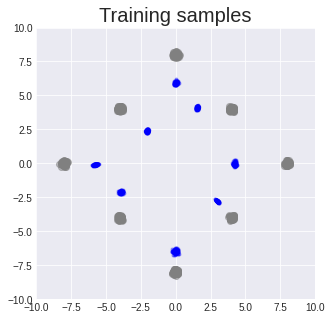

[[4.335265159606934, -0.2141139954328537], [-0.10089606791734695, -6.605781078338623], [-5.680079936981201, -0.04418766498565674], [-0.05552631616592407, -6.488260269165039], [0.054061971604824066, -6.658626556396484], [-0.12203296273946762, -6.372297763824463], [-0.054816730320453644, 6.096212863922119], [3.0759267807006836, -2.845421075820923], [0.006237827241420746, 5.951376438140869], [4.311743259429932, -0.044695958495140076], [-4.077630519866943, -2.257157802581787], [4.280357837677002, -0.09912510216236115], [0.1013670414686203, 6.041250705718994], [-0.018994882702827454, 5.914708137512207], [0.1897907704114914, -6.465041637420654], [1.544326663017273, 3.9474713802337646], [-0.03723134100437164, -6.656806468963623], [-0.0720202773809433, -6.5689005851745605], [4.370609283447266, -0.04857313260436058], [-0.07670425623655319, 5.969191551208496], [1.622409462928772, 4.11594295501709], [-2.1180386543273926, 2.4839258193969727], [-3.952341079711914, -2.2358310222625732], [-3.90142202

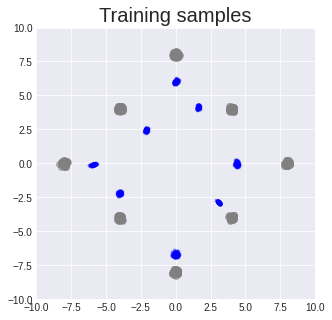

[[-6.059903621673584, -0.1177293062210083], [-4.056063175201416, -2.1630446910858154], [4.50093936920166, -0.03517315536737442], [-3.987656831741333, -2.219501256942749], [1.640034794807434, 4.141168117523193], [3.103980779647827, -2.8664920330047607], [-2.134829044342041, 2.4868927001953125], [-4.01992654800415, -2.12782883644104], [-2.146707773208618, 2.564638137817383], [3.153765916824341, -2.945382833480835], [4.4189558029174805, -0.02483878843486309], [0.016657836735248566, 6.110876083374023], [4.42780065536499, 0.2323414832353592], [-0.017219670116901398, 5.987159729003906], [4.38281774520874, -0.07115281373262405], [1.6053617000579834, 4.131973743438721], [-0.11111750453710556, -6.839809894561768], [-4.106562614440918, -2.1940419673919678], [4.55694055557251, -0.0723322257399559], [3.166264533996582, -2.9613680839538574], [-6.042643070220947, -0.10223061591386795], [0.05944947153329849, 6.168342113494873], [0.02269057184457779, 6.1177520751953125], [0.042003847658634186, -6.8165

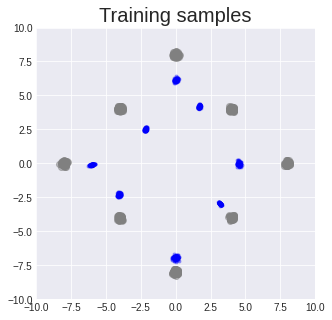

[[1.738715410232544, 4.305416107177734], [1.7389297485351562, 4.241654396057129], [-4.051443576812744, -2.218562602996826], [-6.078057765960693, -0.13443361222743988], [1.806520700454712, 4.212841033935547], [4.609677314758301, -0.050996359437704086], [3.15535044670105, -2.9474575519561768], [3.197249174118042, -3.0747389793395996], [-0.10265786200761795, -7.02177095413208], [-5.965111255645752, -0.04833821952342987], [-5.977230548858643, -0.046348780393600464], [0.11311217397451401, -7.060028076171875], [-2.225728988647461, 2.5635361671447754], [-2.2114453315734863, 2.5728342533111572], [4.641458988189697, 0.011918162927031517], [-0.06456255912780762, -7.206804275512695], [-5.986083030700684, -0.11850322782993317], [-2.132789373397827, 2.544461488723755], [-4.074868202209473, -2.198718786239624], [-0.15592610836029053, -7.044476509094238], [-0.07900947332382202, 6.2163920402526855], [-6.066869735717773, -0.18397918343544006], [-2.2057645320892334, 2.5247044563293457], [-2.196345329284

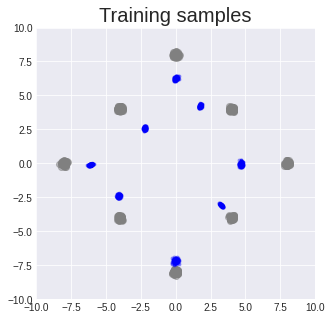

[[4.743058204650879, -0.06699007004499435], [-0.012866504490375519, 6.3420634269714355], [1.826022744178772, 4.303715705871582], [4.727339744567871, 0.011468807235360146], [4.640195369720459, 0.25148314237594604], [3.3170924186706543, -3.0988917350769043], [-0.021233081817626953, -7.193381309509277], [4.716669082641602, 0.15200115740299225], [-0.020562879741191864, 6.395411491394043], [1.8275026082992554, 4.263784885406494], [-2.220337390899658, 2.508115291595459], [3.3048598766326904, -3.1068880558013916], [-4.193471431732178, -2.315742254257202], [4.739559650421143, -0.03003181330859661], [4.789412498474121, -0.040156736969947815], [-6.16000509262085, -0.06024494022130966], [1.7743456363677979, 4.176084995269775], [3.380220651626587, -3.16522479057312], [-0.09355974942445755, -7.119470119476318], [-6.241631031036377, -0.14230303466320038], [1.8814778327941895, 4.148053169250488], [0.028901398181915283, -7.384519577026367], [-2.3148977756500244, 2.5989551544189453], [-0.01854097843170

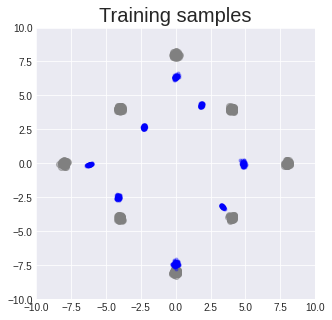

[[0.056169383227825165, 6.340521335601807], [0.07047372311353683, 6.468845367431641], [0.07550417631864548, 6.4468560218811035], [-4.154096603393555, -2.540484666824341], [-4.176455974578857, -2.4674770832061768], [-6.21351957321167, -0.04806552827358246], [-4.117652893066406, -2.62677264213562], [-4.176455974578857, -2.6500442028045654], [-4.119317054748535, -2.4292526245117188], [5.028133869171143, -0.08994641900062561], [-0.08975621312856674, -7.546219825744629], [-6.258602619171143, -0.09447860717773438], [-6.254115104675293, -0.1542712301015854], [1.912593960762024, 4.371993541717529], [1.897576093673706, 4.268826007843018], [-4.105678558349609, -2.650327205657959], [-0.26285675168037415, -7.628059387207031], [-2.310978412628174, 2.6701650619506836], [4.965564250946045, 0.08020438253879547], [-0.13385431468486786, 6.245095252990723], [-4.206466197967529, -2.57035493850708], [-2.2810497283935547, 2.682110071182251], [4.888639450073242, 0.026634594425559044], [0.011508136987686157, 

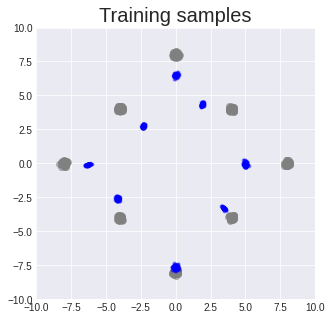

[[-4.1951093673706055, -2.6345245838165283], [0.0933244377374649, -7.797298431396484], [-2.333946704864502, 2.6530933380126953], [5.018653392791748, -0.07142982631921768], [3.551119089126587, -3.3536813259124756], [-4.290421485900879, -2.63820219039917], [5.029440879821777, -0.04038386791944504], [-4.313639163970947, -2.7455687522888184], [-2.253262758255005, 2.9081742763519287], [5.059150218963623, 0.11434638500213623], [5.029758930206299, -0.12561063468456268], [-0.20719507336616516, -7.822346210479736], [-6.3893561363220215, -0.12956425547599792], [-2.2603745460510254, 2.7226710319519043], [-2.3338773250579834, 2.856172800064087], [5.104876518249512, -0.23587565124034882], [-0.11896659433841705, -7.520345687866211], [3.489319086074829, -3.3788156509399414], [-4.1896538734436035, -2.479649543762207], [3.430311441421509, -3.268035888671875], [0.03457950800657272, -7.7923760414123535], [0.004805125296115875, 6.5537428855896], [-2.367426872253418, 2.808701276779175], [-2.41770076751709,

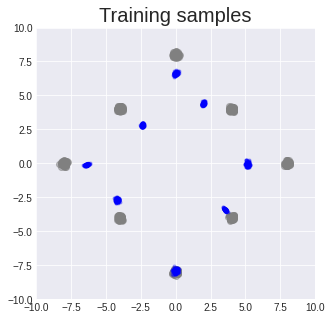

[[-4.2504448890686035, -2.7593507766723633], [-6.432065963745117, -0.09925311803817749], [2.0931854248046875, 4.539010524749756], [3.61384654045105, -3.485896110534668], [2.0101606845855713, 4.361965179443359], [5.253627777099609, -0.06563445925712585], [-6.402766227722168, -0.06726200133562088], [-0.10874325782060623, 6.711462497711182], [3.647930860519409, -3.468416213989258], [2.057140827178955, 4.436493396759033], [0.03747362643480301, 6.692734718322754], [0.08708471804857254, 6.813386917114258], [2.0290045738220215, 4.455689907073975], [0.005328185856342316, -7.906374454498291], [-4.273972034454346, -2.6136860847473145], [-4.124624252319336, -2.693767547607422], [-6.2969651222229, -0.018428191542625427], [3.5782852172851562, -3.42685604095459], [3.6875178813934326, -3.5649685859680176], [3.6770832538604736, -3.5582213401794434], [2.0444231033325195, 4.456705570220947], [-4.292640686035156, -2.756774425506592], [3.538433790206909, -3.4398789405822754], [0.040526971220970154, -8.123

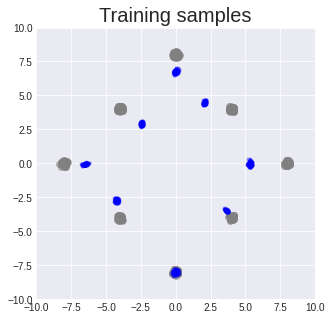

[[-2.3920950889587402, 2.825636148452759], [5.408369064331055, -0.053411539644002914], [-6.464082717895508, 0.0006083063781261444], [2.1324450969696045, 4.51455020904541], [-2.500678539276123, 2.9038169384002686], [-2.402961492538452, 2.974719285964966], [0.018234767019748688, 6.793569564819336], [5.350001335144043, 0.023974036797881126], [-6.331011772155762, 0.06191657483577728], [-6.537065505981445, -0.132320374250412], [5.4912309646606445, -0.20597998797893524], [5.439582347869873, 0.09101442992687225], [0.03169679641723633, 6.8836164474487305], [-0.050206638872623444, -7.994462490081787], [0.08329075574874878, 6.899117469787598], [-2.5448687076568604, 2.8323028087615967], [1.997329592704773, 4.390746593475342], [0.055581122636795044, 6.649658203125], [-2.433957576751709, 2.9880619049072266], [5.394689083099365, -0.2604092061519623], [-4.393553256988525, -2.5755510330200195], [-6.4262189865112305, 0.07229705154895782], [-6.497547149658203, -0.06745743751525879], [-0.0572479590773582

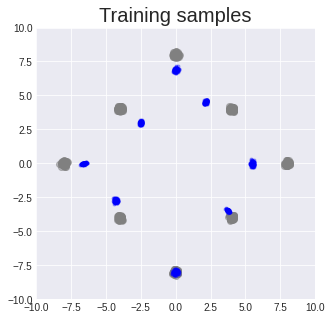

[[-2.514198064804077, 3.171604633331299], [3.743565082550049, -3.448167085647583], [-2.506263256072998, 2.9748337268829346], [-6.653059005737305, -0.0334407314658165], [-4.421809196472168, -2.6932132244110107], [-6.797605514526367, -0.06313028931617737], [-0.20229743421077728, -8.061613082885742], [3.789083957672119, -3.4459776878356934], [5.637885570526123, -0.10503891110420227], [0.007097668945789337, 6.941904067993164], [-0.07804130762815475, 6.842404842376709], [2.1294937133789062, 4.481893062591553], [-2.4725284576416016, 3.1338720321655273], [-0.12646208703517914, -7.993877410888672], [-2.5005760192871094, 3.0461058616638184], [-0.07867372035980225, -8.006404876708984], [3.753645420074463, -3.5503745079040527], [2.121568441390991, 4.381579875946045], [-0.07996592670679092, 6.93284797668457], [-6.544790267944336, 0.03850768506526947], [-0.12437554448843002, 6.981106281280518], [3.7506628036499023, -3.402838706970215], [-6.716437816619873, 0.02194095216691494], [-2.515477180480957,

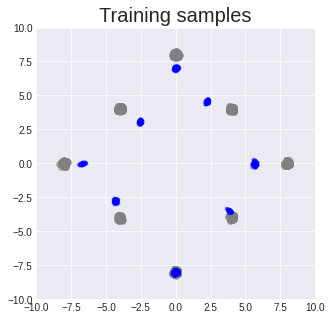

[[-6.8249831199646, -0.08479108661413193], [-4.263099670410156, -2.739603281021118], [5.8294219970703125, -0.07324351370334625], [-2.69732403755188, 3.1161811351776123], [-4.486884593963623, -2.8425180912017822], [-2.4751839637756348, 3.1232059001922607], [3.8969173431396484, -3.5355074405670166], [2.263558864593506, 4.473463535308838], [-4.431612491607666, -2.6996326446533203], [-4.230846405029297, -2.7000837326049805], [-6.637192726135254, 0.024020105600357056], [2.2730743885040283, 4.572127819061279], [-6.66472053527832, 0.04775974154472351], [-0.0014144927263259888, 7.039170742034912], [-6.742395877838135, -0.015306780114769936], [5.873723030090332, -0.06588178128004074], [3.8857457637786865, -3.4568052291870117], [5.718659400939941, -0.02583577297627926], [-6.638467788696289, 0.029955269768834114], [-4.311535358428955, -2.9409003257751465], [-6.894638538360596, 0.00093805231153965], [5.701830863952637, -0.1020544022321701], [-0.06022178381681442, 7.02867317199707], [-6.71903419494

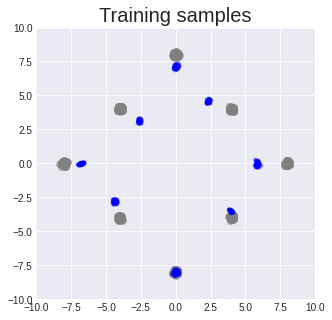

[[5.914514064788818, 0.0013291165232658386], [3.9893946647644043, -3.5117838382720947], [-0.12707456946372986, 7.212345123291016], [-2.610045909881592, 3.1183290481567383], [4.048262596130371, -3.5529584884643555], [0.06420238316059113, 7.1085524559021], [-4.373275279998779, -2.753483772277832], [-0.032850250601768494, 7.122564315795898], [-6.883594036102295, -0.01768067292869091], [-2.5943777561187744, 3.2488555908203125], [-2.6888253688812256, 3.2117505073547363], [-0.030713878571987152, 7.167657375335693], [-6.857754230499268, 0.02634173072874546], [0.09314356744289398, -8.048731803894043], [-6.861082553863525, -0.03313206881284714], [0.150853231549263, -7.999404430389404], [0.07683176547288895, 7.132306098937988], [-6.8651323318481445, 0.001207323744893074], [-0.09939432889223099, -8.068755149841309], [5.912851810455322, 0.13997000455856323], [3.949721336364746, -3.486889123916626], [2.4056663513183594, 4.527083396911621], [-2.6075069904327393, 3.2224061489105225], [-0.124877095222

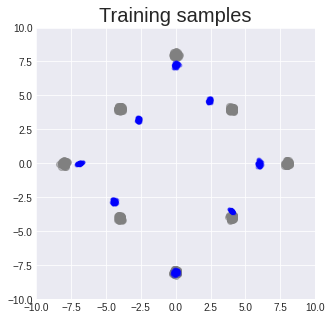

[[-0.13361063599586487, 7.296286106109619], [-2.643125534057617, 3.251634359359741], [-4.494880199432373, -2.8368983268737793], [3.994692325592041, -3.4946231842041016], [-6.848629474639893, 0.05632513016462326], [-4.3892035484313965, -2.7640836238861084], [-2.740196704864502, 3.176002025604248], [-2.8099610805511475, 3.211690902709961], [4.0402607917785645, -3.507857084274292], [-2.7171921730041504, 3.2725789546966553], [-4.345338344573975, -2.7034754753112793], [6.014713764190674, -0.10016335546970367], [6.06907844543457, -0.2347208559513092], [4.013338088989258, -3.4909441471099854], [-2.644864797592163, 3.338296413421631], [0.12198390066623688, -8.05424976348877], [0.032697200775146484, 7.382632732391357], [-2.7082936763763428, 3.4228122234344482], [-6.910449028015137, 0.03809528052806854], [-0.06049376726150513, 7.2707695960998535], [-6.966373920440674, -0.025610439479351044], [6.09639835357666, 0.10922624915838242], [-2.706544876098633, 3.230344295501709], [0.17252099514007568, -

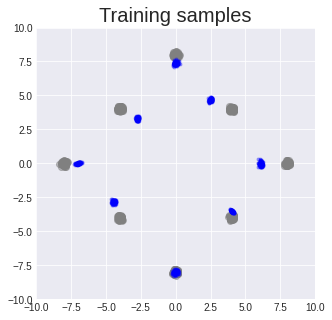

[[6.0846099853515625, -0.016488831490278244], [0.14577701687812805, 7.648297309875488], [-7.039565563201904, 0.030713867396116257], [4.17472505569458, -3.6312217712402344], [-0.1147109642624855, -8.02815055847168], [-4.5462541580200195, -2.904902219772339], [-4.439451694488525, -2.8601179122924805], [3.975996255874634, -3.496128797531128], [-4.471567630767822, -2.6743457317352295], [0.026205919682979584, -7.993890285491943], [4.121627330780029, -3.619619131088257], [6.341606616973877, -0.12114450335502625], [-7.046520233154297, 0.030063021928071976], [-4.348962306976318, -2.8089382648468018], [0.15381675958633423, 7.3610663414001465], [-4.5137176513671875, -2.725633382797241], [6.271468162536621, -0.09336746484041214], [-2.743302822113037, 3.495546340942383], [-2.780834674835205, 3.185770034790039], [0.1559518575668335, -8.02298641204834], [6.12313175201416, -0.014676494523882866], [-4.418795108795166, -2.7913475036621094], [-2.7062156200408936, 3.309500217437744], [2.5859591960906982,

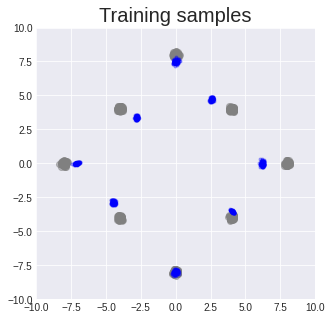

[[-2.85886287689209, 3.447599411010742], [2.588858127593994, 4.77371883392334], [-7.2193708419799805, -0.03442932665348053], [2.620112895965576, 4.753359317779541], [6.294697284698486, -0.2200794667005539], [-7.100406646728516, 0.0019997339695692062], [-0.035294800996780396, 7.518256187438965], [-7.075620651245117, -0.0009640920907258987], [4.01378870010376, -3.494229555130005], [4.034030437469482, -3.4885928630828857], [6.260422229766846, 0.1437588334083557], [-7.188994884490967, -0.022331727668642998], [0.1976660192012787, 7.6619415283203125], [2.6119208335876465, 4.758440971374512], [-4.480144500732422, -2.8412604331970215], [2.560643434524536, 4.780213356018066], [-0.025170080363750458, 7.430395126342773], [4.121702671051025, -3.6198177337646484], [-0.08666624873876572, -8.082176208496094], [-2.8360371589660645, 3.402070999145508], [4.152336597442627, -3.585315227508545], [4.0765275955200195, -3.5691213607788086], [-2.8307175636291504, 3.4582300186157227], [4.160402297973633, -3.58

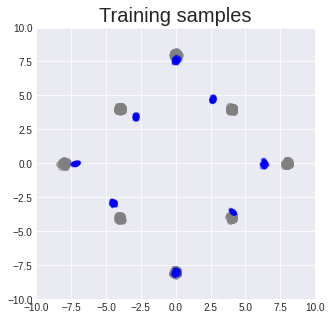

[[-2.9528188705444336, 3.5989983081817627], [-2.9367008209228516, 3.405133008956909], [2.6052935123443604, 4.710041046142578], [2.642860174179077, 4.6359710693359375], [-2.8422391414642334, 3.527134656906128], [0.04479048401117325, 7.793276786804199], [-7.4753923416137695, -0.13351933658123016], [2.780611276626587, 4.904180526733398], [2.7095823287963867, 4.658923625946045], [0.1577749252319336, -8.037169456481934], [-0.04026506096124649, -7.933225154876709], [0.1232711598277092, 7.740810394287109], [-7.247218132019043, -0.0380643829703331], [4.084007263183594, -3.559901714324951], [-7.204654693603516, 0.0423692986369133], [-7.284772872924805, -0.11450300365686417], [-4.591106414794922, -2.9748384952545166], [-0.019956693053245544, 7.797305107116699], [-2.8616931438446045, 3.503298044204712], [2.73747181892395, 4.709528923034668], [-7.141432762145996, 0.09177807718515396], [-7.252567768096924, 0.03497740626335144], [6.435916900634766, -0.09325332939624786], [6.263506889343262, -0.06081

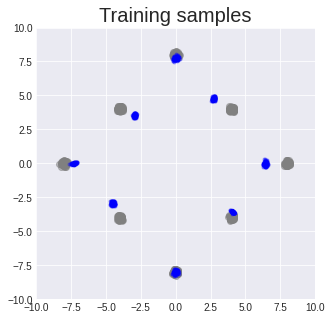

[[6.443104267120361, 0.26479947566986084], [-2.8934059143066406, 3.581792116165161], [-2.938937187194824, 3.5647213459014893], [-4.588756084442139, -2.7679505348205566], [2.7772157192230225, 4.8124871253967285], [-0.11266491562128067, -8.026183128356934], [2.8186984062194824, 4.741999626159668], [6.564648151397705, -0.1854238063097], [-0.09271103888750076, 7.689614295959473], [-7.345963478088379, 0.015366550534963608], [-3.0727803707122803, 3.5401337146759033], [6.424633502960205, -0.00816291943192482], [-2.962170124053955, 3.415492296218872], [-0.03817383199930191, -7.943508625030518], [4.058172702789307, -3.518019437789917], [3.993694305419922, -3.500488519668579], [-2.98669695854187, 3.620398998260498], [-2.87522292137146, 3.4101829528808594], [-4.663019180297852, -2.9602065086364746], [-7.365052223205566, 0.050680965185165405], [-0.1895771622657776, -7.999415874481201], [0.10473476350307465, 7.863407611846924], [-3.0425424575805664, 3.4237658977508545], [-7.342684268951416, -0.0323

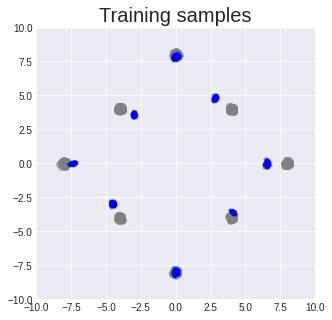

[[0.08182988315820694, -8.032642364501953], [-4.515965461730957, -2.994823455810547], [-4.593687534332275, -3.0763444900512695], [-4.569195747375488, -2.878617286682129], [2.8258001804351807, 4.887347221374512], [-4.523106575012207, -2.9937150478363037], [2.900130033493042, 4.9579291343688965], [-4.341058731079102, -3.1127398014068604], [2.897369623184204, 4.7764434814453125], [-4.542966842651367, -2.9613308906555176], [0.07800476253032684, 8.024242401123047], [-0.17609132826328278, 7.957681655883789], [0.13916540145874023, 7.820318698883057], [4.22782039642334, -3.6933341026306152], [2.799722909927368, 4.877986431121826], [-3.0677731037139893, 3.578047752380371], [2.9594340324401855, 4.659068584442139], [-0.08429348468780518, -7.93627405166626], [-3.0455737113952637, 3.6261842250823975], [2.9298503398895264, 5.000854015350342], [0.0818764939904213, 7.858886241912842], [-0.08177568763494492, 7.87953519821167], [-7.490731716156006, -0.03613065183162689], [4.037960529327393, -3.541866540

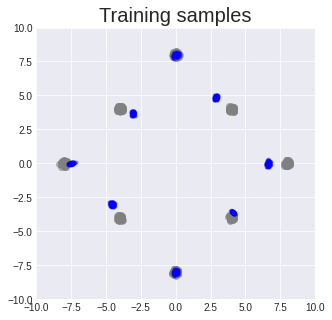

[[-4.5957417488098145, -3.0111072063446045], [-3.1709327697753906, 3.797218084335327], [4.174615383148193, -3.6664817333221436], [6.716673374176025, 0.16380923986434937], [2.9778857231140137, 4.752962112426758], [6.551754951477051, -0.020455563440918922], [4.1557512283325195, -3.7070164680480957], [-3.0752670764923096, 3.717910051345825], [-3.046597480773926, 3.6564998626708984], [6.512245178222656, -0.10130071640014648], [-0.0249410942196846, -7.902205944061279], [-4.42694091796875, -3.045724391937256], [4.197152614593506, -3.668856620788574], [2.9205522537231445, 4.8854594230651855], [-0.10040860623121262, -7.967509746551514], [0.0217459574341774, 8.26280403137207], [4.208498477935791, -3.7173941135406494], [-0.035583965480327606, -8.126301765441895], [-3.026874303817749, 3.721543312072754], [4.079533576965332, -3.5554885864257812], [3.0143654346466064, 4.760842323303223], [-7.633733749389648, -0.025153858587145805], [-7.576394081115723, -0.03480091691017151], [-4.651496887207031, -2

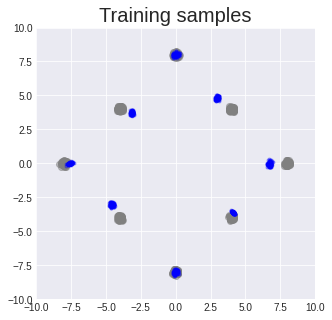

[[-4.640234470367432, -3.148022174835205], [0.027257204055786133, -7.99433708190918], [3.0139529705047607, 4.812319755554199], [-7.631967544555664, -0.00304352305829525], [0.15486925840377808, -7.833338260650635], [4.121253967285156, -3.679987668991089], [-4.581430435180664, -2.8992581367492676], [4.152299404144287, -3.6306817531585693], [-3.1083662509918213, 3.6055867671966553], [6.747249126434326, -0.09971357882022858], [-4.558375835418701, -3.0175352096557617], [4.083529949188232, -3.557971477508545], [-0.08372767269611359, 7.95003080368042], [-0.11730553209781647, -8.067792892456055], [0.027349397540092468, 8.037060737609863], [-7.669585227966309, -0.08425977826118469], [-4.58950662612915, -3.152127265930176], [-0.07464292645454407, -8.142916679382324], [-7.529387474060059, -0.04989468306303024], [6.951350212097168, -0.09895016998052597], [-4.452968597412109, -3.253999948501587], [-7.64775276184082, -0.04510799050331116], [0.10365605354309082, -7.887197494506836], [4.16178703308105

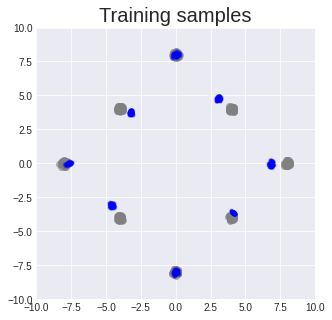

[[-0.16424094140529633, 7.961907863616943], [3.109112501144409, 4.800722122192383], [-0.17271022498607635, 7.980867862701416], [3.207214117050171, 4.62833833694458], [-0.0029082149267196655, -7.809235572814941], [-7.7601118087768555, 0.016755729913711548], [4.041501045227051, -3.574178457260132], [-0.10032113641500473, -7.805608749389648], [-0.030389778316020966, 8.130203247070312], [-4.617196083068848, -2.967975378036499], [4.089122772216797, -3.5745582580566406], [-7.764388084411621, 0.057865507900714874], [-3.330132007598877, 3.7789976596832275], [4.110133171081543, -3.616192579269409], [-0.0440550222992897, -8.127747535705566], [4.1437578201293945, -3.664715051651001], [6.849942207336426, -0.2658537030220032], [3.03104305267334, 4.683752059936523], [-3.324744701385498, 3.724728584289551], [-0.10456633567810059, 7.989095211029053], [-0.1461012065410614, 7.931955337524414], [4.056906223297119, -3.5381767749786377], [6.82000207901001, -0.05994460731744766], [4.138045787811279, -3.6353

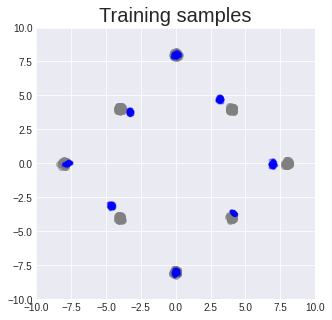

[[-4.769332408905029, -3.0687739849090576], [0.06151878833770752, -8.136226654052734], [-7.7730631828308105, -0.010867711156606674], [-4.651075839996338, -3.110097885131836], [0.07761465013027191, -8.013199806213379], [3.229851245880127, 4.646049499511719], [-3.3805415630340576, 3.8228671550750732], [-3.2540524005889893, 3.738009452819824], [4.078861713409424, -3.6302058696746826], [-4.768639087677002, -3.1804683208465576], [-0.10462846606969833, -7.986031532287598], [-3.3797802925109863, 3.7818267345428467], [-3.459388494491577, 3.832644462585449], [-4.778491020202637, -2.920660972595215], [4.118593692779541, -3.6753389835357666], [3.3270485401153564, 4.818310737609863], [6.982717037200928, -0.27574488520622253], [4.127120494842529, -3.610527992248535], [-7.9172844886779785, -0.015579866245388985], [3.2344934940338135, 4.8390655517578125], [0.10450035333633423, -7.897999286651611], [6.933261394500732, -0.12032540142536163], [0.13250452280044556, -7.908615589141846], [-3.36817789077758

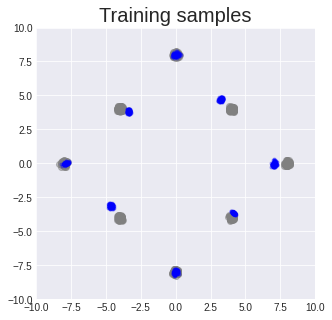

[[3.3233399391174316, 4.707869529724121], [4.109212875366211, -3.7047619819641113], [-0.03956945985555649, 8.016458511352539], [0.23909679055213928, 7.931195259094238], [-3.385416030883789, 3.9278106689453125], [3.3256685733795166, 4.7644944190979], [0.01699940860271454, -8.090850830078125], [-7.939159870147705, -0.0012592505663633347], [-7.864264488220215, 0.038069501519203186], [-0.061242662370204926, -7.99979305267334], [0.06109043210744858, 7.912043571472168], [-4.75351095199585, -3.028902769088745], [-7.848563194274902, 0.1329905241727829], [0.20095455646514893, -7.988951206207275], [-7.97892951965332, 0.07284694910049438], [4.114860534667969, -3.6123085021972656], [0.20619842410087585, -8.170282363891602], [-7.973409652709961, -0.045348621904850006], [-7.85897159576416, -0.047068916261196136], [3.4184224605560303, 4.730673313140869], [3.184972047805786, 4.625486850738525], [-4.654241561889648, -3.249424934387207], [-7.898927688598633, 0.04977156221866608], [-0.10672545433044434, 

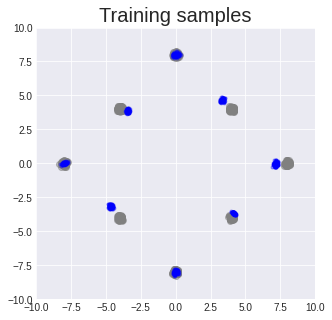

[[-8.060404777526855, 0.12054461985826492], [4.103560447692871, -3.6415224075317383], [-4.8710856437683105, -3.0099904537200928], [7.331928253173828, 0.08168055862188339], [0.039841070771217346, 8.019287109375], [-7.796759605407715, 0.14912664890289307], [3.422370195388794, 4.760430812835693], [-3.5586159229278564, 3.7377512454986572], [3.3685050010681152, 4.535579681396484], [0.1703236997127533, 8.035579681396484], [-3.4468064308166504, 3.872427463531494], [-3.493154525756836, 3.8911867141723633], [-4.6827545166015625, -3.2094345092773438], [-0.0933375284075737, -7.995267391204834], [-8.003180503845215, 0.018342388793826103], [4.145471096038818, -3.7643702030181885], [-3.5131659507751465, 3.9843029975891113], [7.285716533660889, 0.08192756026983261], [-7.910165309906006, 0.0814281776547432], [3.5038599967956543, 4.782999038696289], [4.1720871925354, -3.6874403953552246], [-3.4520678520202637, 4.050752639770508], [3.490036964416504, 4.666057109832764], [-0.023053765296936035, 7.8991975

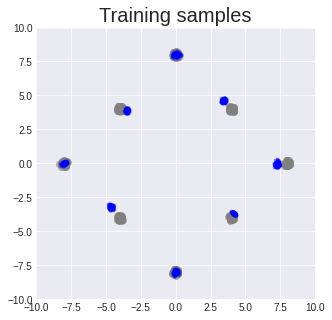

[[4.1748809814453125, -3.6814305782318115], [0.02356819063425064, 7.986441612243652], [0.12077222019433975, -7.813075065612793], [3.460806131362915, 4.667122840881348], [7.225876808166504, 0.013703154399991035], [-3.4335405826568604, 3.99577260017395], [-3.452301025390625, 3.7787654399871826], [-4.691953659057617, -3.2356128692626953], [3.4945080280303955, 4.686433792114258], [-4.75332498550415, -3.118739128112793], [0.0005942657589912415, -7.929229736328125], [-4.525637149810791, -3.0361216068267822], [-0.17498187720775604, 7.989421367645264], [4.203442096710205, -3.735086441040039], [-3.5134594440460205, 3.8755555152893066], [-4.629076957702637, -3.2911622524261475], [7.414679050445557, 0.04104685038328171], [-4.70974063873291, -3.281243324279785], [7.459669589996338, 0.14389848709106445], [4.261341571807861, -3.7772016525268555], [0.384219765663147, 7.946557998657227], [-0.08278324455022812, -8.191911697387695], [0.010837502777576447, -7.759679317474365], [3.4894137382507324, 4.6483

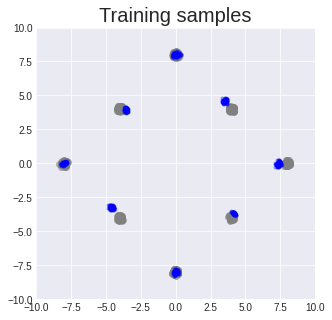

[[-0.008888185024261475, 8.116905212402344], [-3.520685911178589, 3.9005331993103027], [0.018850982189178467, 8.014266014099121], [-4.514636993408203, -3.363328695297241], [3.5122764110565186, 4.449857711791992], [-4.566867828369141, -3.1469709873199463], [7.442817211151123, 0.07953077554702759], [-8.048304557800293, -0.04346803203225136], [3.439966917037964, 4.565826416015625], [-4.672045707702637, -3.285937786102295], [7.371452331542969, 0.001880411058664322], [7.482002258300781, 0.020512152463197708], [-3.527433156967163, 3.9357171058654785], [4.24714469909668, -3.695702314376831], [-3.5484507083892822, 3.788045883178711], [3.4358787536621094, 4.589133262634277], [-3.5583744049072266, 3.9433839321136475], [7.292431354522705, 0.26811647415161133], [-0.18898242712020874, 7.993560791015625], [-7.842528820037842, 0.04909253120422363], [-7.957342624664307, -0.008313789963722229], [3.387734889984131, 4.534542083740234], [0.1718301922082901, 8.03993034362793], [4.174365043640137, -3.705429

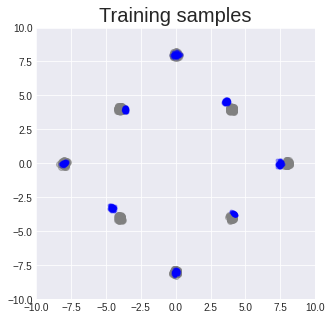

[[-0.06728243082761765, -7.96641731262207], [-0.09251881390810013, -8.028036117553711], [-3.6684274673461914, 3.9239253997802734], [4.297504901885986, -3.7992124557495117], [7.639203071594238, -0.07337594777345657], [-3.5701684951782227, 3.9391250610351562], [7.459495544433594, -0.09452661126852036], [-4.664899826049805, -3.2986316680908203], [0.03131449967622757, -8.07713794708252], [4.235439777374268, -3.7999911308288574], [-0.002435915172100067, -8.054082870483398], [-8.147871017456055, -0.020138129591941833], [7.3921380043029785, -0.10776287317276001], [-7.9881768226623535, -0.09348325431346893], [0.13880789279937744, 7.957332134246826], [-3.734628200531006, 3.9517762660980225], [-7.971436023712158, 0.17880217730998993], [-0.13070064783096313, -8.00973129272461], [-3.72183895111084, 3.9902782440185547], [-0.16965731978416443, -8.004389762878418], [4.10968542098999, -3.6671431064605713], [7.360405445098877, -0.09767783433198929], [-4.460153579711914, -3.3807640075683594], [3.5374975

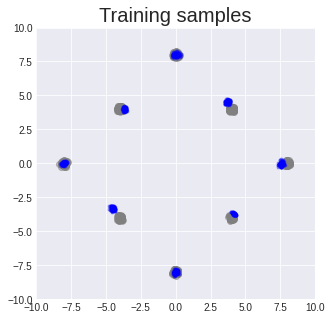

[[-7.906497478485107, -0.06469623744487762], [0.08735334873199463, -7.967862606048584], [7.647464275360107, -0.009241718798875809], [3.8772425651550293, 4.46538782119751], [3.6633918285369873, 4.312272071838379], [3.629951000213623, 4.596986770629883], [-8.145812034606934, 0.08137616515159607], [3.905789375305176, 4.465091705322266], [0.14113333821296692, 8.109545707702637], [3.7343549728393555, 4.638228416442871], [3.727105140686035, 4.365015029907227], [-0.10459057241678238, 7.885692596435547], [-0.08045774698257446, -7.982609272003174], [7.568573474884033, -0.10349465161561966], [-8.16640567779541, -0.04564780741930008], [-3.6423041820526123, 3.9611682891845703], [-3.6876962184906006, 4.002636909484863], [4.190990924835205, -3.751554012298584], [3.844313383102417, 4.318936347961426], [-0.05417045205831528, -8.1471586227417], [-3.672053575515747, 3.9730207920074463], [0.04609868675470352, -8.042516708374023], [3.6608853340148926, 4.454998016357422], [0.1893448531627655, 7.86018133163

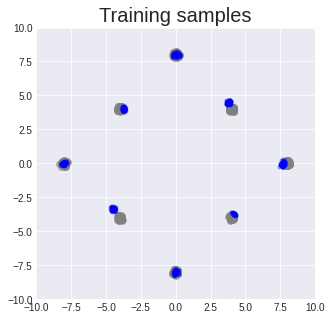

[[-3.7453722953796387, 3.8945178985595703], [0.016032129526138306, -7.809025287628174], [-7.97463321685791, -0.11338035762310028], [3.6602299213409424, 4.325202465057373], [-0.13697543740272522, -8.016119003295898], [0.017795614898204803, -8.023308753967285], [-7.864471912384033, -0.08378075808286667], [7.7501115798950195, -0.17790144681930542], [4.214206218719482, -3.751579999923706], [4.123775482177734, -3.712799072265625], [0.140360027551651, 8.037514686584473], [7.8441972732543945, -0.062413036823272705], [3.994774103164673, 4.563990116119385], [-4.563368797302246, -3.4248650074005127], [0.17724855244159698, -7.8544440269470215], [7.829061508178711, -0.04470907524228096], [-3.8161780834198, 3.9479007720947266], [3.695030689239502, 4.505423069000244], [-4.46832799911499, -3.443190574645996], [-0.008748993277549744, -8.280487060546875], [3.8579607009887695, 4.571425437927246], [3.8679544925689697, 4.435319423675537], [4.211529731750488, -3.8234243392944336], [0.028634190559387207, 7.

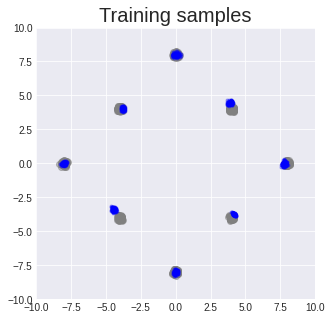

[[-0.05858922749757767, -7.970467567443848], [-3.838524580001831, 4.213167190551758], [4.0388569831848145, 4.397559642791748], [-7.991730213165283, -0.12554234266281128], [4.030440807342529, 4.268111705780029], [-3.7988803386688232, 3.9880168437957764], [-4.344603061676025, -3.3718860149383545], [-0.17897984385490417, -8.084643363952637], [4.040006160736084, 4.354459762573242], [-0.00813339650630951, -8.278779983520508], [-3.865586042404175, 4.042826175689697], [-8.068929672241211, 0.06755218654870987], [7.84183931350708, -0.04368210211396217], [-7.978490829467773, 0.17601324617862701], [7.840735912322998, 0.23658707737922668], [4.274295806884766, -3.8546531200408936], [4.132065296173096, -3.6986916065216064], [-3.8648853302001953, 4.033088684082031], [7.779394149780273, 0.0250818133354187], [-4.561550140380859, -3.4277403354644775], [0.2028682678937912, -8.16318130493164], [-3.8528754711151123, 4.150643348693848], [-3.940753698348999, 3.859478712081909], [-0.10181646049022675, -8.2067

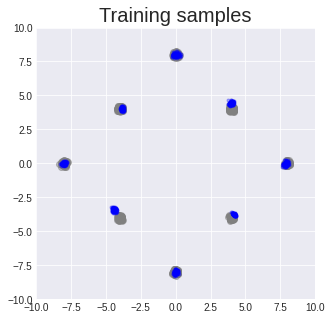

[[4.124943256378174, -3.7014312744140625], [-4.4357500076293945, -3.6317358016967773], [-3.872408628463745, 3.940492630004883], [-8.104497909545898, -0.0801648497581482], [4.024145603179932, 4.5165557861328125], [8.083270072937012, 0.10985768586397171], [-4.303724765777588, -3.620668649673462], [7.997653484344482, 0.026611080393195152], [-0.035992130637168884, 7.905496597290039], [-3.841820001602173, 3.998605966567993], [-0.23048199713230133, 7.91710090637207], [-3.850276231765747, 4.196910858154297], [-0.06639713048934937, -8.107194900512695], [-4.411257743835449, -3.274510383605957], [4.306861877441406, -3.8730123043060303], [-0.05024652183055878, -8.183601379394531], [7.707910537719727, -0.08970888704061508], [4.133467674255371, 4.57868766784668], [4.1578898429870605, -3.6984245777130127], [-4.4236297607421875, -3.4218976497650146], [-3.89312481880188, 3.827840566635132], [-3.89412522315979, 3.941685676574707], [4.180612564086914, -3.7373340129852295], [-0.051094911992549896, -8.125

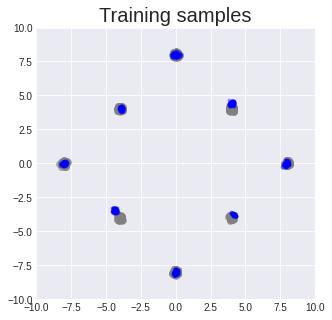

[[4.104011058807373, -3.766126871109009], [-3.9458794593811035, 4.201931476593018], [0.058986276388168335, -8.131828308105469], [-7.899143218994141, -0.07216393947601318], [-0.043216802179813385, -7.998647689819336], [0.029101230204105377, -8.072185516357422], [0.019278116524219513, -8.069584846496582], [-3.8420886993408203, 3.9767630100250244], [4.107032775878906, 4.495572090148926], [3.813303232192993, 4.262057304382324], [4.159365653991699, -3.8124825954437256], [4.135685920715332, -3.741589307785034], [-3.985726833343506, 4.111474514007568], [3.868401288986206, 4.404412746429443], [-3.9171576499938965, 3.986548900604248], [-7.995373725891113, 0.13388505578041077], [-3.940798282623291, 4.052414417266846], [4.185369491577148, -3.859049081802368], [-4.048479080200195, 3.8652455806732178], [-8.06943130493164, -0.11107040196657181], [7.862007141113281, -0.1983679234981537], [-0.031717777252197266, -7.927005290985107], [-7.867215633392334, -0.09328992664813995], [3.974246025085449, 4.340

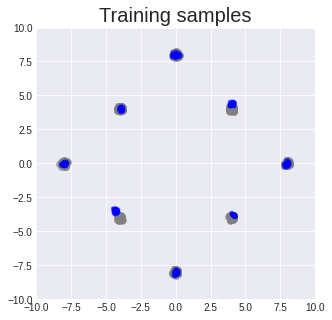

[[4.077080249786377, 4.556814670562744], [-0.07904114574193954, -7.764173984527588], [0.01909872144460678, -8.161727905273438], [4.050361633300781, -3.7059998512268066], [-8.078036308288574, 0.07386361062526703], [-4.034305095672607, 3.976569890975952], [-8.06833267211914, 0.03224445879459381], [-3.873961925506592, 4.000559329986572], [-0.245376318693161, 8.160001754760742], [8.020352363586426, -0.10101743787527084], [-8.051370620727539, -0.0020468737930059433], [-3.9445173740386963, 3.8558943271636963], [-4.345972061157227, -3.324291229248047], [3.974329710006714, -3.673710346221924], [4.096162796020508, 4.4645490646362305], [4.149170875549316, 4.459599494934082], [-0.04297041893005371, -8.184883117675781], [-0.032901301980018616, -8.114327430725098], [-0.04120588302612305, -7.888684272766113], [0.1013564020395279, 8.05578327178955], [-0.17090053856372833, 8.172755241394043], [-4.000993728637695, 4.129171848297119], [-0.13708199560642242, 7.9135637283325195], [-0.09384460747241974, 8.

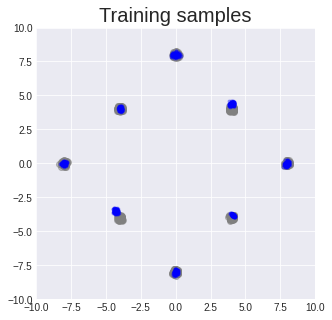

[[0.19344237446784973, 7.934964656829834], [-3.9963643550872803, 4.057076930999756], [-8.017781257629395, -0.10337872803211212], [8.000824928283691, 0.021099109202623367], [7.996067523956299, 0.14221762120723724], [7.90588903427124, -0.1425199806690216], [-8.079742431640625, 0.0737663060426712], [0.10023897886276245, -7.893987655639648], [7.779669284820557, -0.018427031114697456], [-0.19564604759216309, 8.060791969299316], [7.9967570304870605, 0.2470926195383072], [4.026045799255371, -3.7279694080352783], [-4.0442399978637695, 4.110995292663574], [-0.2071317732334137, 8.024321556091309], [-0.23975658416748047, 8.068129539489746], [-0.15509235858917236, 7.9542670249938965], [-8.220047950744629, -0.03790678828954697], [-4.096854209899902, 4.007879734039307], [-4.035041809082031, 4.033400058746338], [4.123476982116699, -3.8051021099090576], [4.192074775695801, -3.901364326477051], [4.161487102508545, 4.498386383056641], [-0.05040210485458374, -7.973151683807373], [-4.411508560180664, -3.5

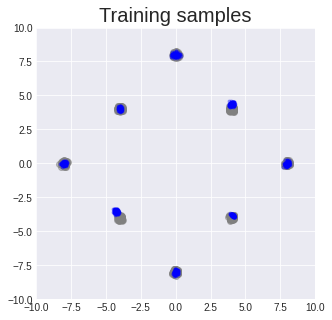

[[8.080455780029297, 0.09725770354270935], [8.09412956237793, 0.09920559823513031], [-4.174481391906738, -3.6593918800354004], [8.020471572875977, 0.08617228269577026], [-8.152974128723145, -0.054750993847846985], [4.165904998779297, -3.8608412742614746], [-8.022611618041992, -0.07729388773441315], [0.002329811453819275, -7.933155536651611], [4.084759712219238, 4.284843921661377], [0.11987295746803284, -7.9276957511901855], [3.9717857837677, 4.289496421813965], [4.15443229675293, 4.225687503814697], [7.842611789703369, -0.09432998299598694], [-4.242185115814209, -3.438873291015625], [-8.027837753295898, -0.0600154735147953], [-4.390133380889893, -3.394318103790283], [0.11217876523733139, 8.031196594238281], [-3.9977664947509766, 4.184220314025879], [7.988962173461914, 0.08531292527914047], [3.92203426361084, 4.448281288146973], [7.826664924621582, -0.010915961116552353], [-3.9464144706726074, 4.016539573669434], [-3.9579076766967773, 3.89892840385437], [4.157588481903076, 4.47770786285

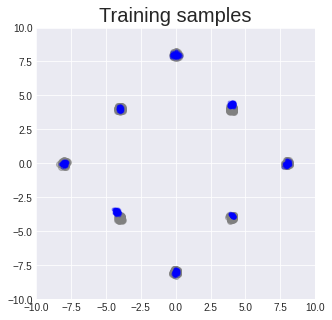

[[7.952610015869141, -0.013197951018810272], [-7.989374160766602, 0.1886347234249115], [0.11857790499925613, 8.05378532409668], [4.162660121917725, 4.296426296234131], [-4.065291881561279, 4.047223091125488], [0.09494948387145996, 7.982821464538574], [-8.023619651794434, -0.03429500386118889], [-4.3910441398620605, -3.3636200428009033], [0.026712976396083832, -8.06772232055664], [-0.22523042559623718, 7.998514652252197], [4.079025745391846, -3.871173620223999], [-4.056758880615234, 4.112809181213379], [-4.092930316925049, 4.047122478485107], [4.144908428192139, -3.9577157497406006], [4.136089324951172, 4.255807399749756], [3.996795892715454, -3.8000144958496094], [0.1674821674823761, -7.850696086883545], [4.106729030609131, 4.306647777557373], [-3.905162811279297, 4.00445032119751], [-3.8345208168029785, 3.9170234203338623], [-4.207004547119141, -3.5164682865142822], [-0.029367148876190186, -7.9239678382873535], [3.949918508529663, -3.775977849960327], [7.959688186645508, 0.04594867303

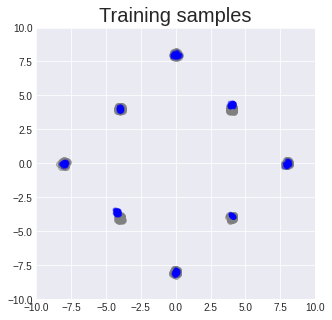

[[-4.0022077560424805, 3.9427642822265625], [3.9822607040405273, 4.285409450531006], [-7.987622261047363, -0.06703987717628479], [0.013668447732925415, 8.253912925720215], [-4.098391532897949, -3.5552079677581787], [7.834015846252441, -0.011227678507566452], [-0.19252407550811768, 7.9691243171691895], [-0.024059951305389404, -7.79505729675293], [4.0269856452941895, -3.922268867492676], [4.046413421630859, 4.335334300994873], [-7.8883256912231445, 0.038987793028354645], [-4.24965238571167, -3.556647300720215], [-0.04072462022304535, -8.1068115234375], [-4.312897205352783, -3.605097532272339], [-3.9404289722442627, 3.8582427501678467], [4.132645130157471, 4.312458038330078], [-4.019435882568359, 3.827397108078003], [-0.04614066332578659, 7.896903038024902], [-8.081439971923828, -0.02310572937130928], [-8.0419282913208, -0.041699040681123734], [-4.085261344909668, -3.5649781227111816], [-4.325048923492432, -3.5565266609191895], [-0.06526114046573639, 7.9626312255859375], [4.16186904907226

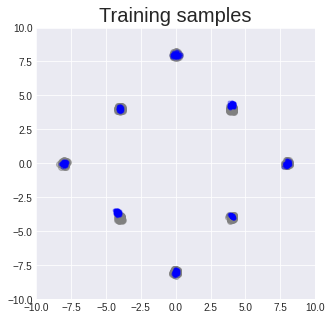

[[7.962089538574219, -0.219847172498703], [-7.962831020355225, -0.09129549562931061], [4.051939487457275, 4.394146919250488], [-0.04606644809246063, -8.158336639404297], [7.890261173248291, 0.05721113458275795], [0.03062896430492401, -8.077670097351074], [-0.22148223221302032, 7.998474597930908], [-4.024147033691406, -3.7734925746917725], [0.351833701133728, 8.044098854064941], [3.999983787536621, 4.34433650970459], [4.0985026359558105, -3.8707356452941895], [4.124282360076904, -3.8864784240722656], [4.067680358886719, -3.936220645904541], [-7.90100622177124, 0.05419916287064552], [-4.2054548263549805, -3.7916078567504883], [4.052420616149902, 4.218226909637451], [-4.2063517570495605, -3.7256062030792236], [-7.996938228607178, -0.07206308841705322], [7.975294589996338, -0.02578163519501686], [-4.335144996643066, -3.4178707599639893], [3.9823131561279297, 4.268668174743652], [0.21907536685466766, 7.865431785583496], [-0.15310858190059662, -7.9313859939575195], [3.8628509044647217, 4.310

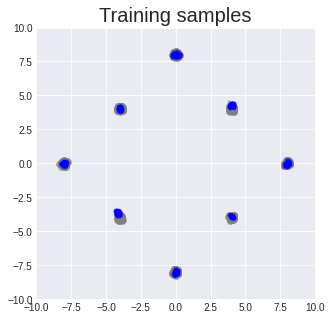

[[-8.046721458435059, 0.05800668150186539], [-3.9777684211730957, 4.1947832107543945], [-8.136157989501953, 0.0217023566365242], [-0.17796367406845093, 8.056503295898438], [-4.286838531494141, -3.490473508834839], [7.91318941116333, -0.12441223114728928], [8.167610168457031, -0.02963688224554062], [0.10547846555709839, 7.935424327850342], [-4.022876262664795, -3.671833038330078], [-0.09757083654403687, 7.877473831176758], [0.2616082429885864, 7.846289157867432], [-3.983483076095581, 3.8591818809509277], [4.171146869659424, 4.354385852813721], [-4.146939754486084, -3.719264507293701], [3.9808332920074463, 4.141420841217041], [7.886194229125977, -0.1154305562376976], [8.035346031188965, -0.015060048550367355], [-4.002082347869873, 4.008938312530518], [-0.01905917376279831, -7.904159069061279], [4.149973392486572, -4.008895397186279], [-0.021275535225868225, 7.897997856140137], [-4.311788558959961, -3.440246343612671], [4.099463939666748, 4.246220111846924], [-4.146113395690918, -3.688814

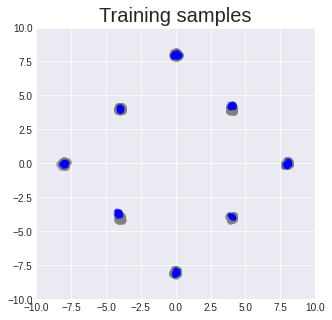

[[0.09800243377685547, -8.000446319580078], [-0.057465583086013794, 7.877912998199463], [-7.982439994812012, -0.06879602372646332], [-0.047363728284835815, 7.902882099151611], [-0.0818360298871994, -8.035183906555176], [8.054646492004395, 0.06593428552150726], [4.150537014007568, 4.126262187957764], [-0.22261112928390503, 8.070355415344238], [0.01043722778558731, 7.912942886352539], [0.015445984899997711, 7.9521284103393555], [-8.026634216308594, 0.030886054039001465], [3.9957921504974365, -3.9064834117889404], [0.0822639912366867, 8.116515159606934], [-0.09179377555847168, -8.006811141967773], [4.046545028686523, -3.943293571472168], [8.068623542785645, -0.18446464836597443], [-3.9511353969573975, 4.054246425628662], [0.09657082706689835, 7.907048225402832], [-4.12514066696167, 3.9904608726501465], [3.9868648052215576, -3.850813388824463], [-4.2527241706848145, -3.6350696086883545], [-3.954393148422241, -3.876173257827759], [-4.039787769317627, 4.049642086029053], [-7.969529628753662,

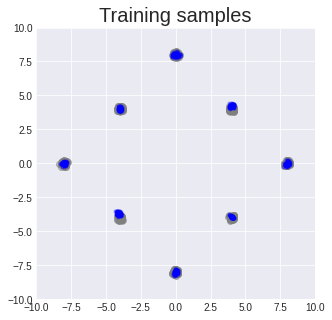

[[4.1077728271484375, -4.044296741485596], [-0.0741846114397049, -7.984164714813232], [-7.926596641540527, -0.031747929751873016], [-0.11910206079483032, 8.016214370727539], [7.9653754234313965, 0.04967903345823288], [0.351528525352478, 8.038873672485352], [0.0658288449048996, -7.9521565437316895], [3.986661911010742, -3.983717679977417], [4.133223056793213, 4.147961616516113], [8.11832332611084, 0.2329564392566681], [3.9785265922546387, -3.9554786682128906], [-4.108207702636719, -3.7312045097351074], [-4.177473545074463, -3.6389193534851074], [-8.013806343078613, -0.1298564374446869], [7.888463497161865, -0.11403553932905197], [-4.08851957321167, 4.142076015472412], [-0.009137935936450958, -7.966656684875488], [-4.095137119293213, -3.583430290222168], [-0.20808467268943787, 7.926243305206299], [-4.050913333892822, 4.039856910705566], [3.9812564849853516, 4.309067249298096], [8.118508338928223, -0.06942964345216751], [8.02200698852539, 0.133681058883667], [-7.96273946762085, -0.0955972

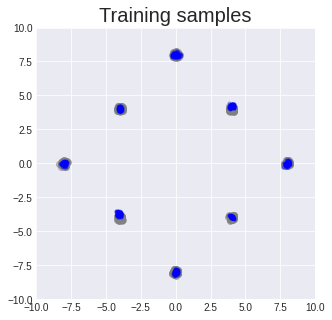

[[-0.05992718040943146, 8.037811279296875], [8.073875427246094, -0.014654405415058136], [7.969892501831055, 0.12792688608169556], [3.8046185970306396, 4.124914646148682], [-4.046444892883301, 4.05247163772583], [4.1020426750183105, -4.010868072509766], [-4.141568183898926, -3.804764747619629], [-4.044572830200195, 4.162692070007324], [4.132046699523926, 4.124880313873291], [8.027023315429688, -0.05926250293850899], [3.8432226181030273, 4.2019572257995605], [4.053658485412598, 4.174407482147217], [-3.9816997051239014, 3.9632132053375244], [4.022000789642334, 4.37954044342041], [-4.113588333129883, 4.212764739990234], [-3.91267466545105, -3.798358678817749], [8.030784606933594, 0.013482276350259781], [8.032438278198242, 0.08874334394931793], [4.10586404800415, -4.060415267944336], [3.984375238418579, -3.999885082244873], [-3.895857810974121, -3.939592123031616], [4.089942455291748, 4.138254165649414], [-8.02587604522705, -0.04236307367682457], [4.092009544372559, -4.0563883781433105], [-

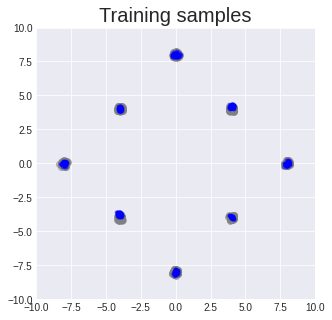

[[7.7943010330200195, 0.020856961607933044], [-8.080863952636719, -0.09541703760623932], [-0.06881938129663467, -8.036224365234375], [-4.161678314208984, 4.014819622039795], [-4.123164176940918, -3.6991875171661377], [-8.043983459472656, 0.05192924290895462], [-3.963235378265381, -3.8395962715148926], [-4.113432884216309, -3.6162102222442627], [-8.123262405395508, -0.013026092201471329], [-8.015159606933594, -0.1333540380001068], [-8.10626220703125, 0.08133634924888611], [3.8392386436462402, -3.8513481616973877], [-3.9662342071533203, 3.985280752182007], [-0.0396544486284256, -7.818796634674072], [8.06730842590332, 0.09386800229549408], [0.018664196133613586, 8.252636909484863], [-7.938723087310791, -0.24280373752117157], [-8.020877838134766, 0.023408692330121994], [8.05599594116211, -0.07901717722415924], [7.945346355438232, -0.016695428639650345], [4.078670501708984, -3.971135377883911], [0.3161966800689697, 7.981229782104492], [0.060650818049907684, 8.094551086425781], [0.0392700061

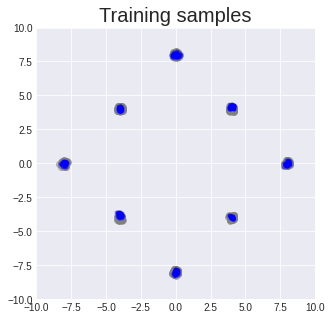

[[3.934570550918579, 4.069120407104492], [7.889715671539307, -0.1112440675497055], [-3.870903491973877, -3.93766450881958], [3.9140193462371826, 4.138625144958496], [-3.942211866378784, 3.9956140518188477], [4.149078369140625, 4.191598415374756], [8.097248077392578, -0.05552560091018677], [4.046300411224365, -4.064133167266846], [-0.1339867115020752, -8.008997917175293], [-4.085844039916992, -3.9456608295440674], [-0.012697070837020874, -8.032506942749023], [-8.069751739501953, 0.14637888967990875], [-8.074896812438965, 0.1331048160791397], [3.8989691734313965, 4.111862659454346], [-4.071458339691162, 4.047353267669678], [-7.860637664794922, -0.08709914982318878], [8.104275703430176, -0.03139055520296097], [4.03551721572876, -4.023139476776123], [0.025905996561050415, 8.020668029785156], [-8.075998306274414, 0.036611251533031464], [7.843019962310791, -0.05443241819739342], [-8.09874153137207, 0.09222358465194702], [7.960455894470215, -0.007013048976659775], [-0.22129635512828827, 8.000

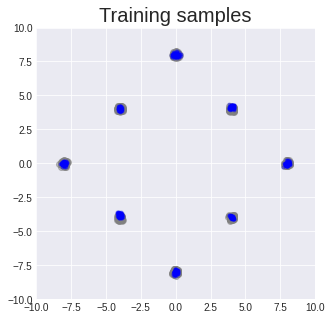

[[0.11843794584274292, -7.907954216003418], [-4.103240966796875, -3.871948003768921], [4.143791198730469, 4.153392314910889], [3.9820284843444824, 4.001755237579346], [0.018416307866573334, 8.249279975891113], [-8.039742469787598, -0.05970359593629837], [-8.036005973815918, 0.0378492996096611], [4.189826488494873, 4.1598100662231445], [-3.8838868141174316, -4.004660129547119], [4.074380397796631, 4.211191177368164], [-4.054680347442627, -4.061011791229248], [4.044058322906494, 4.021964073181152], [-3.8641858100891113, -3.941347599029541], [-4.055695056915283, 3.927001476287842], [-7.98440408706665, -0.07600247114896774], [-3.9705698490142822, 4.19352912902832], [3.9158318042755127, 4.2251081466674805], [-3.9048783779144287, 4.212945461273193], [-4.036105155944824, -3.8151602745056152], [-0.19757825136184692, 7.977094650268555], [-8.155303955078125, -0.09776924550533295], [4.034132957458496, 4.1343865394592285], [8.015778541564941, -0.025987427681684494], [-7.959766387939453, -0.0054620

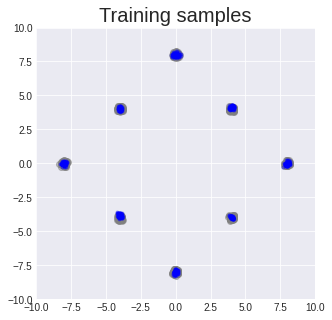

[[0.055951282382011414, 8.250617027282715], [-8.056863784790039, 0.02663155272603035], [8.000678062438965, 0.09995928406715393], [-7.959722518920898, -0.12394995987415314], [0.08288123458623886, 8.077406883239746], [8.065252304077148, 0.1275155246257782], [-4.039092063903809, -3.814924955368042], [4.068519592285156, -3.9250192642211914], [-0.12836171686649323, 8.024457931518555], [-0.09157924354076385, -8.112343788146973], [-0.06773214042186737, 7.85830545425415], [0.1662895232439041, -7.900213718414307], [-0.09602006524801254, -8.06061840057373], [-4.030876159667969, 3.9009411334991455], [-3.9808619022369385, 4.205580234527588], [4.103436470031738, -4.026477336883545], [8.120742797851562, -0.03887447342276573], [4.004019260406494, -3.924696922302246], [8.085159301757812, 0.10805362462997437], [-8.083014488220215, 0.0787908285856247], [0.018840700387954712, 8.030424118041992], [-0.07836812734603882, -7.806732654571533], [3.8487229347229004, -3.78163743019104], [4.120985984802246, -4.00

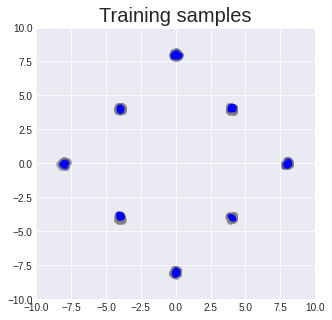

[[7.929718971252441, -0.06029152125120163], [-7.8472900390625, 0.03764427453279495], [-7.984498977661133, -0.13134393095970154], [-4.011190891265869, 4.081873893737793], [-8.00593376159668, -0.1339874416589737], [-4.054466247558594, 4.114682674407959], [4.02695369720459, 4.234692096710205], [-4.060340404510498, 3.962101459503174], [7.900552749633789, 0.039844099432229996], [-4.07523250579834, -3.710257053375244], [-0.06694842129945755, -7.833374500274658], [0.013379044830799103, -8.079848289489746], [8.178043365478516, -0.05162619426846504], [4.070757865905762, -4.0099029541015625], [-3.9968607425689697, -3.9334561824798584], [-0.036535002291202545, 7.908176898956299], [-0.21098187565803528, 7.9818115234375], [4.106082439422607, -3.9089744091033936], [-3.9760637283325195, 3.9898157119750977], [4.088081359863281, 4.198857307434082], [4.132807731628418, 4.009805679321289], [-3.9852211475372314, 4.155245780944824], [-4.032571792602539, 4.1630940437316895], [-3.9956696033477783, -4.0700812

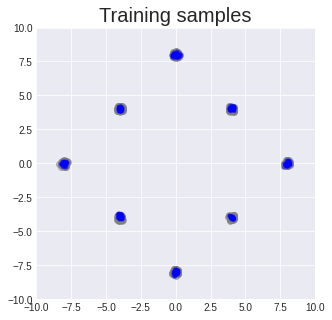

[[0.17732924222946167, -7.982558727264404], [3.9856221675872803, 4.195731163024902], [-4.025773048400879, -3.9089176654815674], [-0.11028310656547546, 7.91709566116333], [3.919049024581909, -3.929610252380371], [0.06199263036251068, -8.028531074523926], [-0.036587998270988464, 7.902307033538818], [4.079721927642822, 4.141179084777832], [7.9249067306518555, -0.17624983191490173], [4.102323532104492, -4.0355353355407715], [-0.1436830461025238, -8.014399528503418], [-0.056245483458042145, -7.997708320617676], [-7.978246688842773, 0.1558322012424469], [-0.09277870506048203, -8.031560897827148], [-3.9428036212921143, 4.055867671966553], [0.14169231057167053, -7.939624786376953], [4.112979412078857, -3.9468188285827637], [4.0707597732543945, 4.202284812927246], [7.925149917602539, 0.0591241791844368], [0.06661634892225266, 7.846961975097656], [4.101206302642822, -3.9786367416381836], [-0.043608926236629486, 7.894439697265625], [-8.050029754638672, -0.004128355532884598], [4.037963390350342, 

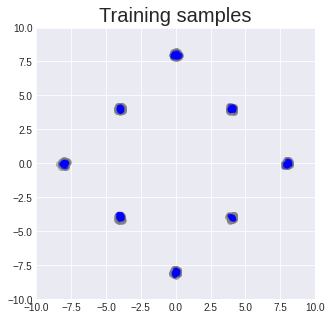

[[-8.027663230895996, 0.01656116172671318], [-3.994373083114624, -3.9839978218078613], [-8.1444730758667, -0.028679776936769485], [-8.09057331085205, -0.1031927615404129], [4.204714298248291, 4.040035724639893], [-0.13316679000854492, 7.95264196395874], [0.11643368005752563, -7.941013813018799], [-8.21861457824707, -0.043855197727680206], [-7.998441219329834, -0.0615355558693409], [-4.12934684753418, -3.937117338180542], [0.040391579270362854, -7.961680889129639], [-8.047646522521973, -0.07410837709903717], [-3.922550678253174, -3.707840919494629], [-4.0140461921691895, 3.942706823348999], [-4.024367332458496, -4.0824151039123535], [7.885217189788818, 0.2640158236026764], [-8.115448951721191, 0.07929424941539764], [0.038173191249370575, 8.117579460144043], [8.063223838806152, 0.12695710361003876], [3.8613710403442383, 4.041007041931152], [-0.08162220567464828, -7.766510486602783], [3.996044397354126, -3.931290626525879], [-0.04965133219957352, -8.116394996643066], [-3.9290435314178467,

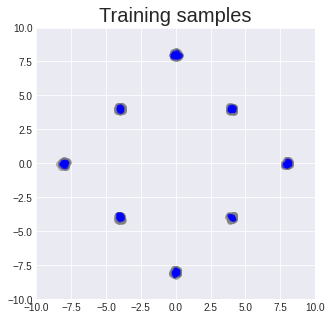

[[4.046553611755371, -3.9809510707855225], [-7.9182257652282715, 0.05837443098425865], [-3.990849018096924, -3.810978889465332], [-8.222929000854492, -0.03574458137154579], [8.032114028930664, -0.11996287107467651], [7.88038969039917, 0.2553628981113434], [-8.002998352050781, -0.1463915854692459], [-3.9646499156951904, 3.8784449100494385], [7.992336273193359, -0.021192234009504318], [4.0200653076171875, -4.013386249542236], [-3.8548784255981445, 4.009077072143555], [7.941242218017578, -0.018320243805646896], [4.019362926483154, -3.980050802230835], [-8.137068748474121, -0.01126185804605484], [3.8429958820343018, 3.9870998859405518], [8.159074783325195, 0.1493932604789734], [-3.958972215652466, -4.026191234588623], [-0.11291728913784027, 7.951563835144043], [4.189571857452393, 4.04218864440918], [-4.161935329437256, -3.7166945934295654], [-4.050564765930176, 3.9284894466400146], [-4.009554386138916, 4.03579568862915], [-7.900180816650391, -0.10765548795461655], [-3.905705451965332, -4.0

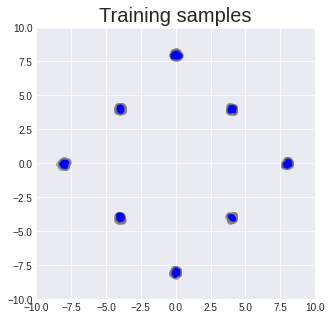

[[-8.05124282836914, -0.07090472429990768], [-8.038475036621094, -0.03622546046972275], [3.8561246395111084, 4.029144287109375], [-3.9722328186035156, 3.960808753967285], [4.150601387023926, 4.040075778961182], [-8.00958251953125, -0.07903115451335907], [-8.047691345214844, -0.004589870572090149], [3.9436755180358887, -3.9606540203094482], [0.24515385925769806, 7.883671760559082], [4.052770137786865, -4.035221576690674], [-4.064090251922607, -4.113330841064453], [-4.045796871185303, -3.7504777908325195], [-0.1965893805027008, 8.04212474822998], [-4.028347969055176, -3.948596715927124], [-7.96920108795166, 0.04669438302516937], [8.036456108093262, -0.013460204005241394], [-7.9017205238342285, -0.10962875932455063], [3.9426217079162598, 3.889204263687134], [3.9800639152526855, 4.142177104949951], [-4.132378578186035, -3.8533132076263428], [3.8452985286712646, -3.800565481185913], [-3.9088516235351562, -3.872028350830078], [-3.9257595539093018, -4.065608501434326], [-3.8458054065704346, -

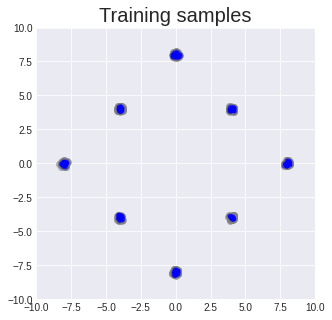

[[-4.029773235321045, -3.9651894569396973], [-3.9072935581207275, 3.9820032119750977], [-4.1634745597839355, -3.7572100162506104], [-0.05316060036420822, -7.979276180267334], [0.12543687224388123, -7.901757717132568], [-0.13104458153247833, 8.001211166381836], [0.08721761405467987, 7.883747577667236], [-0.1915721446275711, 7.988038539886475], [4.043489456176758, 4.100857257843018], [8.018624305725098, 0.146791473031044], [-0.20631778240203857, 7.9642863273620605], [-7.913211822509766, 0.05052835866808891], [4.086770057678223, 4.147697925567627], [7.932677268981934, 0.049085572361946106], [7.929012298583984, 0.0043418556451797485], [-4.01436185836792, 4.068234920501709], [-3.859201431274414, -4.083974361419678], [-3.8957595825195312, -3.906604051589966], [-7.793113708496094, 0.04873090237379074], [4.041574478149414, -3.9961674213409424], [4.0499067306518555, 4.1551384925842285], [4.1071085929870605, -4.000790119171143], [-3.9761064052581787, 4.013184070587158], [3.977203369140625, 4.056

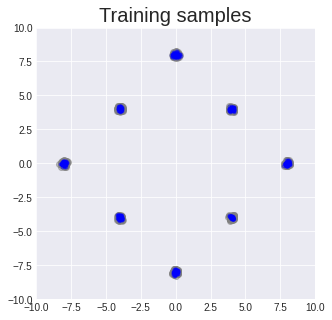

[[7.8901238441467285, 0.26603004336357117], [-0.08895349502563477, 7.887089729309082], [-4.1259284019470215, -4.061295032501221], [-3.9293181896209717, -3.9446158409118652], [7.912163734436035, -0.025581207126379013], [7.861656188964844, -0.0728253722190857], [8.078988075256348, -0.1544663906097412], [0.13627612590789795, -7.8265767097473145], [7.963798999786377, 0.004873897880315781], [0.08543688803911209, 7.760744571685791], [8.109391212463379, 0.11679358780384064], [4.13810396194458, -4.055895805358887], [4.0392913818359375, 4.086747169494629], [4.169482707977295, 4.131783485412598], [0.11172835528850555, 7.933459758758545], [-3.9302735328674316, 4.031610488891602], [8.108673095703125, 0.0970713198184967], [8.21163558959961, -0.0880371630191803], [-0.01153157651424408, -7.757848739624023], [7.927603244781494, -0.16439060866832733], [-0.11322907358407974, -8.002717971801758], [-7.995442867279053, 0.19336338341236115], [0.12748226523399353, -8.058693885803223], [-4.009991645812988, -4

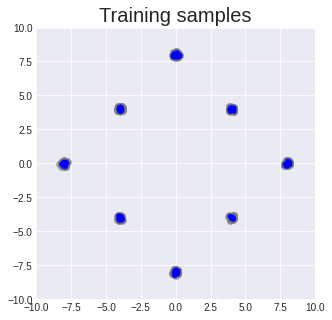

[[-3.8917057514190674, -3.9380955696105957], [3.969090461730957, 3.9473910331726074], [7.783438205718994, -0.06944294273853302], [4.085528373718262, 4.081259727478027], [-8.0739107131958, 0.0062689632177352905], [-3.907564163208008, 3.964668035507202], [4.038819313049316, -3.98221755027771], [-3.9398210048675537, 4.0554890632629395], [0.02968721091747284, 8.017343521118164], [-4.070347309112549, -4.032442569732666], [-4.082555770874023, -4.069509029388428], [-7.8497443199157715, 0.043707285076379776], [7.844708442687988, -0.046939801424741745], [0.06145038455724716, 8.096282958984375], [0.3857176601886749, 7.895106315612793], [7.871514797210693, -0.08998523652553558], [-3.9209256172180176, 4.132758617401123], [-4.035436153411865, -4.171467304229736], [7.925185203552246, 0.06420436501502991], [-8.050625801086426, 0.0005385391414165497], [-3.9136946201324463, -4.173563003540039], [-4.011234760284424, -3.8726069927215576], [-3.958789825439453, 3.861522912979126], [-0.22884193062782288, 8.

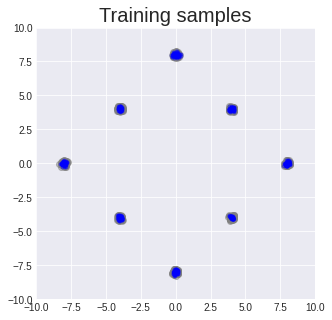

[[4.039093494415283, 4.097090721130371], [-7.988864898681641, -8.787587285041809e-05], [0.06319351494312286, 8.244512557983398], [4.035629749298096, -4.046012878417969], [-4.029239654541016, 4.054981708526611], [7.850986480712891, -0.022197779268026352], [-7.850950717926025, 0.1538170874118805], [0.02279709279537201, -8.114328384399414], [-0.07328391820192337, -8.005659103393555], [3.991398811340332, 4.05361270904541], [0.18600690364837646, -7.982758522033691], [0.023007310926914215, 8.028363227844238], [3.997331142425537, -3.963020086288452], [4.157019138336182, 3.9584295749664307], [-3.9925103187561035, 4.001868724822998], [-0.060330964624881744, -8.134864807128906], [-0.11865110695362091, -8.003937721252441], [-3.8905844688415527, -3.966059923171997], [-0.0789480060338974, -8.072541236877441], [3.9888157844543457, 4.0616607666015625], [-7.9623823165893555, -0.1232777088880539], [-7.962175369262695, 0.023646075278520584], [8.021417617797852, 0.15273262560367584], [-8.145570755004883,

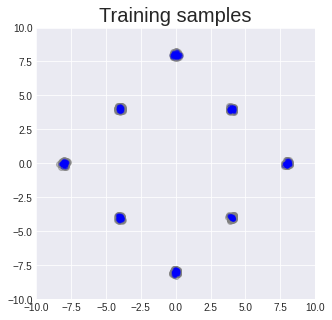

[[3.963850736618042, 3.9490771293640137], [4.083852291107178, -4.036105155944824], [-3.978771448135376, 3.856180191040039], [-3.929297685623169, 3.9715542793273926], [3.987698554992676, 3.90293288230896], [7.904852390289307, -0.0007850825786590576], [-3.993525505065918, 3.9930579662323], [0.11716367304325104, 8.11347484588623], [-7.9050445556640625, 0.13237793743610382], [-3.9939615726470947, -3.968331813812256], [4.043281555175781, -3.9694390296936035], [0.15604034066200256, -7.93691349029541], [-0.04530995339155197, -8.074807167053223], [-8.048952102661133, 0.05675634741783142], [-4.008526802062988, 4.050875663757324], [3.908419370651245, 4.001724720001221], [3.988646984100342, 3.9035587310791016], [-8.026378631591797, 0.02859693020582199], [-8.050628662109375, -0.06990671902894974], [-4.028322696685791, 4.004983901977539], [-3.907952070236206, 3.9733123779296875], [-4.083897590637207, 4.1402788162231445], [3.942525625228882, 3.8910460472106934], [3.9463508129119873, 3.90729475021362

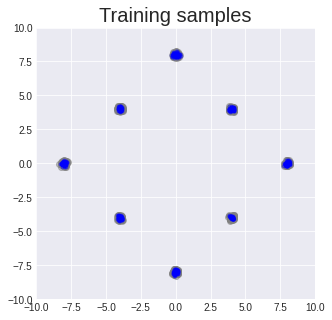

[[7.796370506286621, 0.028290078043937683], [-4.017812252044678, 3.827850818634033], [-0.08838623017072678, 7.95680570602417], [0.15460988879203796, 7.982177257537842], [3.834137439727783, -3.8807694911956787], [-7.966141223907471, 0.046976637095212936], [-4.030836582183838, 4.043583393096924], [-8.144447326660156, -0.0013107247650623322], [8.085260391235352, 0.1089375764131546], [3.9422130584716797, -3.9076614379882812], [-0.046443551778793335, -8.0689697265625], [4.18488883972168, 3.954759359359741], [-4.0537109375, 3.92557430267334], [3.9702024459838867, -3.9304921627044678], [-4.006026744842529, 4.0544753074646], [-8.03823471069336, -0.023303810507059097], [7.840422630310059, 0.0040506646037101746], [4.1518425941467285, 4.11478853225708], [-4.016343593597412, 4.054724216461182], [-0.04085438698530197, -8.119415283203125], [-8.050458908081055, -0.08504026383161545], [-0.0461321696639061, -7.914016246795654], [3.9111385345458984, 3.80815052986145], [4.107748508453369, 3.9859642982482

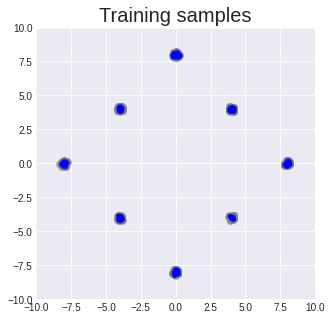

[[-4.105965614318848, 4.213696479797363], [4.0511016845703125, 4.158874988555908], [3.9823760986328125, 4.025447368621826], [0.17723515629768372, 7.851653099060059], [-3.9064533710479736, 3.9735872745513916], [3.9539430141448975, -3.954599618911743], [-3.959850549697876, 3.982863187789917], [-0.08508516848087311, -8.022916793823242], [-4.013267993927002, -3.9971776008605957], [4.01982307434082, -4.010117530822754], [-8.10958194732666, -0.042171355336904526], [-3.8855366706848145, -4.02274227142334], [3.870619297027588, 3.8587448596954346], [0.3462497293949127, 8.03137493133545], [3.9928336143493652, 4.056912899017334], [4.043745517730713, -3.986738681793213], [8.106510162353516, 0.11816485226154327], [0.02053385227918625, -7.903762340545654], [4.136476039886475, -4.059906005859375], [-3.9387402534484863, -3.8572399616241455], [7.723780155181885, -0.2116914689540863], [4.054152011871338, 3.9723386764526367], [0.08734575659036636, 7.767905235290527], [4.1409783363342285, 4.07631301879882

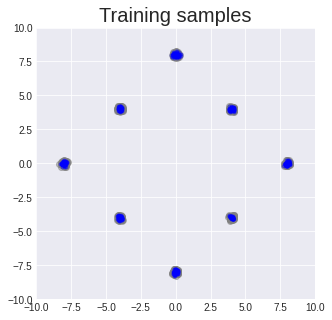

[[-4.080310821533203, -4.062074184417725], [-0.12812158465385437, -8.262481689453125], [3.835360527038574, 4.013147830963135], [-3.8623580932617188, -4.146215438842773], [-4.109992027282715, -4.0099616050720215], [-8.054332733154297, -0.05378345400094986], [-0.08705579489469528, 7.888211250305176], [3.97184419631958, 4.203707695007324], [-4.092293739318848, 4.044656753540039], [7.726776599884033, -0.2182043492794037], [-8.032593727111816, -0.03263581171631813], [-4.017470836639404, 3.9402925968170166], [7.858424663543701, -0.04964283108711243], [-8.069830894470215, 0.00883251428604126], [4.116668224334717, -3.9788904190063477], [-3.986316442489624, 4.018517971038818], [-7.97576904296875, -0.1068897396326065], [-8.134526252746582, -0.00356171652674675], [0.09610389173030853, -8.002096176147461], [-7.84605073928833, 0.04608892276883125], [-8.143009185791016, -0.004003055393695831], [8.108348846435547, -0.023053325712680817], [0.20450374484062195, 8.1751708984375], [-4.113762378692627, 4.

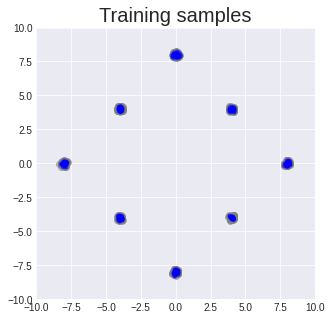

[[-0.19506309926509857, 8.052988052368164], [-3.913477897644043, -3.9532012939453125], [-7.8110857009887695, 0.0796533152461052], [-3.901401996612549, -3.9620494842529297], [3.941474199295044, 4.048752784729004], [8.177908897399902, -0.05890810489654541], [8.09923267364502, 0.06787525117397308], [-4.012043476104736, 3.9572529792785645], [4.0173492431640625, 3.9394094944000244], [-3.9075498580932617, 4.137012004852295], [4.038825035095215, -4.0755791664123535], [0.036618225276470184, 7.942587375640869], [-0.01993187516927719, -8.042016983032227], [0.05549236387014389, 8.042781829833984], [-4.1144490242004395, 3.985166072845459], [4.022594451904297, 4.145198822021484], [3.9440736770629883, -3.8968355655670166], [3.8452446460723877, 4.035951137542725], [0.06779719144105911, 7.894253730773926], [-4.024515628814697, -3.8818018436431885], [4.019668102264404, 3.9459357261657715], [0.08572205156087875, -7.955276966094971], [-3.9491689205169678, 4.177299499511719], [-7.899811267852783, 0.050928

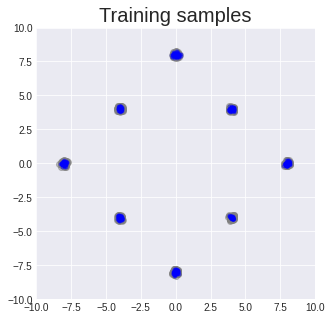

[[-4.141637325286865, -4.03334903717041], [-4.030081748962402, -4.031179904937744], [-3.9246463775634766, 3.9717283248901367], [3.92706298828125, 3.9060702323913574], [-8.057674407958984, -0.04056115821003914], [4.014357089996338, -4.002707004547119], [-8.072081565856934, -0.03365780785679817], [-4.027734279632568, 3.8773703575134277], [-0.049009114503860474, -7.915168285369873], [4.036416530609131, 4.088027000427246], [-7.990071773529053, 0.04888172820210457], [3.9483885765075684, 3.9008066654205322], [-4.024521350860596, 4.005859851837158], [4.105998992919922, 4.062737941741943], [-3.903923273086548, 3.974026918411255], [7.901804447174072, -0.004547551274299622], [-3.9218571186065674, -4.0861029624938965], [0.015924036502838135, -8.01014518737793], [-8.058525085449219, 0.03683256357908249], [7.923618316650391, -0.18386176228523254], [0.07633786648511887, -8.000614166259766], [-0.09642640501260757, 7.964277267456055], [7.992702484130859, -0.02968207374215126], [0.18565797805786133, 7.

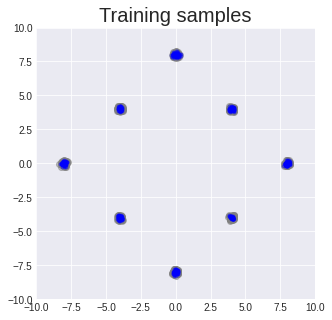

In [63]:
Energy = FFFNet(in_chan = 2, out_chan = 2)
opt = Adam(Energy.parameters(), lr=1e-5)
#scheduler = torch.optim.lr_scheduler.StepLR(opt, step_size=10, gamma=0.2)

f_loss = nn.L1Loss()

train_dl = DataLoader(TensorDataset(X_train), batch_size=4, shuffle=True, num_workers=0)

for epoch in range(100):
  points=[]
  l_loss = []
  j=0
  for i, in train_dl:
    pos_x = i
    neg_x = torch.randn_like(pos_x)
    #neg_x = sample_langevin_new(neg_x, Energy, 0.3, 100, intermediate_samples=False)
    

    opt.zero_grad()

    pos_out = Energy(pos_x.cpu())

    loss = f_loss(pos_out,pos_x)
    #loss = loss.mean()
    
    loss.backward()

    
    opt.step()

    l_loss.append(loss.item())
    point = pos_out.detach().numpy()
    for k in range(len(point)):
      points.append(point[k].tolist())
  print(points)
  print(np.mean(l_loss))
  print(epoch)

  points=np.array(points)
  xmin = -10
  xmax = 10
  ymin = -10
  ymax = 10
  plt.style.use('seaborn-darkgrid') 
  plt.figure(figsize=(5, 5))


  plt.xlim(xmin, xmax)
  plt.ylim(ymin, ymax)
  plt.title("Training samples", fontsize=20)
  plt.scatter(X_train[:,:1], X_train[:,1:], alpha=0.5, color='gray', marker='o')
  plt.scatter(points[:,:1], points[:,1:], alpha=0.3, color='blue', marker='.')
  plt.show()

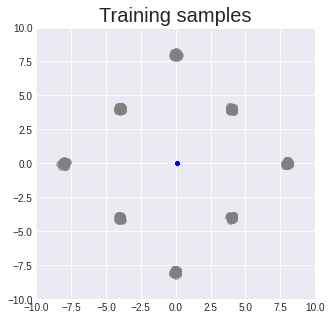

In [88]:
Energy.eval()
points_all = []
train_all = DataLoader(TensorDataset(X_train), batch_size=1000, shuffle=True, num_workers=0)
for i, in train_all:
  pos_out = Energy(i.cpu())

  point = pos_out.detach().numpy()
  for k in range(len(point)):
    points_all.append(point[k].tolist())

points_all=np.array(points_all)
xmin = -10
xmax = 10
ymin = -10
ymax = 10
plt.style.use('seaborn-darkgrid') 
plt.figure(figsize=(5, 5))


plt.xlim(xmin, xmax)
plt.ylim(ymin, ymax)
plt.title("Training samples", fontsize=20)
plt.scatter(X_train[:,:1], X_train[:,1:], alpha=0.5, color='gray', marker='o')
plt.scatter(points_all[:,:1], points_all[:,1:], alpha=0.3, color='blue', marker='.')
plt.show()



In [77]:
points_all

array([[-0.18516392, -0.08722962],
       [-0.18372346, -0.08777148],
       [-0.17366539, -0.09789221],
       ...,
       [-0.15693858, -0.08924569],
       [-0.18442228, -0.08830621],
       [-0.14092612, -0.08051877]])

Train with Langevin.

The problem now is that Langevin does not sample from the area with high probability. Although from the value of lose, it is successful. But from the scatters graph, the effect is not well.

0.15138940631397188
0


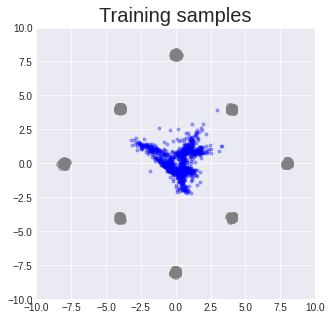

0.05559432308470446
1


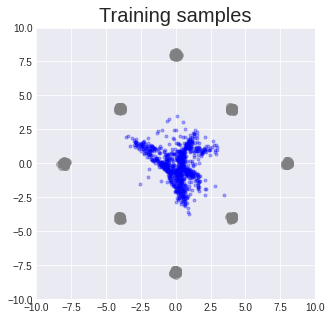

0.021903685737578643
2


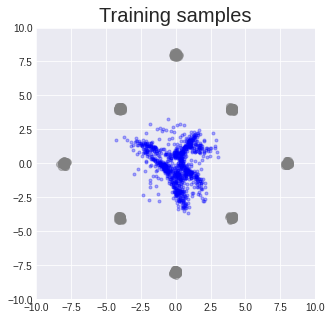

0.013576036311745171
3


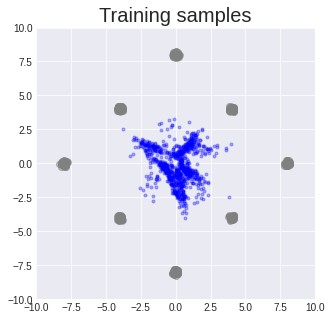

0.009748244525066443
4


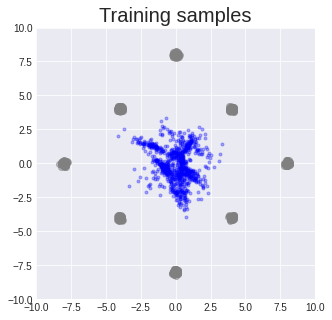

0.007783441530865809
5


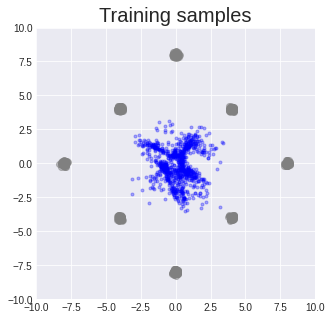

0.007132830556541208
6


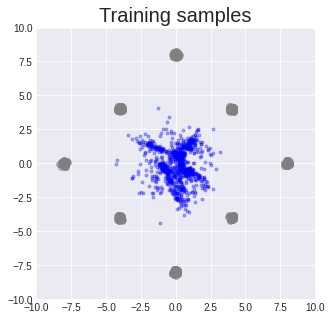

0.006221923869960602
7


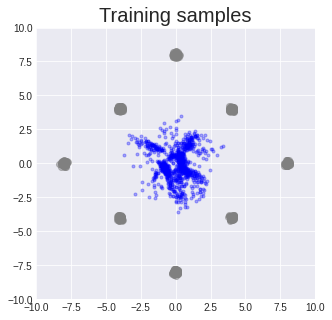

0.006206007504333106
8


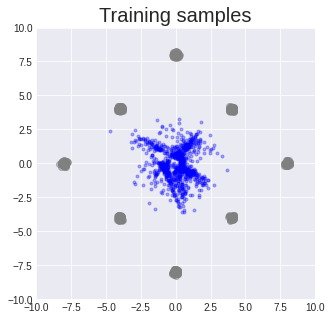

0.005556367592708696
9


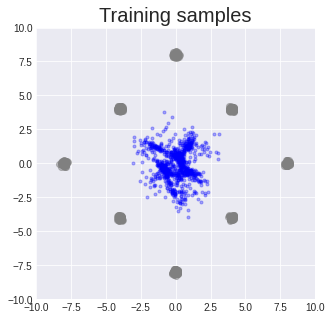

0.005723427474823972
10


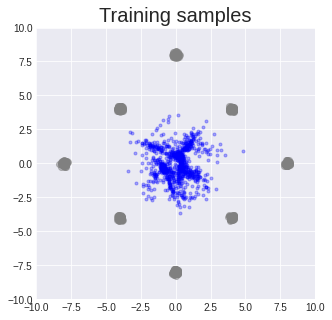

0.005162124603336293
11


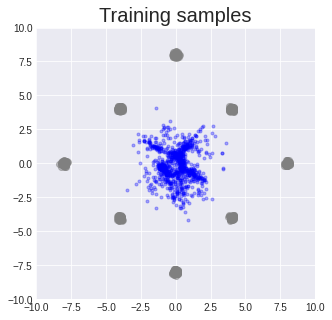

0.0048971097724186995
12


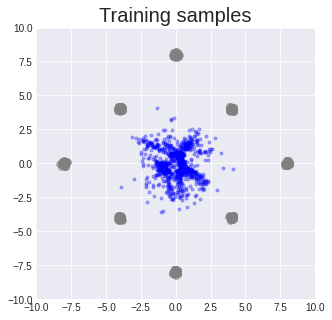

0.004925098029955748
13


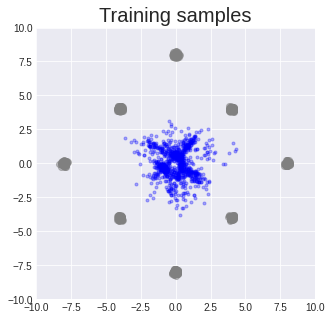

0.0046392033497492475
14


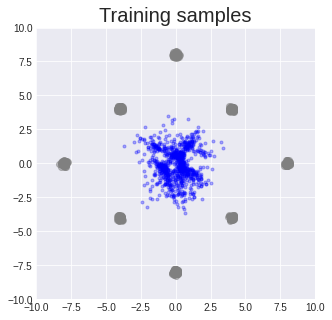

0.004392005048603529
15


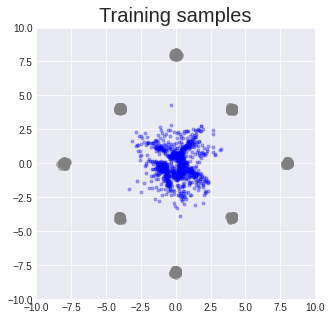

0.004376367614087131
16


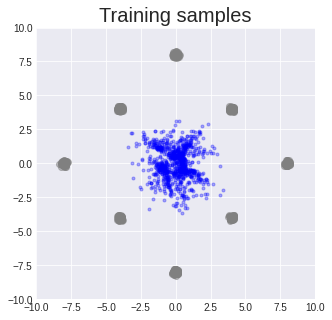

0.004192424546335898
17


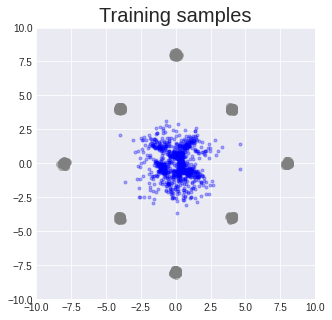

0.003941559321468785
18


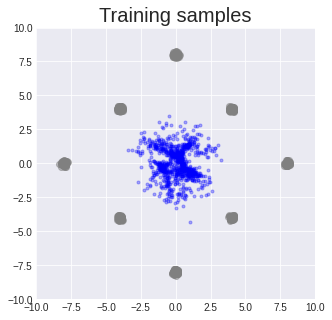

0.003877665540794768
19


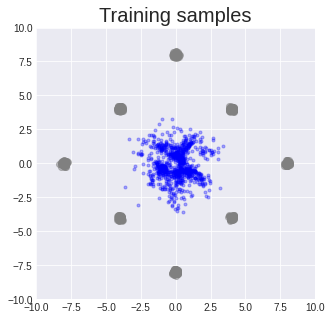

0.0038731561397157962
20


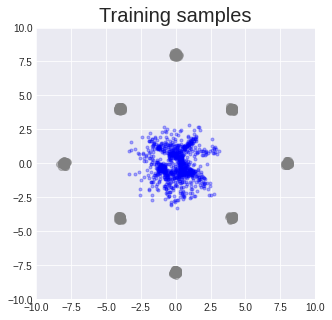

0.003795547950421534
21


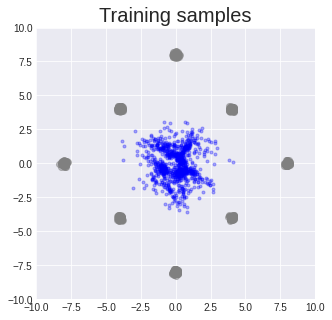

0.0035160951988978516
22


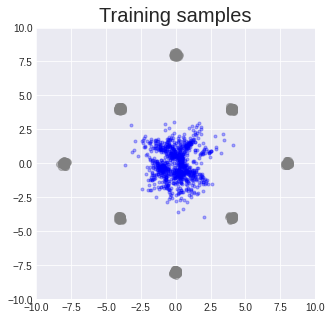

0.003640711625357942
23


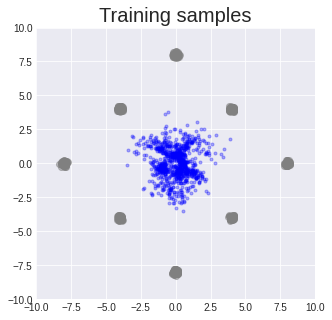

0.003544292937491148
24


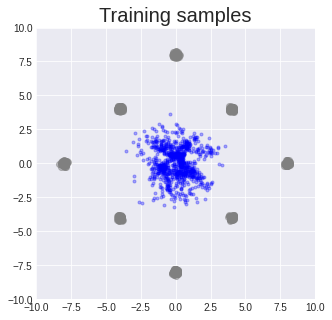

0.003569918947057828
25


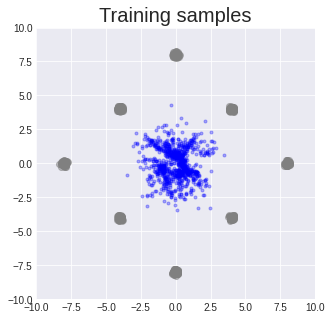

0.0034823583638561623
26


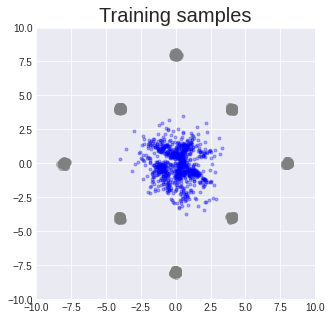

0.003167932727448051
27


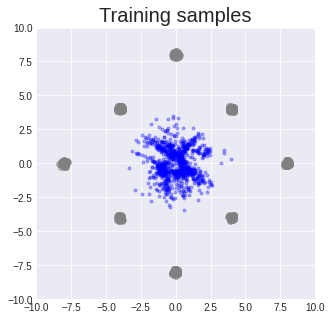

0.0032419003767981415
28


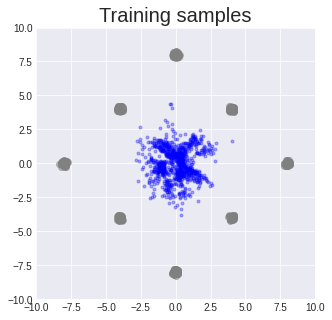

0.003347250529461437
29


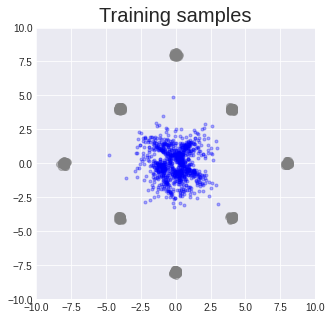

0.003136758278641436
30


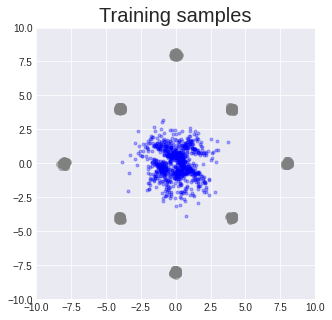

0.003026733659059992
31


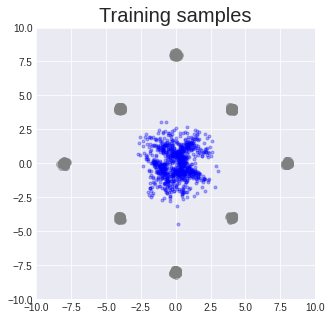

0.003051973293564977
32


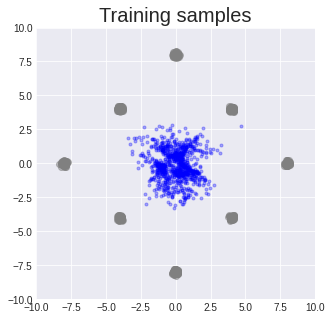

0.0031402130012533496
33


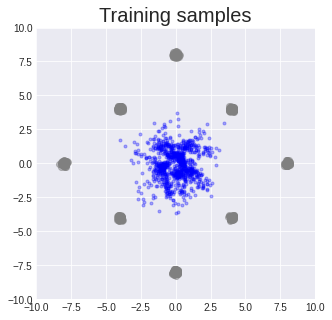

0.003022371595429759
34


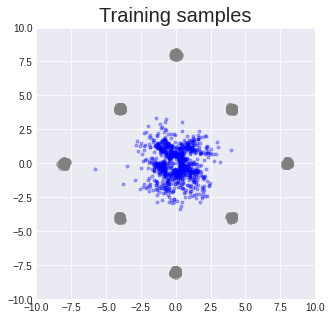

0.0029297058714465017
35


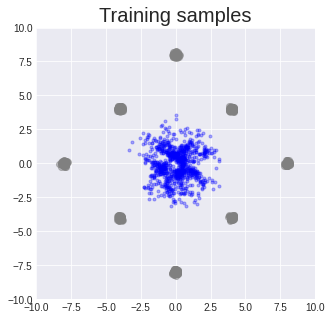

0.003004911311325573
36


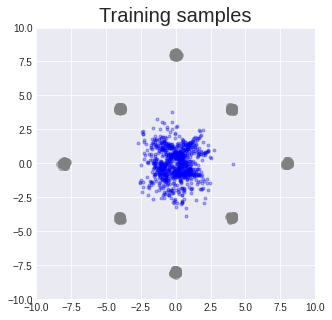

0.0028882239786316715
37


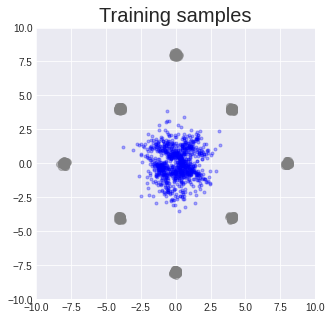

0.003023349744681683
38


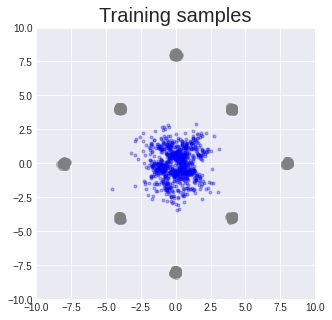

0.00318102166056633
39


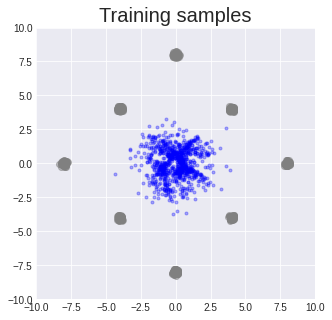

0.0029694715806741325
40


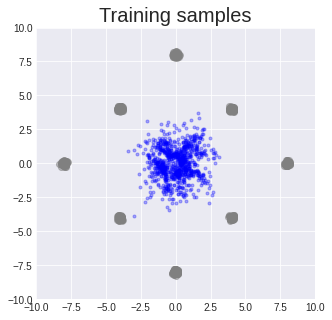

0.0029824740172082944
41


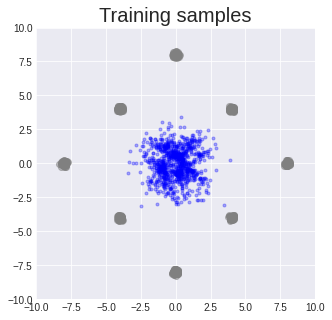

0.0027548473879014925
42


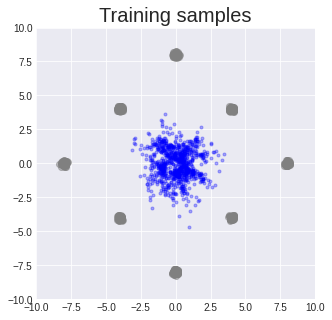

0.002736965417935853
43


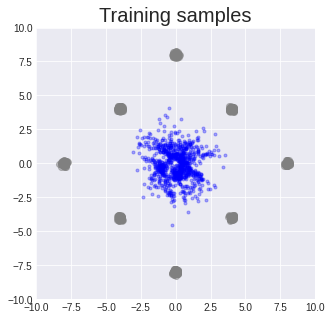

0.002907241301034533
44


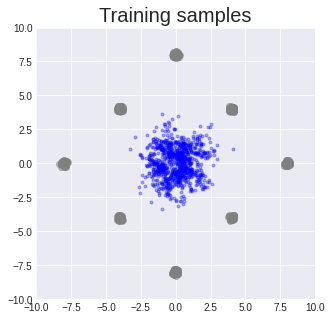

0.002750435141876103
45


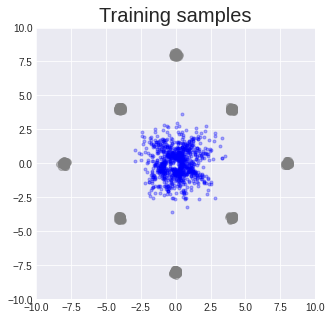

0.0026900116539013293
46


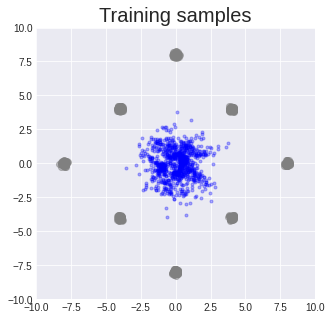

0.002608800403005074
47


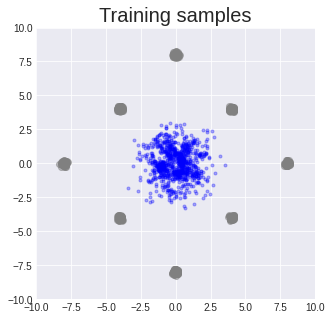

0.0026720098352857997
48


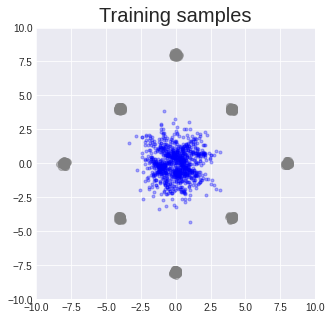

0.002660901658976125
49


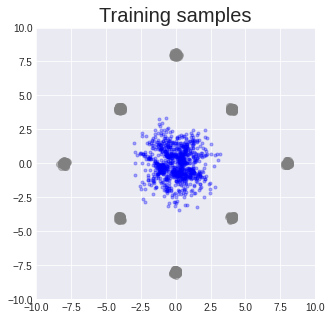

0.002646197775556218
50


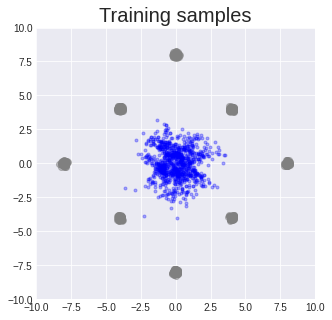

0.0025144493381034526
51


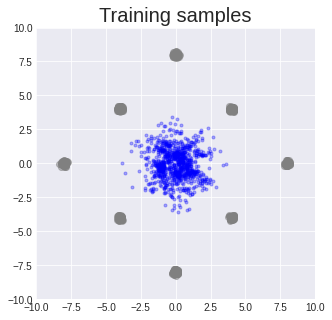

0.002857075763925437
52


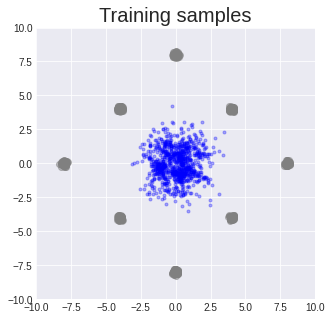

0.0028258635115528865
53


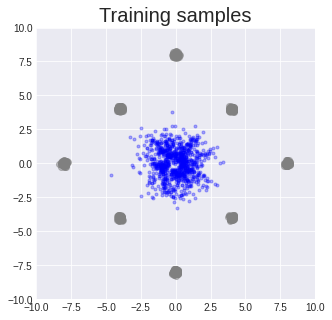

0.0028054826552905733
54


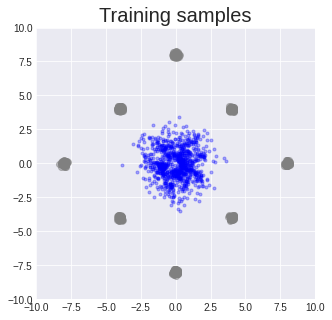

0.0024727664662465925
55


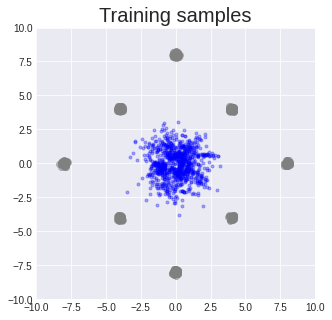

KeyboardInterrupt: ignored

In [87]:
Energy = FFFNet(in_chan = 2, out_chan = 2)
opt = Adam(Energy.parameters(), lr=1e-4)
#scheduler = torch.optim.lr_scheduler.StepLR(opt, step_size=10, gamma=0.2)

f_loss = nn.L1Loss()

train_dl = DataLoader(TensorDataset(X_train), batch_size=16, shuffle=True, num_workers=0)

for epoch in range(100):
  points=[]
  l_loss = []
  j=0
  for i, in train_dl:
    pos_x = i
    neg_x = torch.randn_like(pos_x)
    neg_x = sample_langevin(neg_x, Energy, 0.2, 100, intermediate_samples=False)
    point = neg_x.cpu().numpy()
    for k in range(len(point)):
      points.append(point[k].tolist())

    opt.zero_grad()

    pos_out = Energy(pos_x.cpu())
    neg_out = Energy(neg_x.cpu())

    loss = f_loss(pos_out,neg_out)
    #loss = loss.mean()
    
    loss.backward()

    torch.nn.utils.clip_grad_norm_(Energy.parameters(), max_norm=0.1)
    opt.step()

    l_loss.append(loss.item())

  print(np.mean(l_loss))
  print(epoch)

  points=np.array(points)
  xmin = -10
  xmax = 10
  ymin = -10
  ymax = 10
  plt.style.use('seaborn-darkgrid') 
  plt.figure(figsize=(5, 5))


  plt.xlim(xmin, xmax)
  plt.ylim(ymin, ymax)
  plt.title("Training samples", fontsize=20)
  plt.scatter(X_train[:,:1], X_train[:,1:], alpha=0.5, color='gray', marker='o')
  plt.scatter(points[:,:1], points[:,1:], alpha=0.3, color='blue', marker='.')
  plt.show()


0.014134327217936516
0


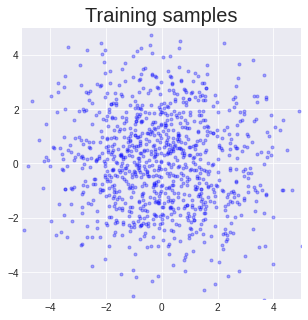

0.006810267133638263
1


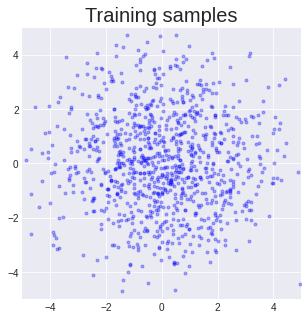

0.006407835824415088
2


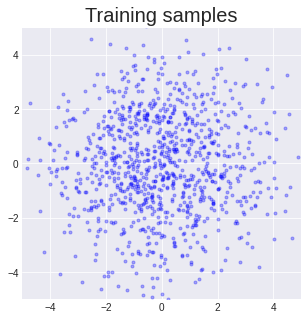

0.005448778985999525
3


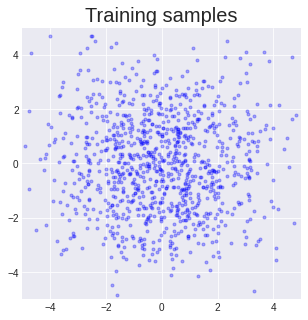

0.004963302934542299
4


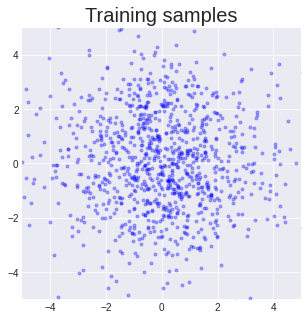

0.004351679890416562
5


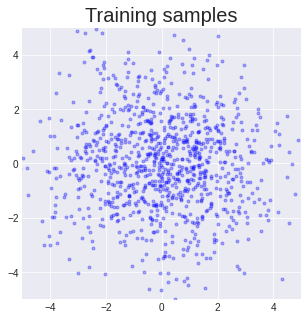

0.0039897274291142825
6


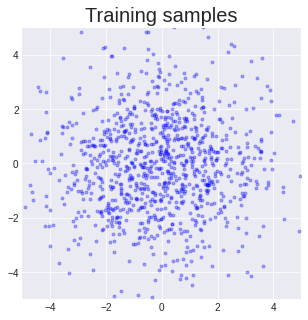

0.004672541279345751
7


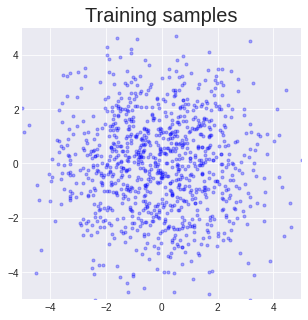

0.0035169296339154243
8


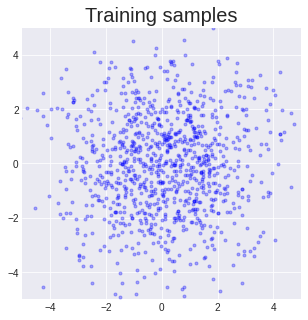

0.00291050635650754
9


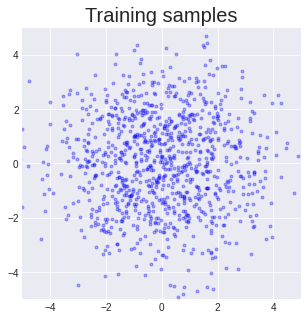

0.0027201958633959293
10


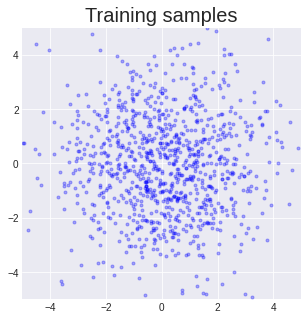

0.0031819727225229143
11


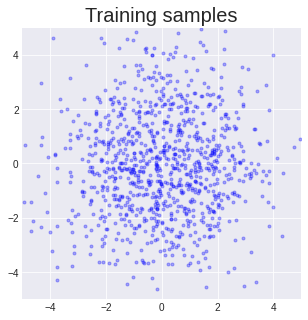

0.002735971162561327
12


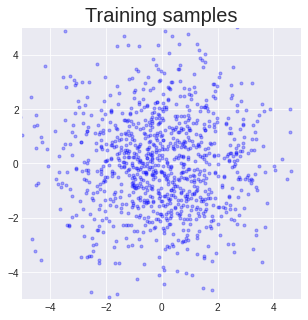

0.002326987927313894
13


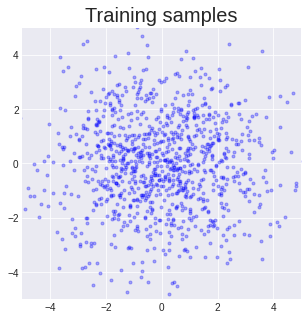

0.0018471733159385621
14


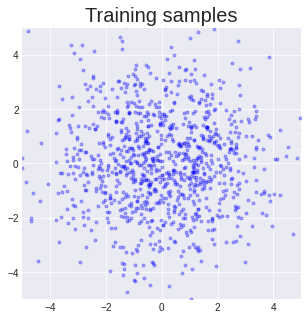

0.0020755444988608362
15


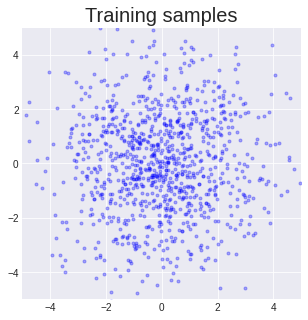

0.001984796690288931
16


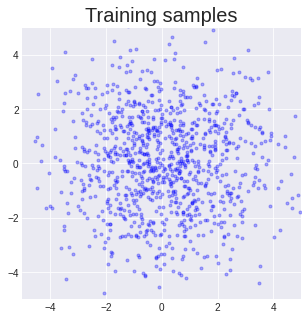

0.0014225230566225946
17


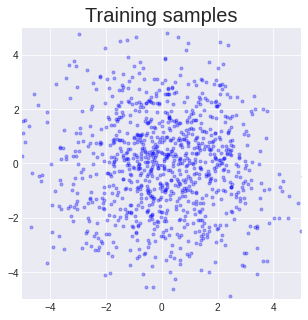

0.0010633641094900668
18


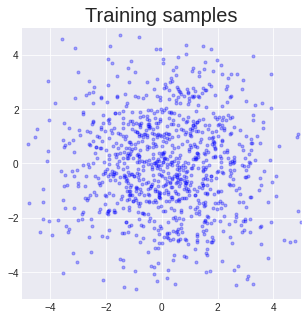

0.0009741346323862671
19


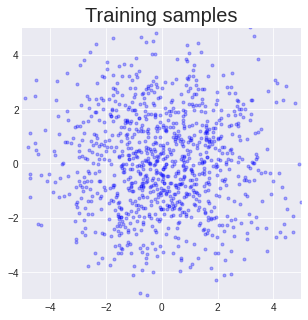

0.0009055224917829036
20


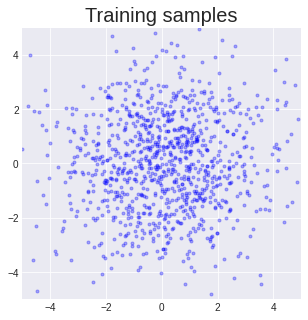

0.0008901800187304616
21


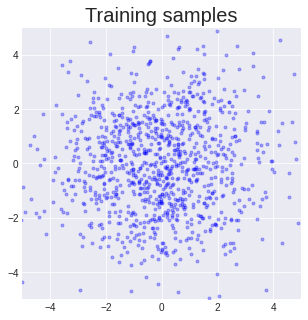

0.000677247239742428
22


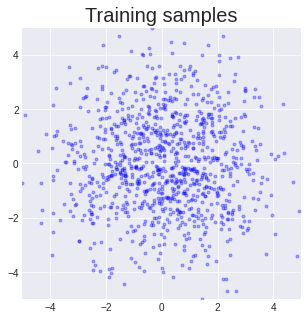

0.0006292514624074102
23


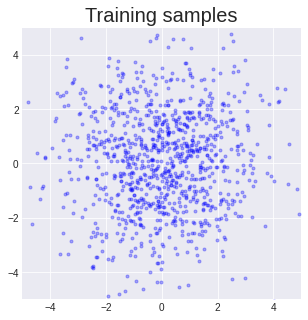

0.00048612259421497585
24


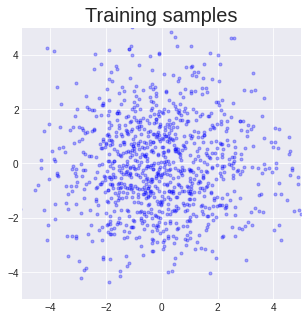

0.00043291895650327206
25


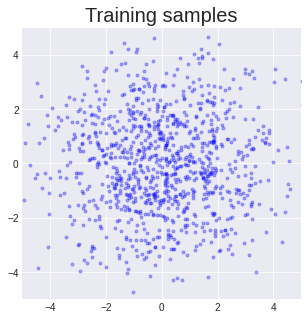

0.0002753657838329673
26


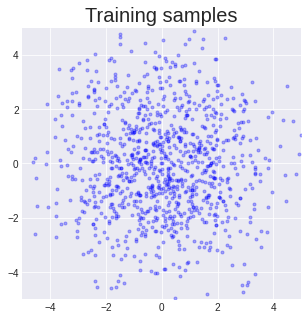

0.00021452492661774158
27


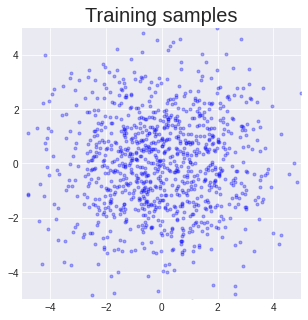

0.00017561205849051474
28


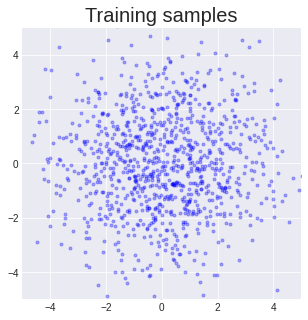

0.0001559519683942199
29


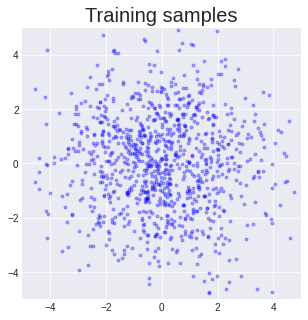

0.00013386695925146343
30


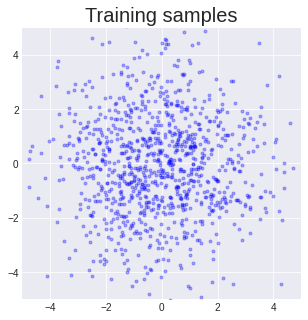

7.84342447295785e-05
31


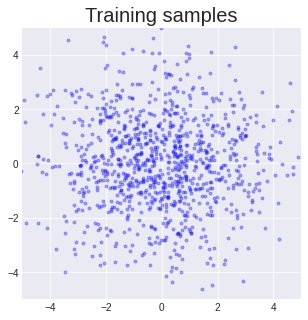

4.690707381814718e-05
32


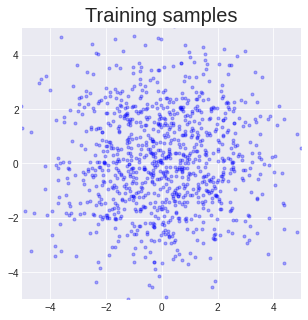

2.6328446343541147e-05
33


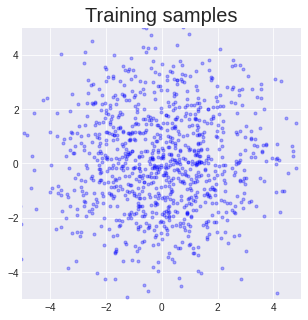

1.9673747941851617e-05
34


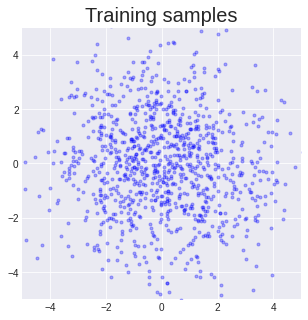

7.427020929753781e-06
35


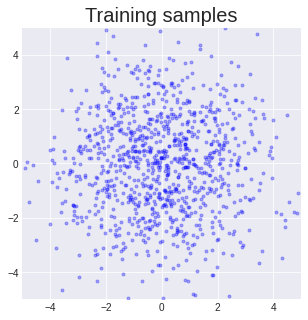

3.5740043967962265e-06
36


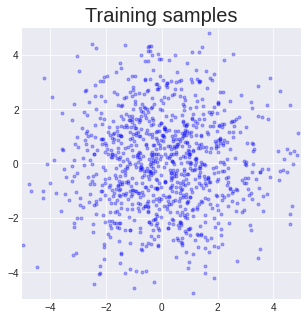

2.955683507025242e-06
37


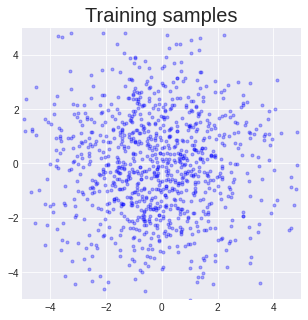

9.504249319434166e-07
38


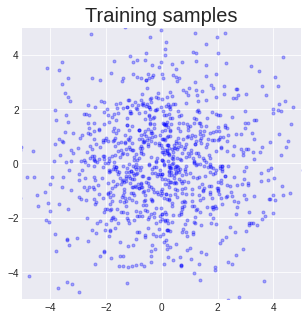

5.834037438035011e-07
39


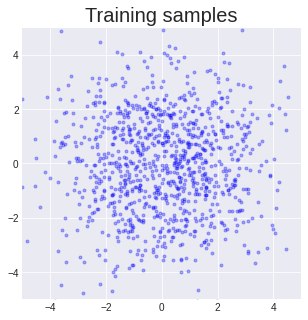

6.928732618689537e-07
40


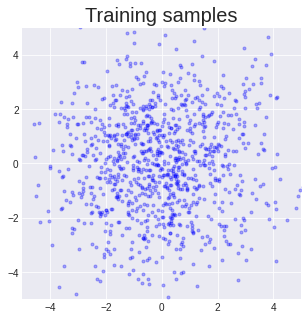

3.958083689212799e-07
41


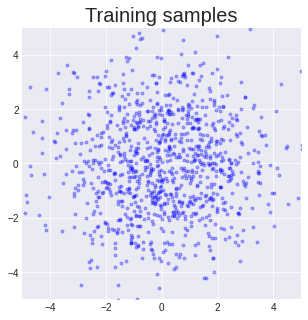

3.567412495613098e-07
42


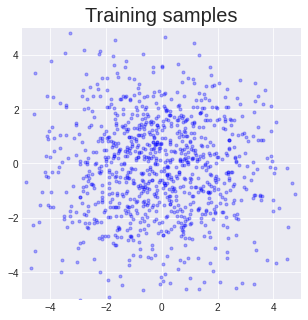

5.331169813871384e-08
43


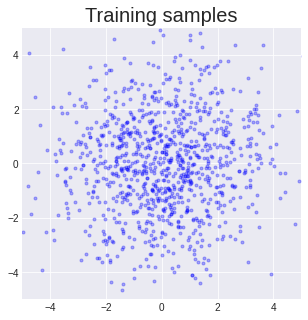

3.063119947910309e-09
44


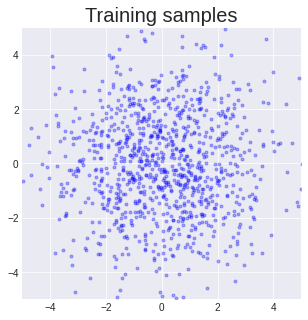

8.854921907186508e-08
45


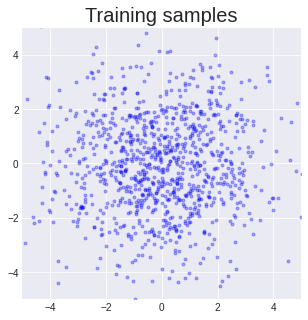

3.4722499549388887e-08
46


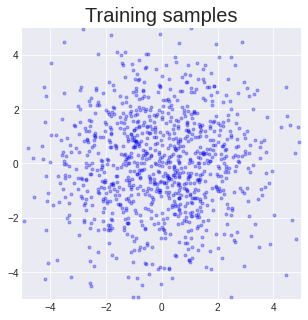

2.8520822525024413e-08
47


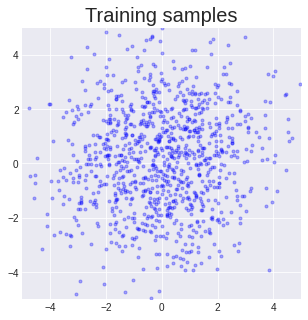

7.298868149518966e-08
48


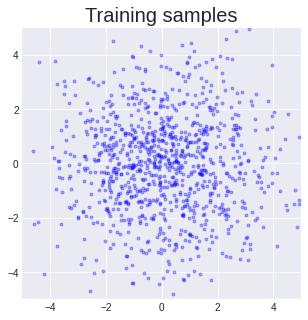

8.835094049572944e-07
49


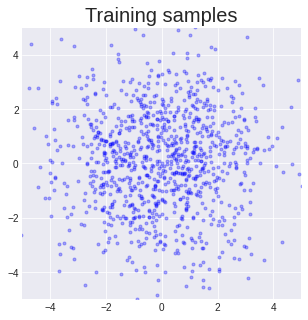

1.1546537280082702e-08
50


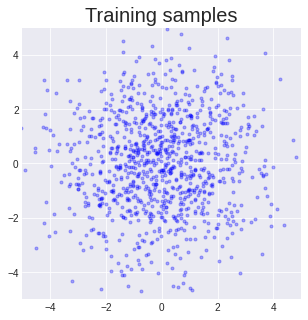

1.51860062032938e-06
51


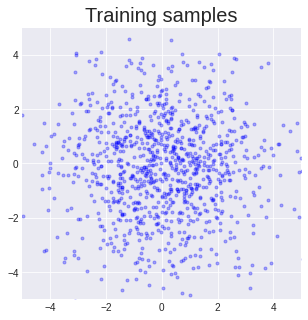

2.814636565744877e-06
52


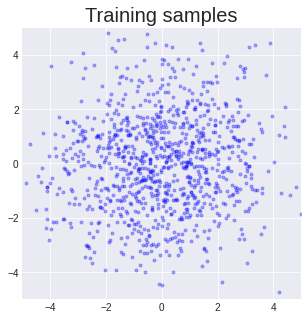

1.5537813305854799e-07
53


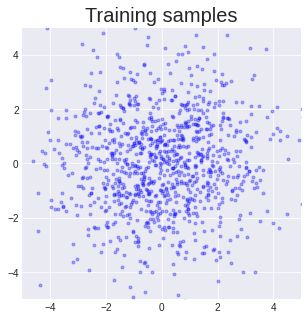

3.2819807529449463e-09
54


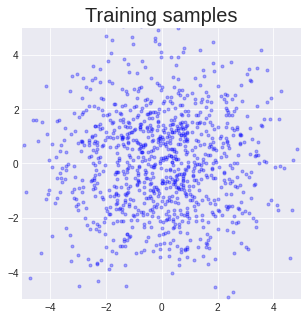

3.995373845100403e-10
55


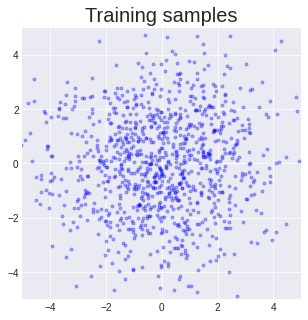

4.898756742477417e-10
56


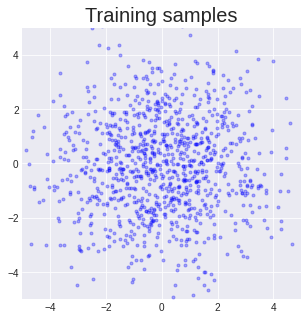

7.192958146333694e-07
57


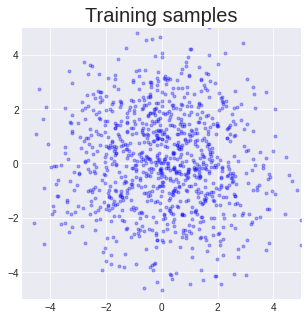

3.195665776729584e-07
58


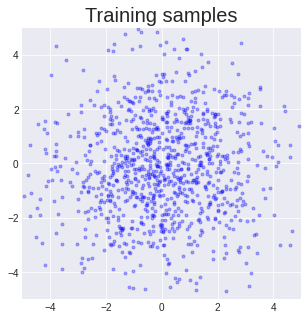

1.2967903167009353e-06
59


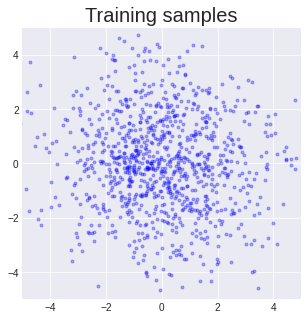

9.136600419878959e-07
60


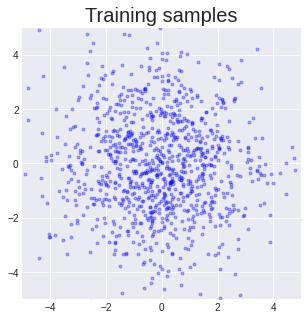

7.534399628639222e-10
61


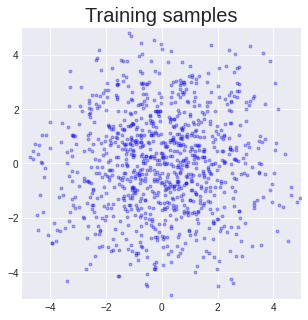

1.773238182067871e-09
62


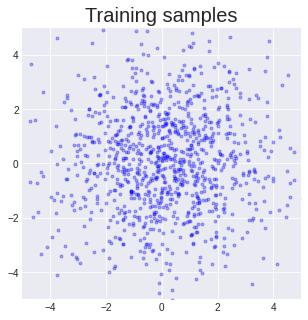

1.5469267964363098e-09
63


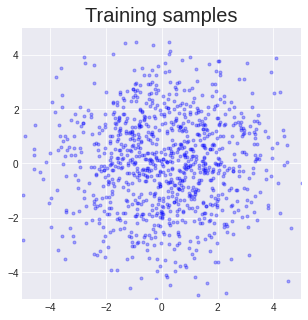

3.873641602694988e-06
64


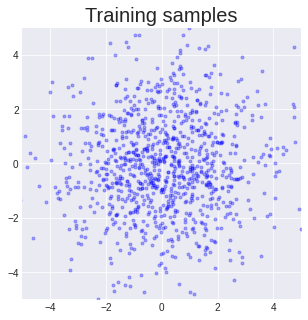

2.2989492863416672e-06
65


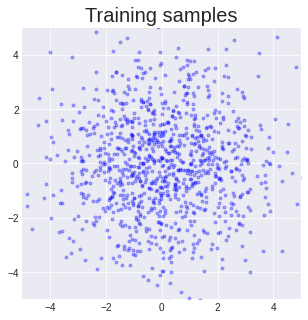

1.4134682714939117e-08
66


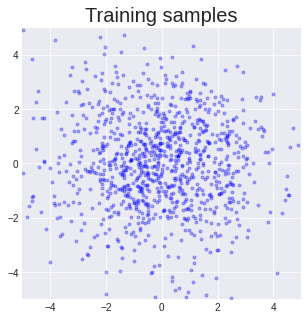

1.0450370609760285e-08
67


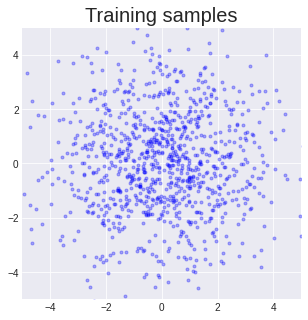

8.074566721916199e-10
68


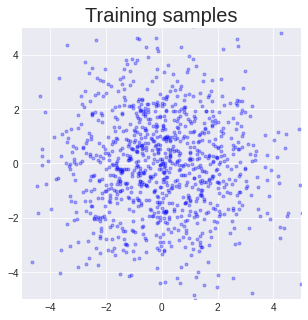

3.0640512704849245e-10
69


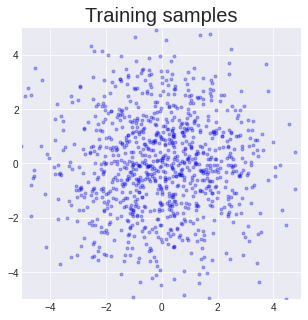

3.650784492492676e-10
70


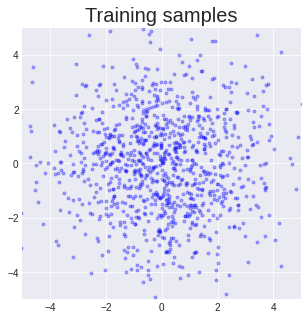

5.364418029785156e-10
71


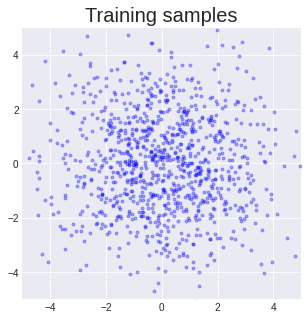

1.0384246706962585e-09
72


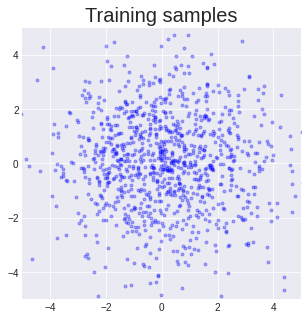

2.55415216088295e-07
73


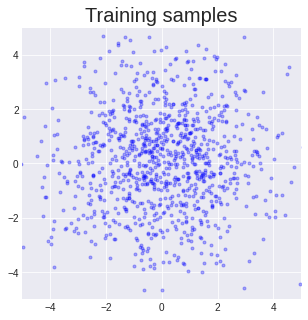

2.032509073615074e-06
74


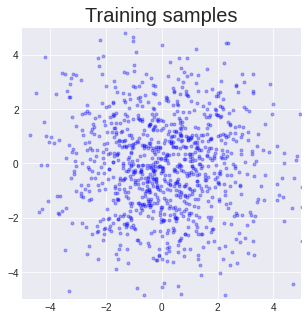

6.061606109142303e-08
75


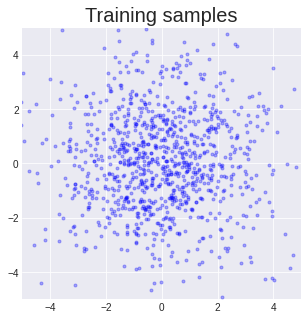

6.160233169794082e-08
76


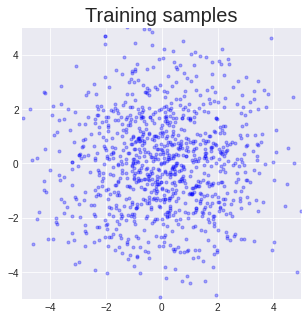

7.33393244445324e-07
77


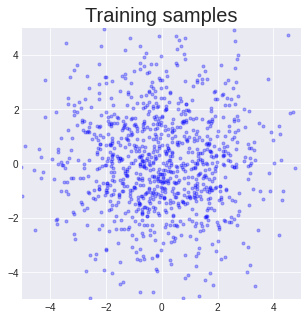

7.180152460932731e-07
78


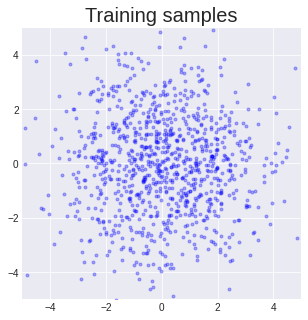

5.941838026046753e-10
79


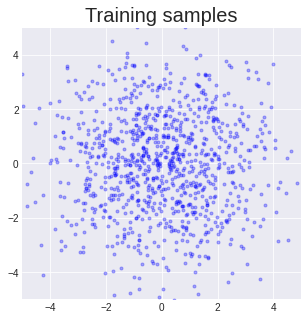

1.7881393432617188e-10
80


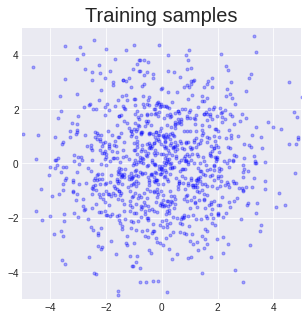

5.140900611877442e-10
81


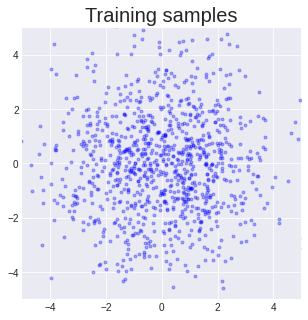

2.207234501838684e-09
82


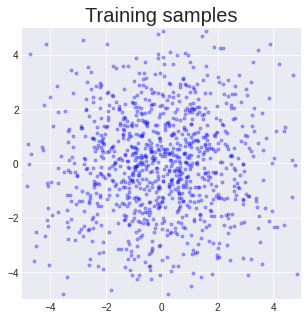

2.582240849733353e-07
83


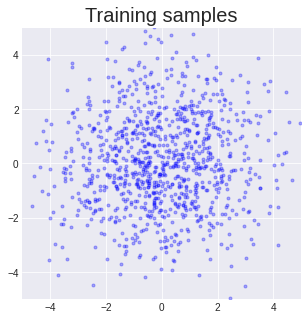

1.0736389085650443e-06
84


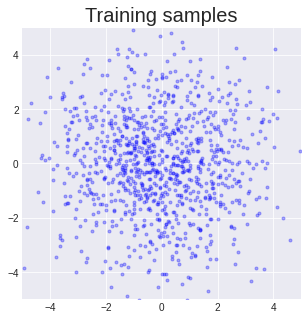

3.0357390642166134e-08
85


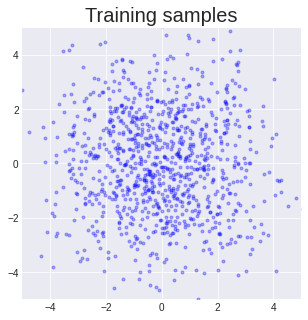

3.7081539630889895e-08
86


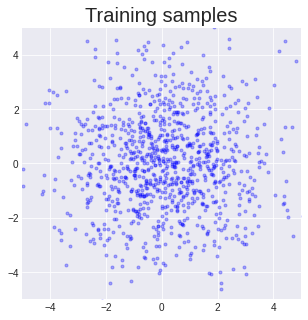

7.43623822927475e-08
87


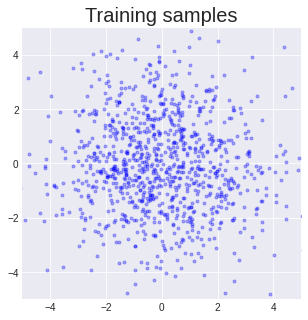

2.917712554335594e-07
88


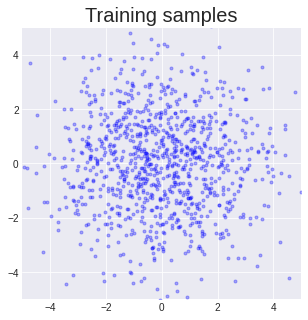

7.571009919047356e-07
89


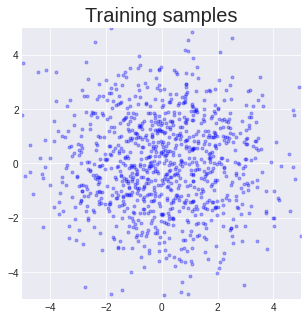

6.68894499540329e-08
90


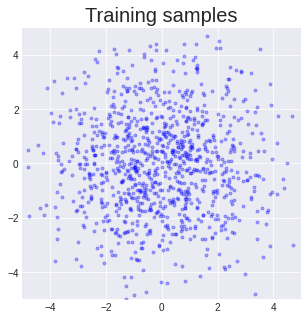

2.6975758373737335e-08
91


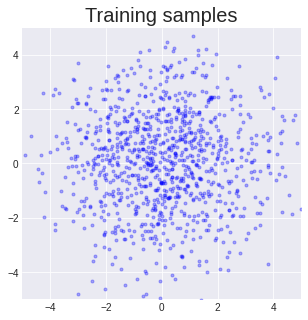

3.1980685889720915e-08
92


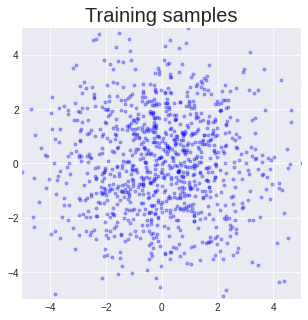

2.8135254979133605e-09
93


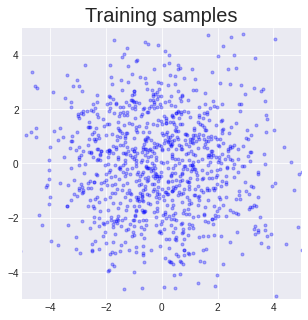

4.1507650166749954e-07
94


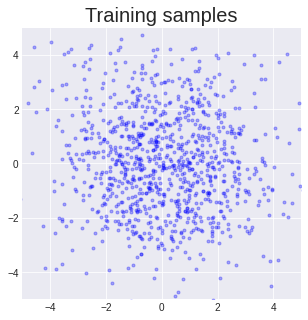

4.311325028538704e-07
95


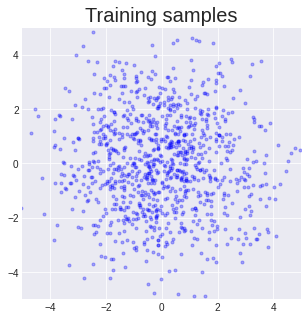

3.243610262870789e-08
96


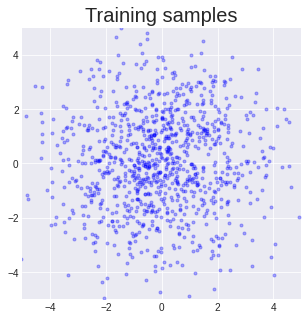

2.2677704691886902e-09
97


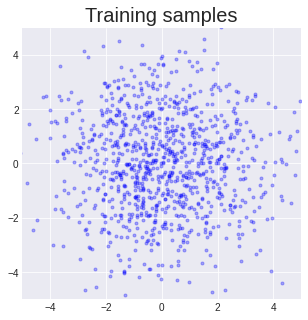

1.30385160446167e-10
98


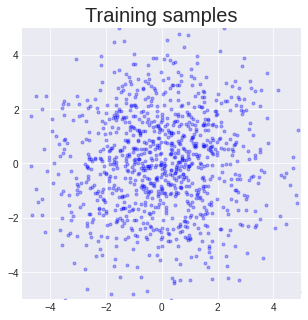

4.014931619167328e-09
99


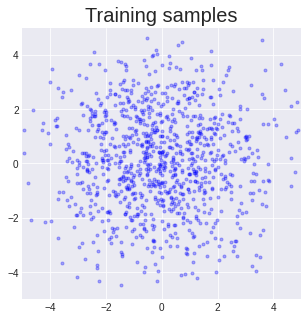

In [ ]:
Energy = FFFNet(in_chan = 2, out_chan = 2)
opt = Adam(Energy.parameters(), lr=1e-3)
#scheduler = torch.optim.lr_scheduler.StepLR(opt, step_size=10, gamma=0.2)

f_loss = nn.L1Loss()

train_dl = DataLoader(TensorDataset(X_train), batch_size=4, shuffle=True, num_workers=0)

for epoch in range(100):
  points=[]
  l_loss = []
  j=0
  for i, in train_dl:
    pos_x = i
    neg_x = torch.randn_like(pos_x)
    neg_x = sample_langevin(neg_x, Energy, 0.05, 100, intermediate_samples=False)
    point = neg_x.cpu().numpy()
    for k in range(len(point)):
      points.append(point[k].tolist())

    opt.zero_grad()

    pos_out = Energy(pos_x.cpu())
    neg_out = Energy(neg_x.cpu())

    loss = f_loss(pos_out,neg_out)
    #loss = loss.mean()
    
    loss.backward()

    torch.nn.utils.clip_grad_norm_(Energy.parameters(), max_norm=0.1)
    opt.step()

    l_loss.append(loss.item())

  print(np.mean(l_loss))
  print(epoch)

  points=np.array(points)
  xmin = -5
  xmax = 5
  ymin = -5
  ymax = 5
  plt.style.use('seaborn-darkgrid') 
  plt.figure(figsize=(5, 5))


  plt.xlim(xmin, xmax)
  plt.ylim(ymin, ymax)
  plt.title("Training samples", fontsize=20)
  #plt.scatter(X_train[:,:1], X_train[:,1:], alpha=0.5, color='gray', marker='o')
  plt.scatter(points[:,:1], points[:,1:], alpha=0.3, color='blue', marker='.')
  plt.show()


# 100 epoch result.

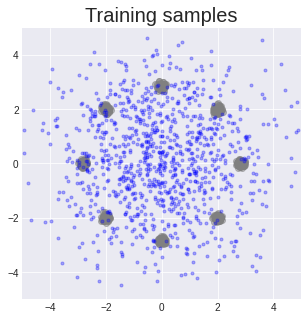

In [ ]:
  points=np.array(points)
  xmin = -5
  xmax = 5
  ymin = -5
  ymax = 5
  plt.style.use('seaborn-darkgrid') 
  plt.figure(figsize=(5, 5))


  plt.xlim(xmin, xmax)
  plt.ylim(ymin, ymax)
  plt.title("Training samples", fontsize=20)
  plt.scatter(X_train[:,:1], X_train[:,1:], alpha=0.5, color='gray', marker='o')
  plt.scatter(points[:,:1], points[:,1:], alpha=0.3, color='blue', marker='.')
  plt.show()

Example: converge but no effect on the points.

0.035103111270815134
0


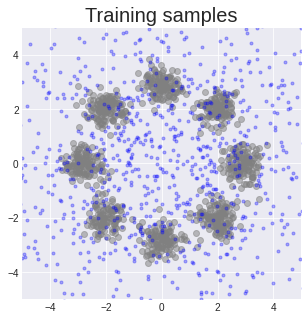

0.014777967672795057
1


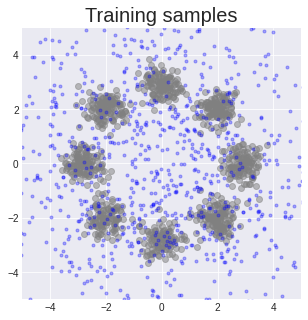

0.012910556951537729
2


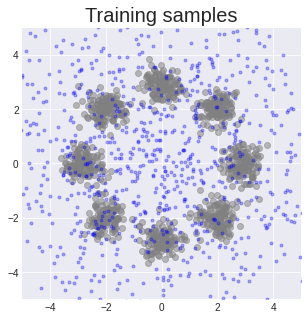

0.012208366246894002
3


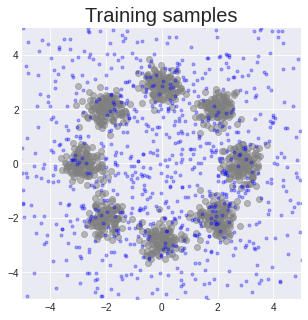

0.010711125649511814
4


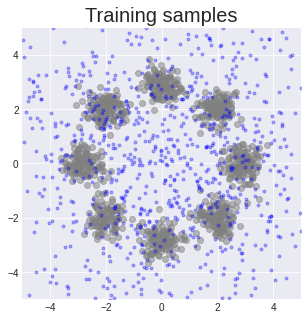

0.010006303297355771
5


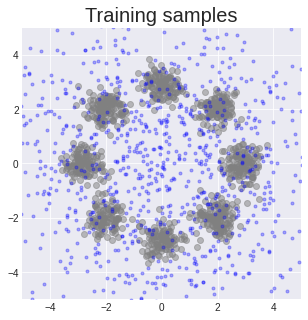

0.0094726966843009
6


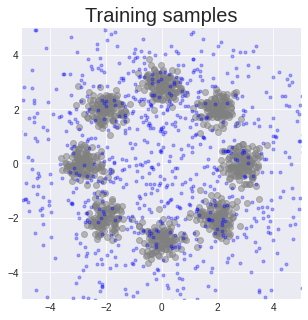

0.008654925094917417
7


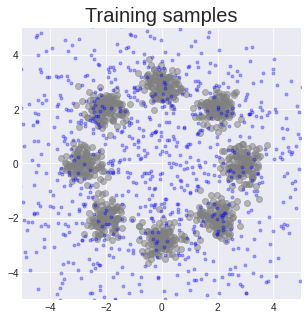

0.007971959007903933
8


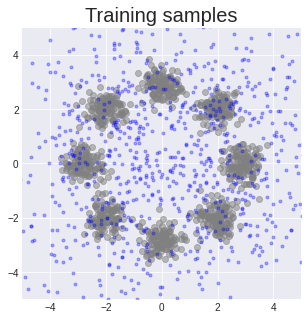

0.007536009844392538
9


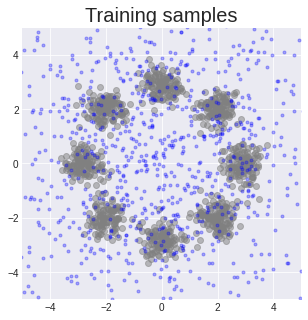

0.006724606662988662
10


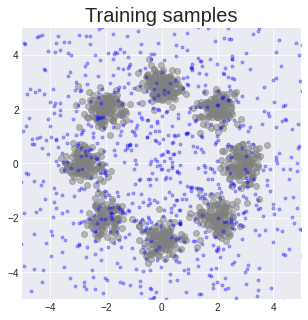

0.005912142593413591
11


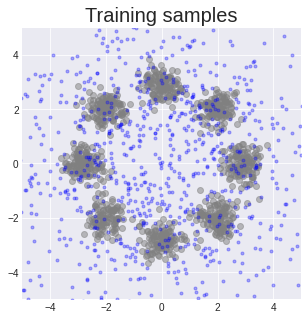

0.005577801767736673
12


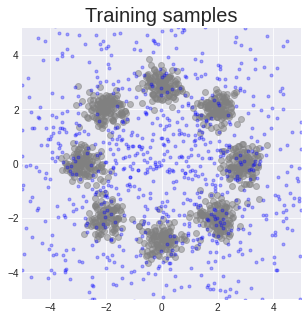

0.0056417474150657655
13


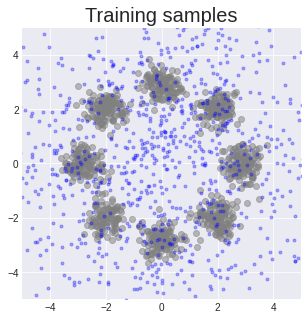

0.004788669284433126
14


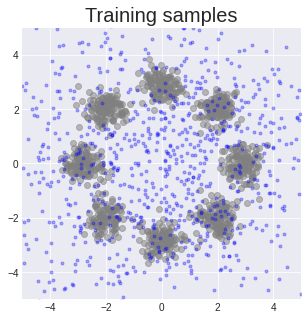

0.004197386842221021
15


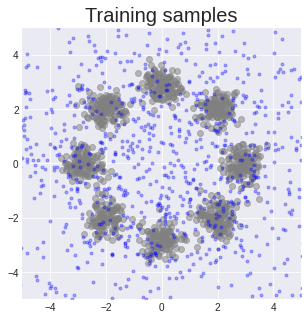

0.0042182918787002565
16


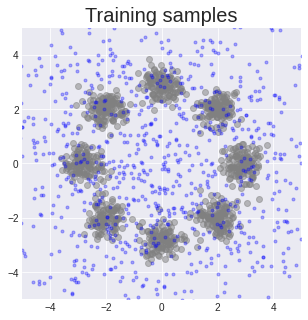

0.0035652844905853273
17


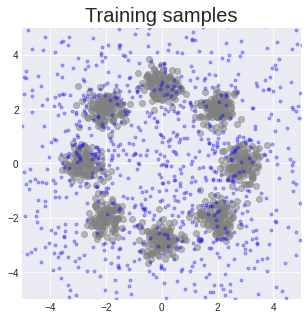

0.002797950867563486
18


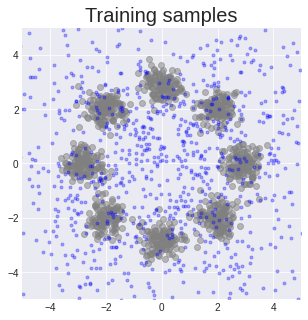

0.002921783231198788
19


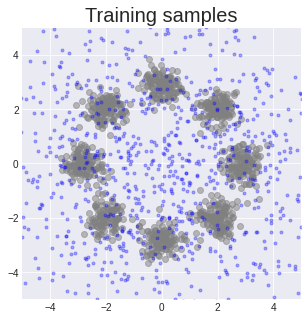

0.002250722248107195
20


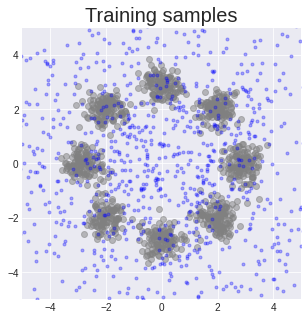

0.002257312811911106
21


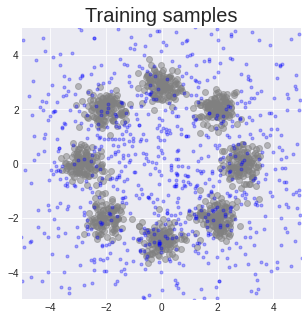

0.0018609331510961056
22


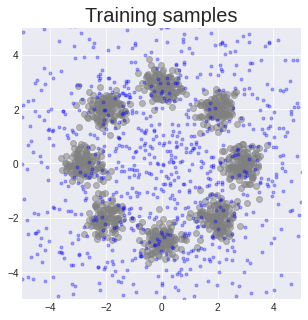

0.001677666001021862
23


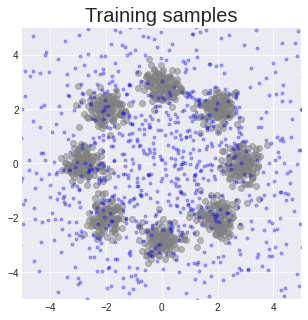

0.0013816470094025134
24


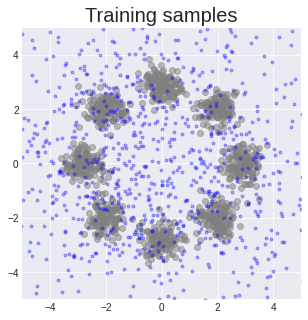

0.0010445196963846683
25


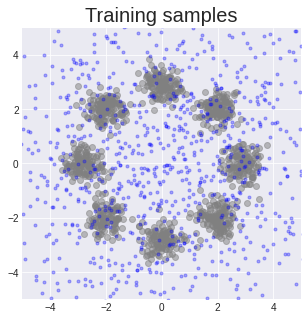

0.0008301277235150337
26


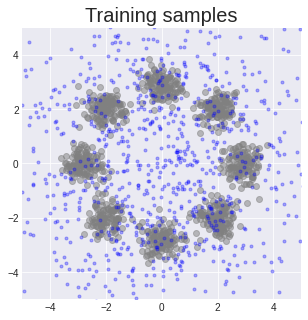

0.0006443667262792587
27


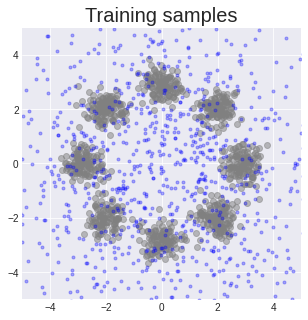

0.000404055580496788
28


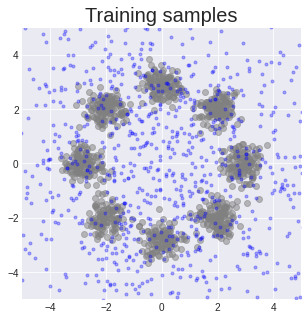

0.00033405035361647607
29


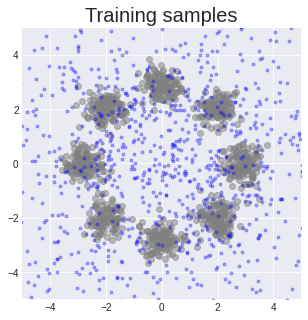

0.0001672678291797638
30


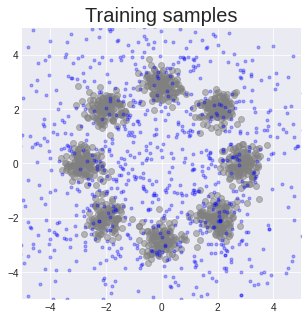

7.463570311665535e-05
31


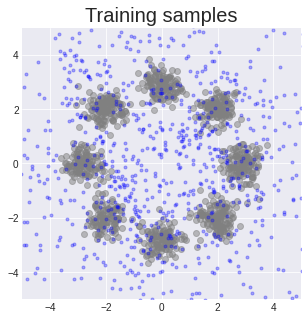

4.4204872101545336e-05
32


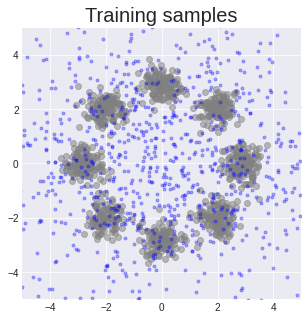

2.7385391294956207e-05
33


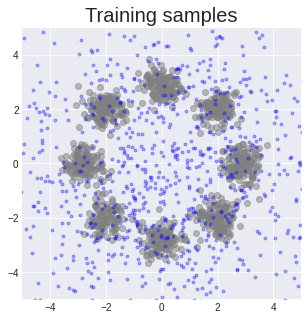

1.777523010969162e-05
34


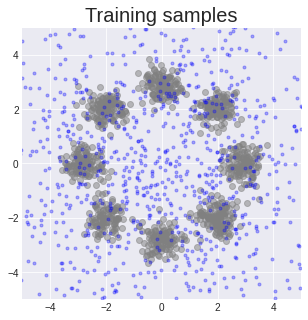

1.2904763221740723e-05
35


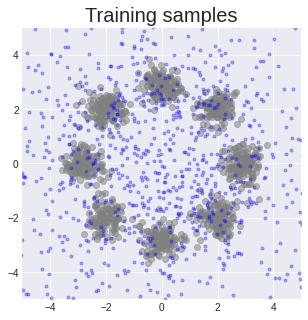

7.919378578662873e-06
36


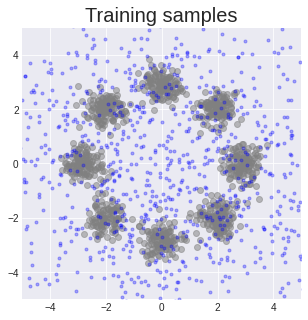

6.019383668899536e-06
37


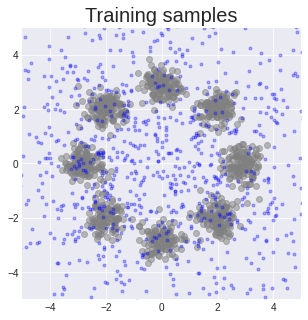

4.23671305179596e-06
38


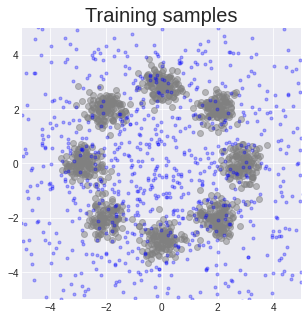

4.60013747215271e-06
39


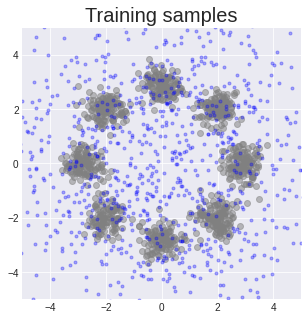

2.9143169522285463e-06
40


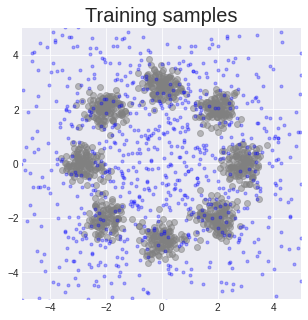

4.855375736951828e-06
41


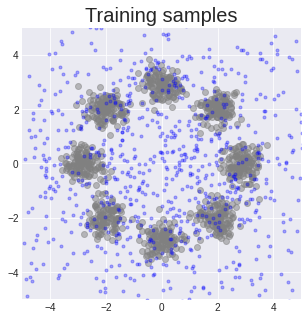

8.832037448883056e-06
42


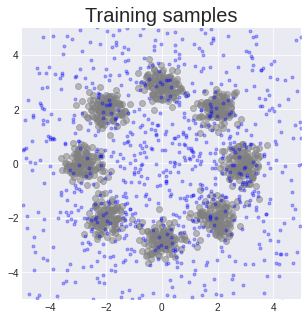

2.572536468505859e-06
43


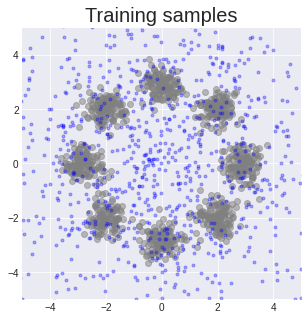

2.084340900182724e-06
44


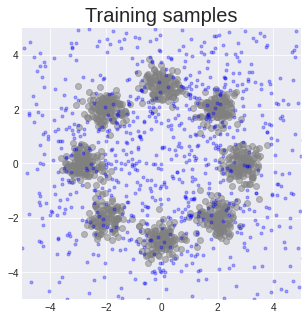

1.4663971960544585e-06
45


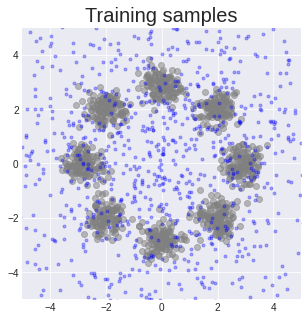

2.279389649629593e-06
46


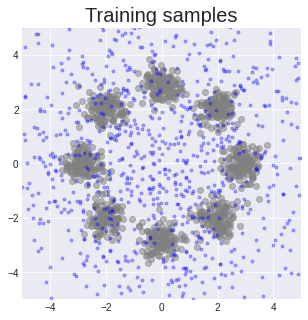

2.112496644258499e-06
47


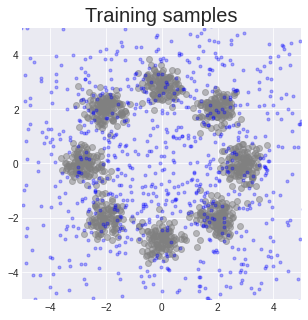

3.014974296092987e-06
48


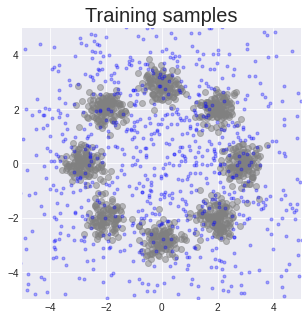

2.3372285068035125e-06
49


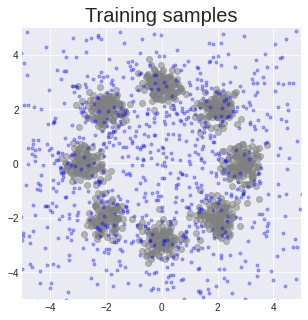

4.843812435865402e-06
50


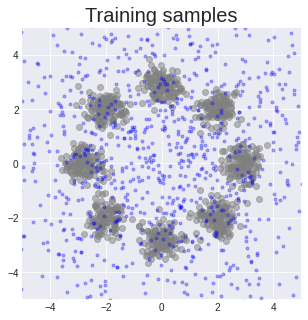

9.687233716249466e-06
51


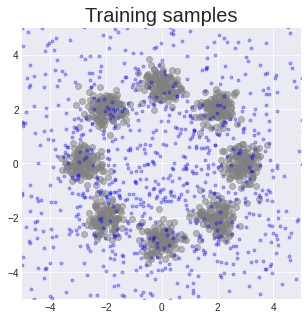

3.92235815525055e-06
52


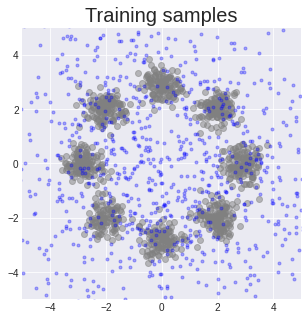

1.7825178802013397e-06
53


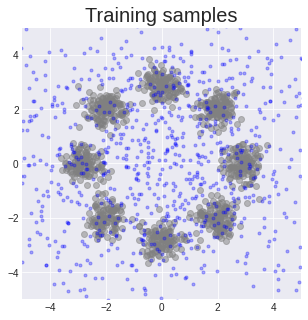

1.007217913866043e-06
54


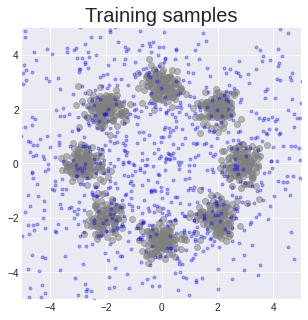

5.928013473749161e-06
55


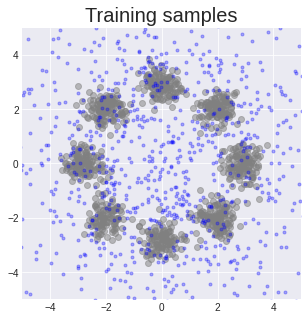

4.932694137096405e-07
56


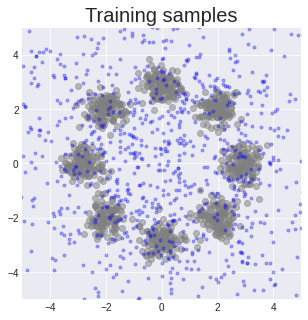

6.457865238189697e-07
57


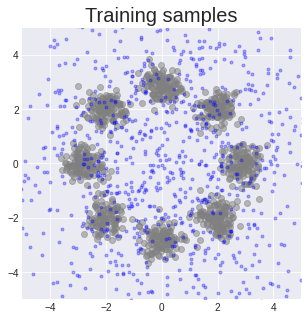

3.242716193199158e-07
58


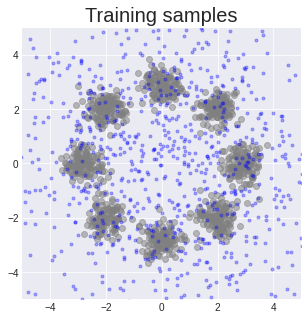

6.041936576366425e-07
59


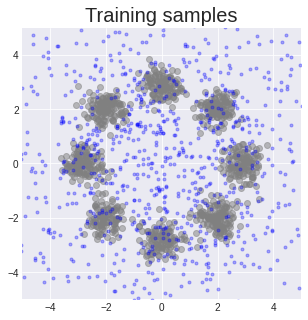

3.7968344986438753e-06
60


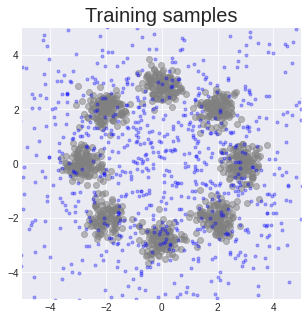

1.0138556361198424e-05
61


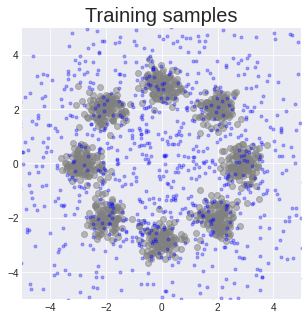

2.8766989707946776e-06
62


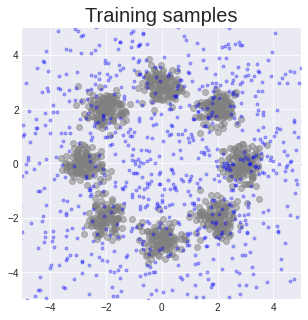

2.231299877166748e-07
63


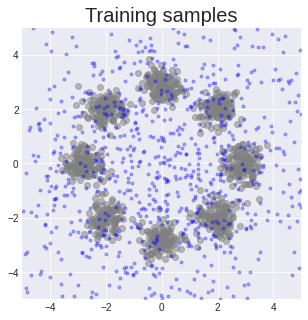

1.8299371004104614e-07
64


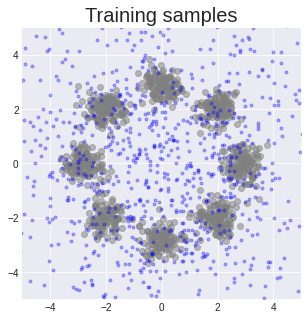

3.964528441429138e-07
65


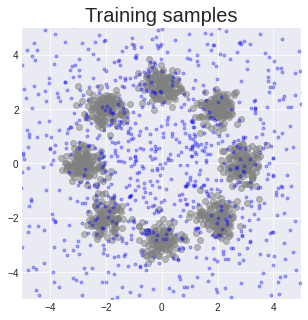

4.887469112873077e-07
66


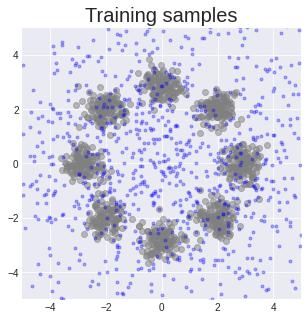

7.753919810056687e-06
67


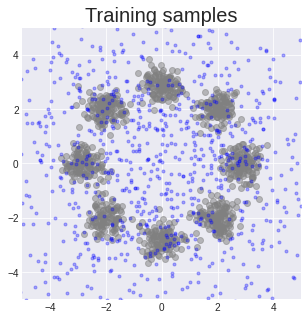

2.2096671164035798e-06
68


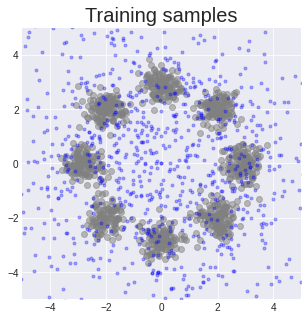

1.7989799380302428e-07
69


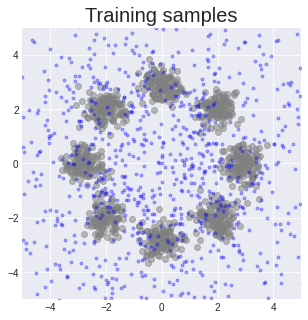

6.932914257049561e-07
70


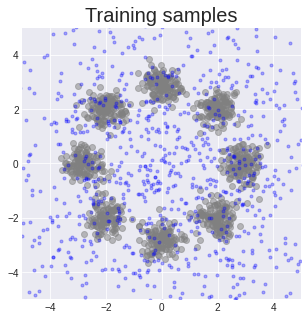

2.7337707579135895e-06
71


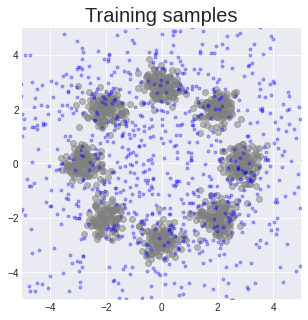

3.7606805562973024e-07
72


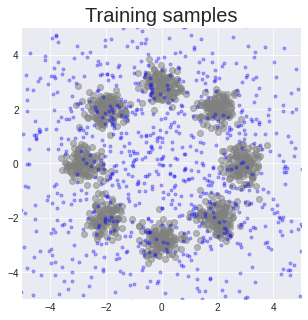

3.529813140630722e-06
73


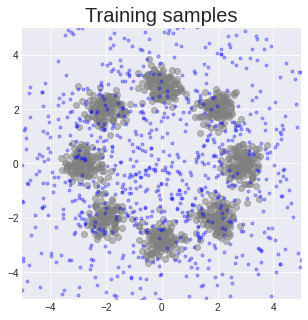

2.716638147830963e-06
74


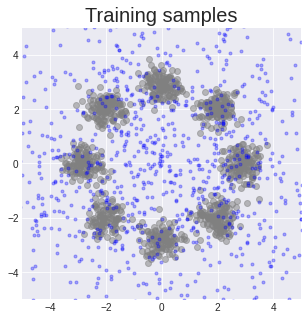

5.154281854629517e-06
75


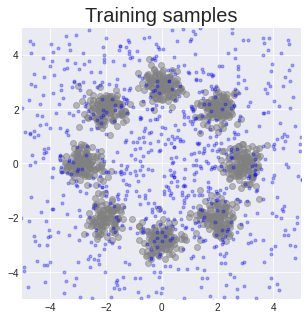

1.4425143599510192e-06
76


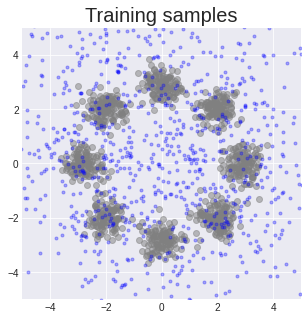

1.5951693058013916e-08
77


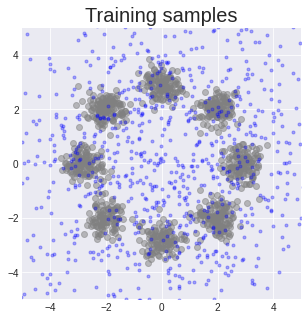

5.5495649576187135e-08
78


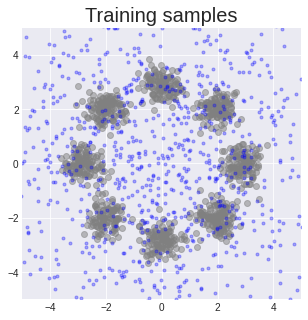

9.915605187416077e-08
79


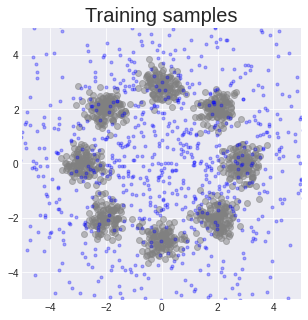

1.2680776417255401e-06
80


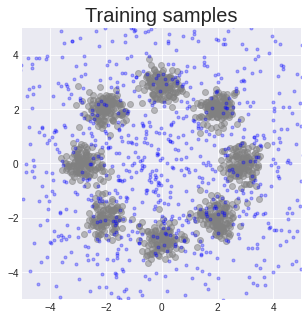

1.1035092175006867e-05
81


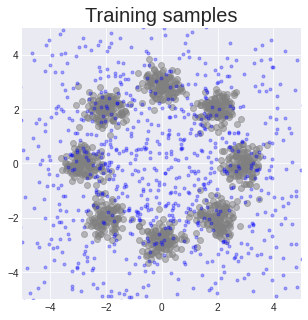

1.517023891210556e-06
82


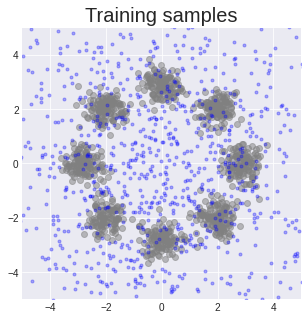

1.0260194540023804e-07
83


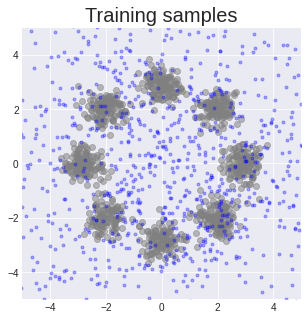

1.8514692783355712e-08
84


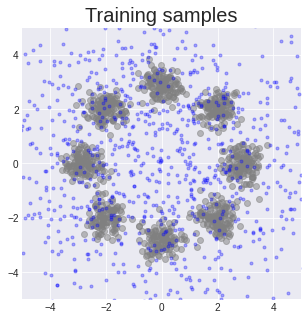

2.882257103919983e-08
85


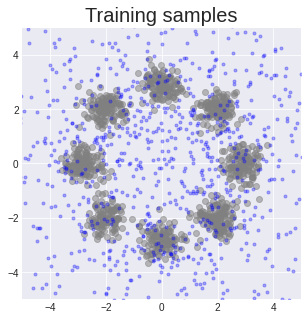

1.0003149509429932e-07
86


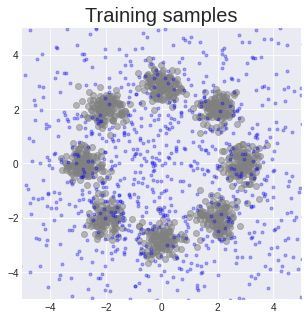

6.284914910793305e-06
87


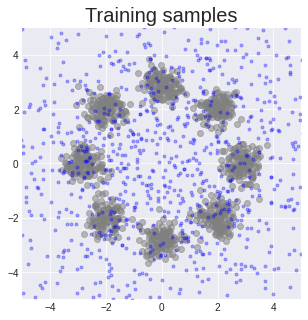

2.6088394224643705e-06
88


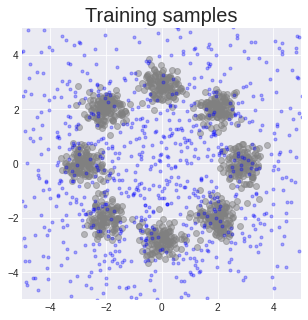

5.302615463733673e-07
89


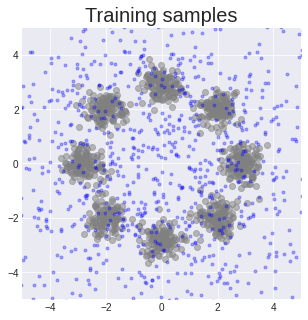

6.142258644104004e-08
90


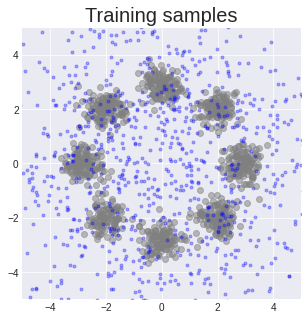

2.2063031792640687e-07
91


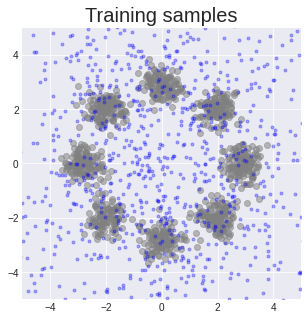

2.8710663318634034e-06
92


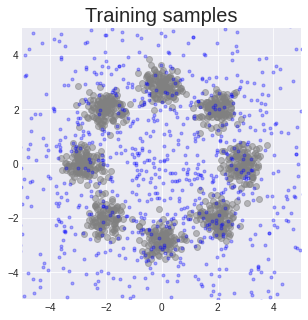

1.230429857969284e-06
93


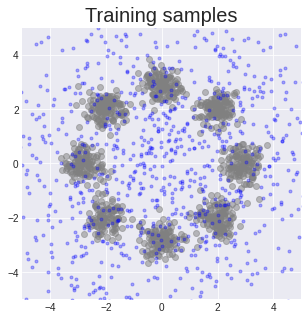

1.0021775960922242e-07
94


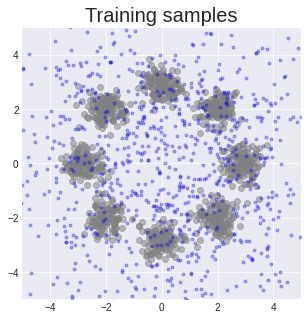

1.3758018612861634e-06
95


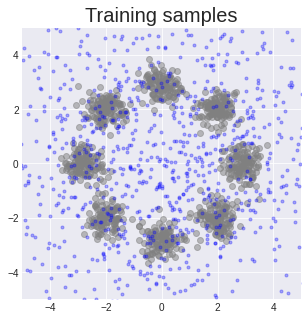

2.0513907074928286e-06
96


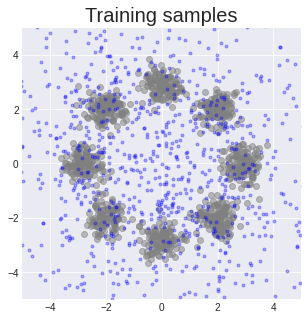

4.91989403963089e-06
97


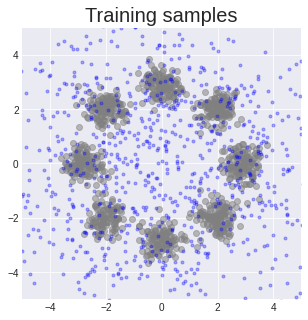

2.639804035425186e-06
98


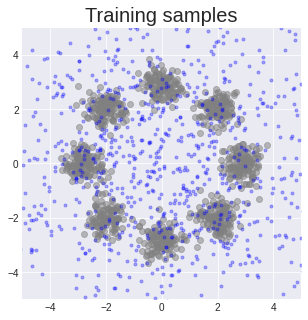

9.005144238471984e-08
99


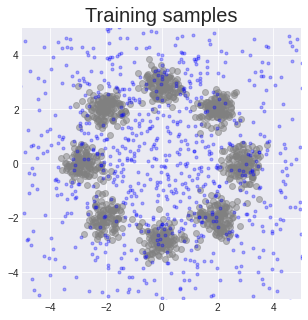

In [ ]:
Energy = FFFNet(in_chan = 2, out_chan = 2)
opt = Adam(Energy.parameters(), lr=1e-3)
#scheduler = torch.optim.lr_scheduler.StepLR(opt, step_size=10, gamma=0.2)

f_loss = nn.L1Loss()

train_dl = DataLoader(TensorDataset(X_train), batch_size=4, shuffle=True, num_workers=0)

for epoch in range(100):
  points=[]
  l_loss = []
  j=0
  for i, in train_dl:
    pos_x = i
    neg_x = torch.randn_like(pos_x)
    neg_x = sample_langevin(neg_x, Energy, 0.05, 100, intermediate_samples=False)
    point = neg_x.cpu().numpy()
    for k in range(len(point)):
      points.append(point[k].tolist())

    opt.zero_grad()

    pos_out = Energy(pos_x.cpu())
    neg_out = Energy(neg_x.cpu())

    loss = f_loss(pos_out,neg_out)
    #loss = loss.mean()
    
    loss.backward()

    torch.nn.utils.clip_grad_norm_(Energy.parameters(), max_norm=0.1)
    opt.step()

    l_loss.append(loss.item())

  print(np.mean(l_loss))
  print(epoch)

  points=np.array(points)
  xmin = -5
  xmax = 5
  ymin = -5
  ymax = 5
  plt.style.use('seaborn-darkgrid') 
  plt.figure(figsize=(5, 5))


  plt.xlim(xmin, xmax)
  plt.ylim(ymin, ymax)
  plt.title("Training samples", fontsize=20)
  plt.scatter(X_train[:,:1], X_train[:,1:], alpha=0.5, color='gray', marker='o')
  plt.scatter(points[:,:1], points[:,1:], alpha=0.3, color='blue', marker='.')
  plt.show()
